# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [77]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

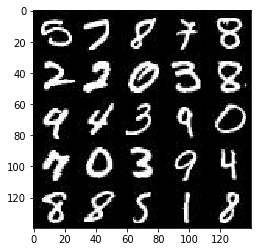

In [78]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

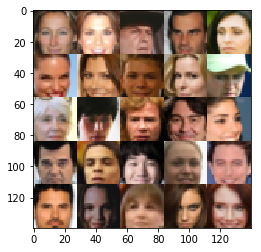

In [79]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [80]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [81]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_height, image_width, image_channels), name='real_inputs')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='z_inputs')
    learn_rate = tf.placeholder(tf.float32, name='learning_rate')
        
    return inputs_real, inputs_z, learn_rate



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [82]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    strides = 2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        layer1 = tf.layers.conv2d(images, 64, 5, strides=strides, padding='same')
        relu1 = tf.maximum(0.18 * layer1, layer1)
        # 14x14x64
        
        layer2 = tf.layers.conv2d(relu1, 128, 5, strides=strides, padding='same')
        normalised2 = tf.layers.batch_normalization(layer2, training=True)
        relu2 = tf.maximum(0.18 * normalised2, normalised2)
        # 7x7x128
        
        layer3 = tf.layers.conv2d(relu2, 256, 5, strides=strides, padding='same')
        normalised3 = tf.layers.batch_normalization(layer3, training=True)
        relu3 = tf.maximum(0.18 * normalised3, normalised3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits
    
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [83]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):

        # -> 4x4x512
        layer1 = tf.layers.dense(z, 4*4*512)
        layer1 = tf.reshape(layer1, (-1, 4, 4, 512))
        normalised1 = tf.layers.batch_normalization(layer1, training=is_train)
        leaky_relu1 = tf.maximum(0.18 * normalised1, normalised1)
        
        # -> 7x7x256
        layer2 = tf.image.resize_nearest_neighbor(leaky_relu1, (7,7))
        convolution2 = tf.layers.conv2d(layer2, 256, 5, padding='same', activation=None)
        normalised2 = tf.layers.batch_normalization(convolution2, training=is_train)
        leaky_relu2 = tf.maximum(0.18 * normalised2, normalised2)
        
        # -> 16x16x128
        layer3 = tf.image.resize_nearest_neighbor(leaky_relu2, (14,14))
        conv3 = tf.layers.conv2d(layer3, 128, 5, padding='same', activation=None)
        normalised3 = tf.layers.batch_normalization(conv3, training=is_train)
        leaky_relu3 = tf.maximum(0.18 * normalised3, normalised3)
        
        # -> 32x32x3
        layer4 = tf.image.resize_nearest_neighbor(leaky_relu3, (28,28))
        logits = tf.layers.conv2d(layer4, out_channel_dim, 5, padding='same')
        
        return tf.tanh(logits)
        
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [84]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """    
    # Calculate losses
    generator_model = generator(input_z, out_channel_dim, is_train=True)
    discriminator_model_real, discriminator_logits_real = discriminator(input_real, reuse=False)
    # Fake output generated by the generator model
    discriminator_model_fake, discriminator_logits_fake = discriminator(generator_model, reuse=True)

    # Discriminator loss
    discriminator_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_logits_real, labels = tf.ones_like(discriminator_model_real) * 0.9))
    discriminator_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_logits_fake, labels = tf.zeros_like(discriminator_model_fake)))
    discriminator_loss = discriminator_loss_fake + discriminator_loss_real
    
    # Generator loss
    generator_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=discriminator_logits_fake, labels = tf.ones_like(discriminator_model_fake)))

    return discriminator_loss, generator_loss



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [85]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get the trainable_variables, split into Generator and Discriminator parts
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [86]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [87]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """    
    losses = []
    steps = 0
    n_images = 25
        
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z , learning_rate_pl = model_inputs(image_width,image_height,image_channels,z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss,learning_rate_pl, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count): 
            for batch_images in get_batches(batch_size):
                steps = steps + 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images = batch_images * 2.0
                
                _ = sess.run(d_opt, feed_dict={input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                
                if steps % 5 == 0 :
                    train_loss_d = d_loss.eval({input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                    train_loss_g = g_loss.eval({input_real:batch_images,input_z:batch_z,learning_rate_pl:learning_rate})
                    print("Epoch {}/{} ___ ".format(epoch_i+1, epoch_count),
                      "Discriminator Loss: {:.4f} ___".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))
                
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % 50 == 0:
                    show_generator_output(sess,n_images,input_z,image_channels,data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 ___  Discriminator Loss: 0.8352 ___ Generator Loss: 1.3306
Epoch 1/2 ___  Discriminator Loss: 0.9981 ___ Generator Loss: 1.4084
Epoch 1/2 ___  Discriminator Loss: 1.5683 ___ Generator Loss: 1.5027
Epoch 1/2 ___  Discriminator Loss: 0.9054 ___ Generator Loss: 1.5043
Epoch 1/2 ___  Discriminator Loss: 1.0909 ___ Generator Loss: 1.9228
Epoch 1/2 ___  Discriminator Loss: 1.1001 ___ Generator Loss: 1.6476
Epoch 1/2 ___  Discriminator Loss: 2.0118 ___ Generator Loss: 1.6230
Epoch 1/2 ___  Discriminator Loss: 2.1759 ___ Generator Loss: 0.2521
Epoch 1/2 ___  Discriminator Loss: 1.7394 ___ Generator Loss: 0.4467
Epoch 1/2 ___  Discriminator Loss: 1.8242 ___ Generator Loss: 0.4159


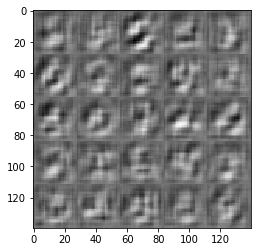

Epoch 1/2 ___  Discriminator Loss: 2.9802 ___ Generator Loss: 0.1272
Epoch 1/2 ___  Discriminator Loss: 1.5471 ___ Generator Loss: 0.5927
Epoch 1/2 ___  Discriminator Loss: 2.2794 ___ Generator Loss: 2.9082
Epoch 1/2 ___  Discriminator Loss: 2.4898 ___ Generator Loss: 0.2813
Epoch 1/2 ___  Discriminator Loss: 1.6485 ___ Generator Loss: 0.6405
Epoch 1/2 ___  Discriminator Loss: 2.8639 ___ Generator Loss: 0.1161
Epoch 1/2 ___  Discriminator Loss: 2.2110 ___ Generator Loss: 0.2178
Epoch 1/2 ___  Discriminator Loss: 1.8860 ___ Generator Loss: 0.3231
Epoch 1/2 ___  Discriminator Loss: 1.4933 ___ Generator Loss: 0.6580
Epoch 1/2 ___  Discriminator Loss: 1.5233 ___ Generator Loss: 0.7904


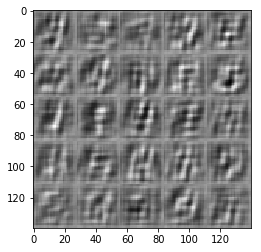

Epoch 1/2 ___  Discriminator Loss: 1.5934 ___ Generator Loss: 0.3930
Epoch 1/2 ___  Discriminator Loss: 1.2163 ___ Generator Loss: 0.6205
Epoch 1/2 ___  Discriminator Loss: 1.4650 ___ Generator Loss: 1.0694
Epoch 1/2 ___  Discriminator Loss: 1.8000 ___ Generator Loss: 0.4010
Epoch 1/2 ___  Discriminator Loss: 1.7267 ___ Generator Loss: 0.4187
Epoch 1/2 ___  Discriminator Loss: 1.4546 ___ Generator Loss: 0.6208
Epoch 1/2 ___  Discriminator Loss: 1.7171 ___ Generator Loss: 0.3290
Epoch 1/2 ___  Discriminator Loss: 1.4464 ___ Generator Loss: 0.5036
Epoch 1/2 ___  Discriminator Loss: 1.4046 ___ Generator Loss: 0.5636
Epoch 1/2 ___  Discriminator Loss: 1.6475 ___ Generator Loss: 0.5746


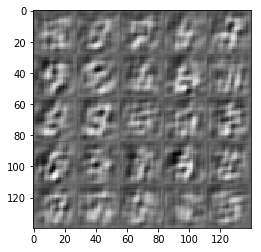

Epoch 1/2 ___  Discriminator Loss: 1.3102 ___ Generator Loss: 0.6506
Epoch 1/2 ___  Discriminator Loss: 1.5143 ___ Generator Loss: 0.4898
Epoch 1/2 ___  Discriminator Loss: 1.4359 ___ Generator Loss: 0.6453
Epoch 1/2 ___  Discriminator Loss: 1.7737 ___ Generator Loss: 0.3367
Epoch 1/2 ___  Discriminator Loss: 1.3132 ___ Generator Loss: 1.4067
Epoch 1/2 ___  Discriminator Loss: 1.6263 ___ Generator Loss: 0.4639
Epoch 1/2 ___  Discriminator Loss: 1.7040 ___ Generator Loss: 0.3268
Epoch 1/2 ___  Discriminator Loss: 1.8786 ___ Generator Loss: 0.3766
Epoch 1/2 ___  Discriminator Loss: 1.4499 ___ Generator Loss: 0.7313
Epoch 1/2 ___  Discriminator Loss: 1.6615 ___ Generator Loss: 0.3996


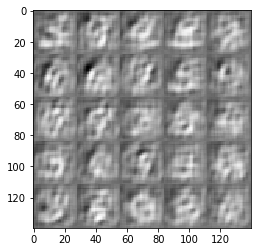

Epoch 1/2 ___  Discriminator Loss: 1.6628 ___ Generator Loss: 0.5698
Epoch 1/2 ___  Discriminator Loss: 1.9204 ___ Generator Loss: 0.2733
Epoch 1/2 ___  Discriminator Loss: 1.2025 ___ Generator Loss: 0.8745
Epoch 1/2 ___  Discriminator Loss: 1.2372 ___ Generator Loss: 0.9205
Epoch 1/2 ___  Discriminator Loss: 1.3609 ___ Generator Loss: 0.6725
Epoch 1/2 ___  Discriminator Loss: 1.8803 ___ Generator Loss: 0.3750
Epoch 1/2 ___  Discriminator Loss: 1.8602 ___ Generator Loss: 0.4565
Epoch 1/2 ___  Discriminator Loss: 1.6211 ___ Generator Loss: 0.5806
Epoch 1/2 ___  Discriminator Loss: 1.1710 ___ Generator Loss: 1.0476
Epoch 1/2 ___  Discriminator Loss: 1.3688 ___ Generator Loss: 0.6085


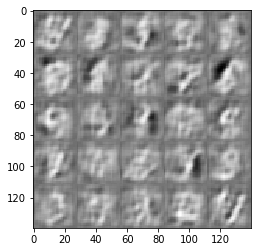

Epoch 1/2 ___  Discriminator Loss: 1.1627 ___ Generator Loss: 0.8849
Epoch 1/2 ___  Discriminator Loss: 1.2029 ___ Generator Loss: 0.7872
Epoch 1/2 ___  Discriminator Loss: 2.2479 ___ Generator Loss: 0.1827
Epoch 1/2 ___  Discriminator Loss: 1.5453 ___ Generator Loss: 0.4821
Epoch 1/2 ___  Discriminator Loss: 1.4186 ___ Generator Loss: 0.5579
Epoch 1/2 ___  Discriminator Loss: 1.2153 ___ Generator Loss: 0.7030
Epoch 1/2 ___  Discriminator Loss: 1.1713 ___ Generator Loss: 0.9076
Epoch 1/2 ___  Discriminator Loss: 1.5135 ___ Generator Loss: 0.5220
Epoch 1/2 ___  Discriminator Loss: 1.3307 ___ Generator Loss: 1.0540
Epoch 1/2 ___  Discriminator Loss: 1.8338 ___ Generator Loss: 0.3592


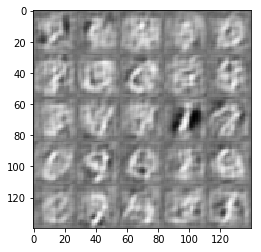

Epoch 1/2 ___  Discriminator Loss: 1.6408 ___ Generator Loss: 0.3944
Epoch 1/2 ___  Discriminator Loss: 1.2063 ___ Generator Loss: 1.4831
Epoch 1/2 ___  Discriminator Loss: 1.5938 ___ Generator Loss: 0.4637
Epoch 1/2 ___  Discriminator Loss: 1.4526 ___ Generator Loss: 0.5478
Epoch 1/2 ___  Discriminator Loss: 1.4684 ___ Generator Loss: 0.5697
Epoch 1/2 ___  Discriminator Loss: 1.4056 ___ Generator Loss: 0.7044
Epoch 1/2 ___  Discriminator Loss: 1.9906 ___ Generator Loss: 0.2562
Epoch 1/2 ___  Discriminator Loss: 1.5955 ___ Generator Loss: 0.4261
Epoch 1/2 ___  Discriminator Loss: 1.0782 ___ Generator Loss: 1.4271
Epoch 1/2 ___  Discriminator Loss: 1.1365 ___ Generator Loss: 0.8599


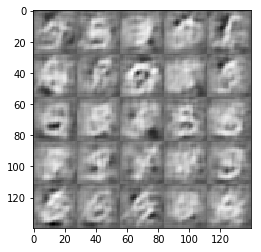

Epoch 1/2 ___  Discriminator Loss: 1.6088 ___ Generator Loss: 0.7418
Epoch 1/2 ___  Discriminator Loss: 1.2551 ___ Generator Loss: 0.7584
Epoch 1/2 ___  Discriminator Loss: 1.3764 ___ Generator Loss: 0.5707
Epoch 1/2 ___  Discriminator Loss: 1.6973 ___ Generator Loss: 0.3844
Epoch 1/2 ___  Discriminator Loss: 1.2265 ___ Generator Loss: 0.8098
Epoch 1/2 ___  Discriminator Loss: 1.3599 ___ Generator Loss: 0.7357
Epoch 1/2 ___  Discriminator Loss: 1.6206 ___ Generator Loss: 0.3856
Epoch 1/2 ___  Discriminator Loss: 1.4101 ___ Generator Loss: 0.5694
Epoch 1/2 ___  Discriminator Loss: 1.5856 ___ Generator Loss: 0.4984
Epoch 1/2 ___  Discriminator Loss: 1.1919 ___ Generator Loss: 1.0565


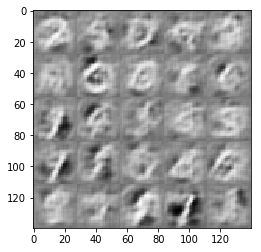

Epoch 1/2 ___  Discriminator Loss: 1.6171 ___ Generator Loss: 0.4146
Epoch 1/2 ___  Discriminator Loss: 1.7871 ___ Generator Loss: 0.3411
Epoch 1/2 ___  Discriminator Loss: 1.0398 ___ Generator Loss: 0.9948
Epoch 1/2 ___  Discriminator Loss: 1.5755 ___ Generator Loss: 0.4806
Epoch 1/2 ___  Discriminator Loss: 0.9972 ___ Generator Loss: 1.1286
Epoch 1/2 ___  Discriminator Loss: 1.2577 ___ Generator Loss: 1.7288
Epoch 1/2 ___  Discriminator Loss: 1.5486 ___ Generator Loss: 0.4882
Epoch 1/2 ___  Discriminator Loss: 1.5315 ___ Generator Loss: 0.6207
Epoch 1/2 ___  Discriminator Loss: 1.3541 ___ Generator Loss: 0.6248
Epoch 1/2 ___  Discriminator Loss: 1.3357 ___ Generator Loss: 0.5850


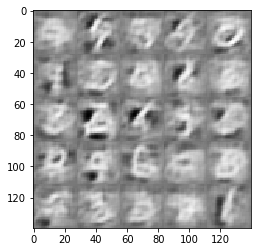

Epoch 1/2 ___  Discriminator Loss: 1.6894 ___ Generator Loss: 0.3746
Epoch 1/2 ___  Discriminator Loss: 1.4789 ___ Generator Loss: 0.6729
Epoch 1/2 ___  Discriminator Loss: 1.2830 ___ Generator Loss: 0.9742
Epoch 1/2 ___  Discriminator Loss: 1.5933 ___ Generator Loss: 0.4309
Epoch 1/2 ___  Discriminator Loss: 1.2011 ___ Generator Loss: 1.2520
Epoch 1/2 ___  Discriminator Loss: 1.2700 ___ Generator Loss: 1.0125
Epoch 1/2 ___  Discriminator Loss: 1.5331 ___ Generator Loss: 1.0379
Epoch 1/2 ___  Discriminator Loss: 1.2758 ___ Generator Loss: 0.6250
Epoch 1/2 ___  Discriminator Loss: 1.2838 ___ Generator Loss: 0.6671
Epoch 1/2 ___  Discriminator Loss: 1.2379 ___ Generator Loss: 0.7336


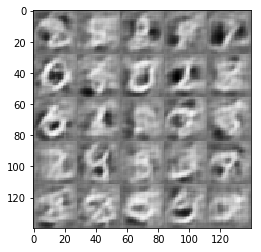

Epoch 1/2 ___  Discriminator Loss: 1.5607 ___ Generator Loss: 0.5879
Epoch 1/2 ___  Discriminator Loss: 1.4033 ___ Generator Loss: 0.5792
Epoch 1/2 ___  Discriminator Loss: 1.0833 ___ Generator Loss: 1.3085
Epoch 1/2 ___  Discriminator Loss: 1.1736 ___ Generator Loss: 0.8412
Epoch 1/2 ___  Discriminator Loss: 1.6642 ___ Generator Loss: 0.3887
Epoch 1/2 ___  Discriminator Loss: 1.2459 ___ Generator Loss: 1.8770
Epoch 1/2 ___  Discriminator Loss: 1.2303 ___ Generator Loss: 0.8645
Epoch 1/2 ___  Discriminator Loss: 1.2812 ___ Generator Loss: 0.6734
Epoch 1/2 ___  Discriminator Loss: 1.4935 ___ Generator Loss: 0.4639
Epoch 1/2 ___  Discriminator Loss: 1.7150 ___ Generator Loss: 0.3357


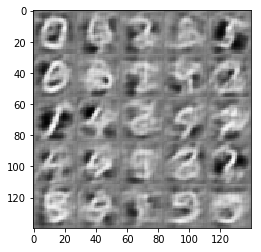

Epoch 1/2 ___  Discriminator Loss: 1.1833 ___ Generator Loss: 0.7821
Epoch 1/2 ___  Discriminator Loss: 1.1555 ___ Generator Loss: 0.8368
Epoch 1/2 ___  Discriminator Loss: 1.0264 ___ Generator Loss: 1.2118
Epoch 1/2 ___  Discriminator Loss: 1.3331 ___ Generator Loss: 0.6736
Epoch 1/2 ___  Discriminator Loss: 1.0994 ___ Generator Loss: 0.8244
Epoch 1/2 ___  Discriminator Loss: 1.3658 ___ Generator Loss: 0.4966
Epoch 1/2 ___  Discriminator Loss: 1.6175 ___ Generator Loss: 0.3951
Epoch 1/2 ___  Discriminator Loss: 1.1739 ___ Generator Loss: 0.7742
Epoch 1/2 ___  Discriminator Loss: 1.2397 ___ Generator Loss: 0.7111
Epoch 1/2 ___  Discriminator Loss: 1.1808 ___ Generator Loss: 1.1852


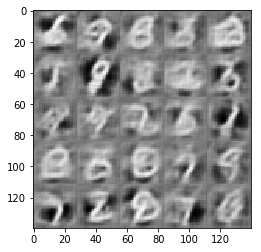

Epoch 1/2 ___  Discriminator Loss: 1.1795 ___ Generator Loss: 0.9519
Epoch 1/2 ___  Discriminator Loss: 1.2707 ___ Generator Loss: 0.6017
Epoch 1/2 ___  Discriminator Loss: 1.2878 ___ Generator Loss: 0.6798
Epoch 1/2 ___  Discriminator Loss: 1.0526 ___ Generator Loss: 1.0081
Epoch 1/2 ___  Discriminator Loss: 1.1858 ___ Generator Loss: 1.2677
Epoch 1/2 ___  Discriminator Loss: 1.6632 ___ Generator Loss: 0.4212
Epoch 1/2 ___  Discriminator Loss: 1.6755 ___ Generator Loss: 0.3659
Epoch 1/2 ___  Discriminator Loss: 1.3272 ___ Generator Loss: 0.5830
Epoch 1/2 ___  Discriminator Loss: 1.3487 ___ Generator Loss: 0.8536
Epoch 1/2 ___  Discriminator Loss: 1.3715 ___ Generator Loss: 0.6535


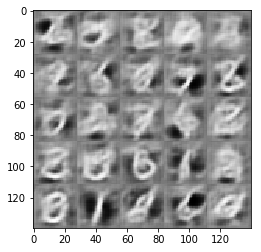

Epoch 1/2 ___  Discriminator Loss: 1.4988 ___ Generator Loss: 0.4990
Epoch 1/2 ___  Discriminator Loss: 1.5822 ___ Generator Loss: 0.3952
Epoch 1/2 ___  Discriminator Loss: 1.1647 ___ Generator Loss: 0.8391
Epoch 1/2 ___  Discriminator Loss: 1.3819 ___ Generator Loss: 1.0419
Epoch 1/2 ___  Discriminator Loss: 1.3411 ___ Generator Loss: 0.6022
Epoch 1/2 ___  Discriminator Loss: 1.3542 ___ Generator Loss: 0.5360
Epoch 1/2 ___  Discriminator Loss: 1.2221 ___ Generator Loss: 0.7713
Epoch 1/2 ___  Discriminator Loss: 1.1847 ___ Generator Loss: 0.8999
Epoch 1/2 ___  Discriminator Loss: 1.3716 ___ Generator Loss: 0.6037
Epoch 1/2 ___  Discriminator Loss: 1.2786 ___ Generator Loss: 0.6883


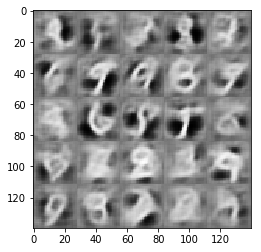

Epoch 1/2 ___  Discriminator Loss: 1.1007 ___ Generator Loss: 0.9701
Epoch 1/2 ___  Discriminator Loss: 1.0170 ___ Generator Loss: 0.9161
Epoch 1/2 ___  Discriminator Loss: 1.1434 ___ Generator Loss: 0.8301
Epoch 1/2 ___  Discriminator Loss: 1.5895 ___ Generator Loss: 0.4199
Epoch 1/2 ___  Discriminator Loss: 1.4332 ___ Generator Loss: 0.6120
Epoch 1/2 ___  Discriminator Loss: 1.6425 ___ Generator Loss: 0.4232
Epoch 1/2 ___  Discriminator Loss: 1.2353 ___ Generator Loss: 0.6391
Epoch 1/2 ___  Discriminator Loss: 1.3918 ___ Generator Loss: 0.5047
Epoch 1/2 ___  Discriminator Loss: 1.0803 ___ Generator Loss: 0.9749
Epoch 1/2 ___  Discriminator Loss: 1.4920 ___ Generator Loss: 0.4843


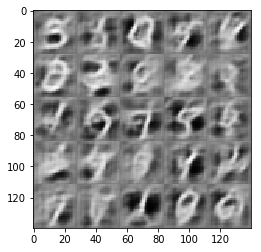

Epoch 1/2 ___  Discriminator Loss: 1.0247 ___ Generator Loss: 0.9700
Epoch 1/2 ___  Discriminator Loss: 1.0543 ___ Generator Loss: 1.2580
Epoch 1/2 ___  Discriminator Loss: 1.2761 ___ Generator Loss: 0.6402
Epoch 1/2 ___  Discriminator Loss: 1.1474 ___ Generator Loss: 0.9741
Epoch 1/2 ___  Discriminator Loss: 0.9352 ___ Generator Loss: 1.1273
Epoch 1/2 ___  Discriminator Loss: 1.4292 ___ Generator Loss: 0.5261
Epoch 1/2 ___  Discriminator Loss: 1.2965 ___ Generator Loss: 0.6169
Epoch 1/2 ___  Discriminator Loss: 1.4280 ___ Generator Loss: 0.5366
Epoch 1/2 ___  Discriminator Loss: 1.3811 ___ Generator Loss: 0.5740
Epoch 1/2 ___  Discriminator Loss: 1.3221 ___ Generator Loss: 0.5914


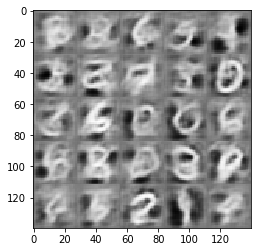

Epoch 1/2 ___  Discriminator Loss: 1.3125 ___ Generator Loss: 0.6481
Epoch 1/2 ___  Discriminator Loss: 1.3608 ___ Generator Loss: 0.4993
Epoch 1/2 ___  Discriminator Loss: 1.2687 ___ Generator Loss: 0.6708
Epoch 1/2 ___  Discriminator Loss: 1.1156 ___ Generator Loss: 0.8378
Epoch 1/2 ___  Discriminator Loss: 1.6679 ___ Generator Loss: 0.4930
Epoch 1/2 ___  Discriminator Loss: 1.6315 ___ Generator Loss: 0.4540
Epoch 1/2 ___  Discriminator Loss: 1.2466 ___ Generator Loss: 0.7887
Epoch 1/2 ___  Discriminator Loss: 1.2084 ___ Generator Loss: 1.2774
Epoch 1/2 ___  Discriminator Loss: 1.6257 ___ Generator Loss: 0.3816
Epoch 1/2 ___  Discriminator Loss: 1.2237 ___ Generator Loss: 0.7680


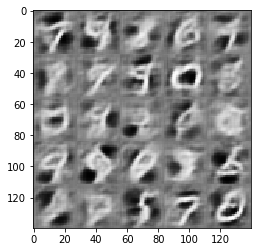

Epoch 1/2 ___  Discriminator Loss: 1.3435 ___ Generator Loss: 0.6073
Epoch 1/2 ___  Discriminator Loss: 1.2232 ___ Generator Loss: 0.7823
Epoch 1/2 ___  Discriminator Loss: 1.3836 ___ Generator Loss: 0.5636
Epoch 1/2 ___  Discriminator Loss: 1.3355 ___ Generator Loss: 0.5943
Epoch 1/2 ___  Discriminator Loss: 1.2677 ___ Generator Loss: 0.6719
Epoch 1/2 ___  Discriminator Loss: 1.3603 ___ Generator Loss: 0.6688
Epoch 1/2 ___  Discriminator Loss: 1.3913 ___ Generator Loss: 0.5776
Epoch 1/2 ___  Discriminator Loss: 1.2253 ___ Generator Loss: 0.6480
Epoch 1/2 ___  Discriminator Loss: 1.3714 ___ Generator Loss: 0.4890
Epoch 1/2 ___  Discriminator Loss: 1.1439 ___ Generator Loss: 0.7883


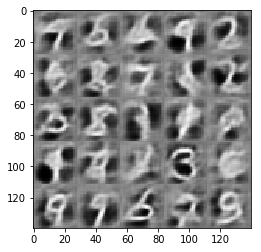

Epoch 1/2 ___  Discriminator Loss: 1.1237 ___ Generator Loss: 0.8166
Epoch 1/2 ___  Discriminator Loss: 1.2057 ___ Generator Loss: 0.8646
Epoch 1/2 ___  Discriminator Loss: 1.3598 ___ Generator Loss: 0.6044
Epoch 1/2 ___  Discriminator Loss: 1.7171 ___ Generator Loss: 0.3374
Epoch 1/2 ___  Discriminator Loss: 1.3445 ___ Generator Loss: 0.5962
Epoch 1/2 ___  Discriminator Loss: 1.3480 ___ Generator Loss: 0.6950
Epoch 1/2 ___  Discriminator Loss: 1.0834 ___ Generator Loss: 0.8840
Epoch 1/2 ___  Discriminator Loss: 1.0626 ___ Generator Loss: 1.2163
Epoch 1/2 ___  Discriminator Loss: 1.1611 ___ Generator Loss: 0.7159
Epoch 1/2 ___  Discriminator Loss: 1.0701 ___ Generator Loss: 1.5168


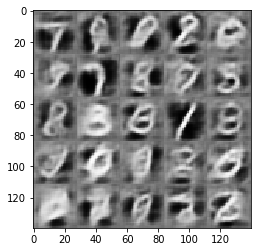

Epoch 1/2 ___  Discriminator Loss: 1.2594 ___ Generator Loss: 0.6344
Epoch 1/2 ___  Discriminator Loss: 1.5144 ___ Generator Loss: 0.4388
Epoch 1/2 ___  Discriminator Loss: 1.0341 ___ Generator Loss: 1.1667
Epoch 1/2 ___  Discriminator Loss: 1.0764 ___ Generator Loss: 1.0051
Epoch 1/2 ___  Discriminator Loss: 1.0116 ___ Generator Loss: 1.0918
Epoch 1/2 ___  Discriminator Loss: 1.6347 ___ Generator Loss: 0.4644
Epoch 1/2 ___  Discriminator Loss: 1.0674 ___ Generator Loss: 0.8918
Epoch 1/2 ___  Discriminator Loss: 1.4180 ___ Generator Loss: 0.5279
Epoch 1/2 ___  Discriminator Loss: 1.2681 ___ Generator Loss: 0.5784
Epoch 1/2 ___  Discriminator Loss: 0.8102 ___ Generator Loss: 1.5766


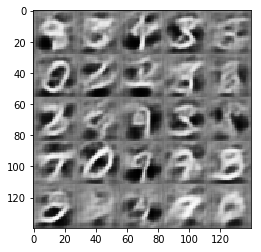

Epoch 1/2 ___  Discriminator Loss: 1.5463 ___ Generator Loss: 0.4574
Epoch 1/2 ___  Discriminator Loss: 1.0204 ___ Generator Loss: 1.2578
Epoch 1/2 ___  Discriminator Loss: 1.2998 ___ Generator Loss: 0.6300
Epoch 1/2 ___  Discriminator Loss: 1.3286 ___ Generator Loss: 0.5703
Epoch 1/2 ___  Discriminator Loss: 1.2674 ___ Generator Loss: 0.6817
Epoch 1/2 ___  Discriminator Loss: 1.0652 ___ Generator Loss: 0.9638
Epoch 1/2 ___  Discriminator Loss: 1.3819 ___ Generator Loss: 0.5989
Epoch 1/2 ___  Discriminator Loss: 1.5084 ___ Generator Loss: 0.4176
Epoch 1/2 ___  Discriminator Loss: 1.2234 ___ Generator Loss: 0.6495
Epoch 1/2 ___  Discriminator Loss: 1.2230 ___ Generator Loss: 0.7113


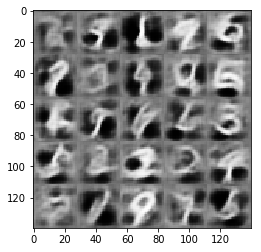

Epoch 1/2 ___  Discriminator Loss: 1.2584 ___ Generator Loss: 0.7730
Epoch 1/2 ___  Discriminator Loss: 1.2487 ___ Generator Loss: 0.8317
Epoch 1/2 ___  Discriminator Loss: 1.1036 ___ Generator Loss: 0.9159
Epoch 1/2 ___  Discriminator Loss: 1.0072 ___ Generator Loss: 1.4104
Epoch 1/2 ___  Discriminator Loss: 1.2674 ___ Generator Loss: 0.6955
Epoch 1/2 ___  Discriminator Loss: 1.2328 ___ Generator Loss: 0.7132
Epoch 1/2 ___  Discriminator Loss: 1.3360 ___ Generator Loss: 0.5403
Epoch 1/2 ___  Discriminator Loss: 1.0818 ___ Generator Loss: 0.8164
Epoch 1/2 ___  Discriminator Loss: 1.1392 ___ Generator Loss: 0.7475
Epoch 1/2 ___  Discriminator Loss: 1.2524 ___ Generator Loss: 0.8048


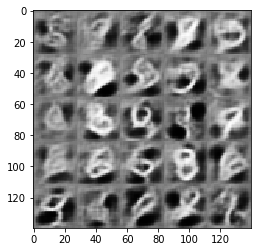

Epoch 1/2 ___  Discriminator Loss: 1.5569 ___ Generator Loss: 0.4565
Epoch 1/2 ___  Discriminator Loss: 1.0531 ___ Generator Loss: 1.0461
Epoch 1/2 ___  Discriminator Loss: 1.0185 ___ Generator Loss: 1.0547
Epoch 1/2 ___  Discriminator Loss: 1.1520 ___ Generator Loss: 1.2471
Epoch 1/2 ___  Discriminator Loss: 1.2038 ___ Generator Loss: 0.6325
Epoch 1/2 ___  Discriminator Loss: 1.2422 ___ Generator Loss: 0.6615
Epoch 1/2 ___  Discriminator Loss: 1.2859 ___ Generator Loss: 0.9632
Epoch 1/2 ___  Discriminator Loss: 1.1989 ___ Generator Loss: 0.7455
Epoch 1/2 ___  Discriminator Loss: 1.5932 ___ Generator Loss: 0.4370
Epoch 1/2 ___  Discriminator Loss: 1.2034 ___ Generator Loss: 0.8142


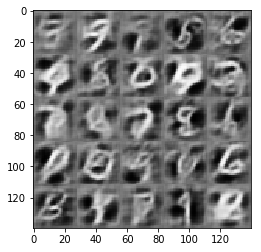

Epoch 1/2 ___  Discriminator Loss: 1.1926 ___ Generator Loss: 0.8370
Epoch 1/2 ___  Discriminator Loss: 1.3404 ___ Generator Loss: 0.5396
Epoch 1/2 ___  Discriminator Loss: 1.4438 ___ Generator Loss: 0.6386
Epoch 1/2 ___  Discriminator Loss: 1.5088 ___ Generator Loss: 0.4674
Epoch 1/2 ___  Discriminator Loss: 1.1913 ___ Generator Loss: 0.7486
Epoch 1/2 ___  Discriminator Loss: 1.0199 ___ Generator Loss: 0.9824
Epoch 1/2 ___  Discriminator Loss: 1.5668 ___ Generator Loss: 0.4333
Epoch 1/2 ___  Discriminator Loss: 1.2527 ___ Generator Loss: 0.8751
Epoch 1/2 ___  Discriminator Loss: 1.3324 ___ Generator Loss: 0.5465
Epoch 1/2 ___  Discriminator Loss: 1.1125 ___ Generator Loss: 0.8479


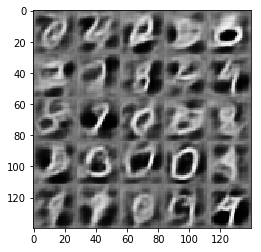

Epoch 1/2 ___  Discriminator Loss: 1.1783 ___ Generator Loss: 0.7381
Epoch 1/2 ___  Discriminator Loss: 1.0145 ___ Generator Loss: 0.9007
Epoch 1/2 ___  Discriminator Loss: 1.2411 ___ Generator Loss: 0.6844
Epoch 1/2 ___  Discriminator Loss: 1.2942 ___ Generator Loss: 0.7194
Epoch 1/2 ___  Discriminator Loss: 1.2401 ___ Generator Loss: 0.7759
Epoch 1/2 ___  Discriminator Loss: 1.3563 ___ Generator Loss: 0.5785
Epoch 1/2 ___  Discriminator Loss: 1.7690 ___ Generator Loss: 0.3566
Epoch 1/2 ___  Discriminator Loss: 1.3134 ___ Generator Loss: 0.5711
Epoch 1/2 ___  Discriminator Loss: 1.2218 ___ Generator Loss: 0.6410
Epoch 1/2 ___  Discriminator Loss: 1.1239 ___ Generator Loss: 0.7317


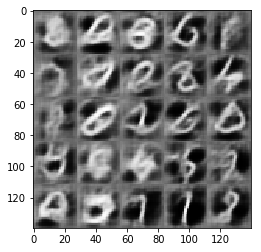

Epoch 1/2 ___  Discriminator Loss: 1.1816 ___ Generator Loss: 0.7156
Epoch 1/2 ___  Discriminator Loss: 1.1592 ___ Generator Loss: 1.0995
Epoch 1/2 ___  Discriminator Loss: 1.6515 ___ Generator Loss: 0.3437
Epoch 1/2 ___  Discriminator Loss: 1.5532 ___ Generator Loss: 0.4613
Epoch 1/2 ___  Discriminator Loss: 1.1471 ___ Generator Loss: 0.6605
Epoch 1/2 ___  Discriminator Loss: 0.9780 ___ Generator Loss: 1.3195
Epoch 1/2 ___  Discriminator Loss: 1.4295 ___ Generator Loss: 1.1012
Epoch 1/2 ___  Discriminator Loss: 1.1537 ___ Generator Loss: 0.8781
Epoch 1/2 ___  Discriminator Loss: 1.3923 ___ Generator Loss: 0.4788
Epoch 1/2 ___  Discriminator Loss: 1.0146 ___ Generator Loss: 0.9644


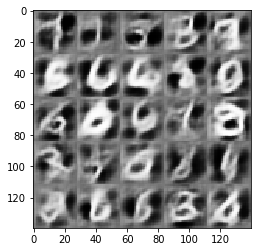

Epoch 1/2 ___  Discriminator Loss: 0.9625 ___ Generator Loss: 1.2629
Epoch 1/2 ___  Discriminator Loss: 1.3458 ___ Generator Loss: 0.5966
Epoch 1/2 ___  Discriminator Loss: 1.5860 ___ Generator Loss: 0.4035
Epoch 1/2 ___  Discriminator Loss: 1.7250 ___ Generator Loss: 0.3838
Epoch 1/2 ___  Discriminator Loss: 1.7686 ___ Generator Loss: 0.3761
Epoch 1/2 ___  Discriminator Loss: 1.5828 ___ Generator Loss: 0.4097
Epoch 1/2 ___  Discriminator Loss: 1.1827 ___ Generator Loss: 0.8638
Epoch 1/2 ___  Discriminator Loss: 0.8492 ___ Generator Loss: 1.1404
Epoch 1/2 ___  Discriminator Loss: 1.0658 ___ Generator Loss: 0.8248
Epoch 1/2 ___  Discriminator Loss: 1.2300 ___ Generator Loss: 0.6852


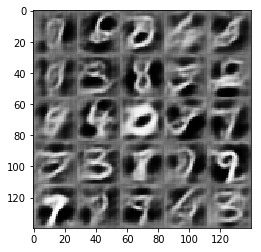

Epoch 1/2 ___  Discriminator Loss: 1.1083 ___ Generator Loss: 1.1842
Epoch 1/2 ___  Discriminator Loss: 1.2742 ___ Generator Loss: 1.2783
Epoch 1/2 ___  Discriminator Loss: 1.0198 ___ Generator Loss: 1.1665
Epoch 1/2 ___  Discriminator Loss: 1.4320 ___ Generator Loss: 0.4698
Epoch 1/2 ___  Discriminator Loss: 1.4435 ___ Generator Loss: 0.4688
Epoch 1/2 ___  Discriminator Loss: 1.0636 ___ Generator Loss: 0.9482
Epoch 1/2 ___  Discriminator Loss: 1.2052 ___ Generator Loss: 0.7511
Epoch 1/2 ___  Discriminator Loss: 1.1991 ___ Generator Loss: 1.5848
Epoch 1/2 ___  Discriminator Loss: 1.1988 ___ Generator Loss: 0.6477
Epoch 1/2 ___  Discriminator Loss: 1.4809 ___ Generator Loss: 0.4449


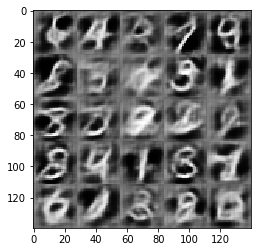

Epoch 1/2 ___  Discriminator Loss: 1.2877 ___ Generator Loss: 0.5872
Epoch 1/2 ___  Discriminator Loss: 1.0652 ___ Generator Loss: 0.8230
Epoch 1/2 ___  Discriminator Loss: 1.2243 ___ Generator Loss: 0.6888
Epoch 1/2 ___  Discriminator Loss: 1.3671 ___ Generator Loss: 0.5468
Epoch 1/2 ___  Discriminator Loss: 1.2935 ___ Generator Loss: 0.6616
Epoch 1/2 ___  Discriminator Loss: 1.2298 ___ Generator Loss: 0.7247
Epoch 1/2 ___  Discriminator Loss: 1.0685 ___ Generator Loss: 1.1468
Epoch 1/2 ___  Discriminator Loss: 1.3905 ___ Generator Loss: 0.5069
Epoch 1/2 ___  Discriminator Loss: 0.9373 ___ Generator Loss: 1.4281
Epoch 1/2 ___  Discriminator Loss: 1.0874 ___ Generator Loss: 0.8119


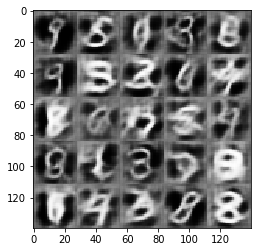

Epoch 1/2 ___  Discriminator Loss: 1.1821 ___ Generator Loss: 0.8181
Epoch 1/2 ___  Discriminator Loss: 1.4848 ___ Generator Loss: 0.4400
Epoch 1/2 ___  Discriminator Loss: 0.9261 ___ Generator Loss: 0.9803
Epoch 1/2 ___  Discriminator Loss: 1.9215 ___ Generator Loss: 0.2589
Epoch 1/2 ___  Discriminator Loss: 0.9965 ___ Generator Loss: 1.7281
Epoch 1/2 ___  Discriminator Loss: 1.7732 ___ Generator Loss: 0.3946
Epoch 1/2 ___  Discriminator Loss: 1.2243 ___ Generator Loss: 0.6266
Epoch 1/2 ___  Discriminator Loss: 1.1283 ___ Generator Loss: 0.7013
Epoch 1/2 ___  Discriminator Loss: 1.0267 ___ Generator Loss: 0.9719
Epoch 1/2 ___  Discriminator Loss: 1.3420 ___ Generator Loss: 0.5932


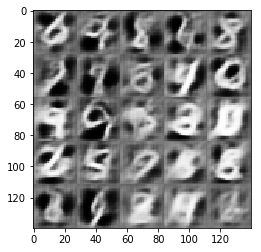

Epoch 1/2 ___  Discriminator Loss: 1.4547 ___ Generator Loss: 0.5275
Epoch 1/2 ___  Discriminator Loss: 0.9014 ___ Generator Loss: 1.6753
Epoch 1/2 ___  Discriminator Loss: 0.8278 ___ Generator Loss: 2.0733
Epoch 1/2 ___  Discriminator Loss: 1.1875 ___ Generator Loss: 0.8535
Epoch 1/2 ___  Discriminator Loss: 0.9457 ___ Generator Loss: 0.9930
Epoch 1/2 ___  Discriminator Loss: 1.4800 ___ Generator Loss: 0.4370
Epoch 1/2 ___  Discriminator Loss: 1.6074 ___ Generator Loss: 0.3639
Epoch 1/2 ___  Discriminator Loss: 1.2512 ___ Generator Loss: 0.5925
Epoch 1/2 ___  Discriminator Loss: 1.0736 ___ Generator Loss: 0.7380
Epoch 1/2 ___  Discriminator Loss: 1.2146 ___ Generator Loss: 0.8475


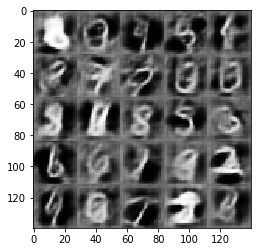

Epoch 1/2 ___  Discriminator Loss: 1.8303 ___ Generator Loss: 0.3039
Epoch 1/2 ___  Discriminator Loss: 1.2213 ___ Generator Loss: 0.6934
Epoch 1/2 ___  Discriminator Loss: 0.8471 ___ Generator Loss: 1.4075
Epoch 1/2 ___  Discriminator Loss: 1.0714 ___ Generator Loss: 0.8081
Epoch 1/2 ___  Discriminator Loss: 1.2484 ___ Generator Loss: 0.6207
Epoch 1/2 ___  Discriminator Loss: 1.2161 ___ Generator Loss: 0.6423
Epoch 1/2 ___  Discriminator Loss: 1.0056 ___ Generator Loss: 1.6312
Epoch 1/2 ___  Discriminator Loss: 1.1579 ___ Generator Loss: 0.6961
Epoch 1/2 ___  Discriminator Loss: 0.9954 ___ Generator Loss: 0.8532
Epoch 1/2 ___  Discriminator Loss: 0.8283 ___ Generator Loss: 1.0874


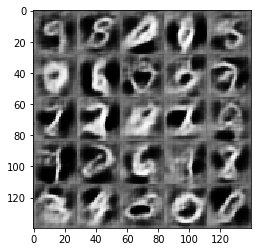

Epoch 1/2 ___  Discriminator Loss: 0.9714 ___ Generator Loss: 1.0310
Epoch 1/2 ___  Discriminator Loss: 1.9214 ___ Generator Loss: 0.2527
Epoch 1/2 ___  Discriminator Loss: 1.0833 ___ Generator Loss: 0.9417
Epoch 1/2 ___  Discriminator Loss: 0.9565 ___ Generator Loss: 1.1916
Epoch 1/2 ___  Discriminator Loss: 1.1726 ___ Generator Loss: 0.8397
Epoch 1/2 ___  Discriminator Loss: 0.9698 ___ Generator Loss: 1.0240
Epoch 1/2 ___  Discriminator Loss: 1.3307 ___ Generator Loss: 0.5454
Epoch 1/2 ___  Discriminator Loss: 0.8341 ___ Generator Loss: 1.2645
Epoch 1/2 ___  Discriminator Loss: 1.1906 ___ Generator Loss: 0.6738
Epoch 1/2 ___  Discriminator Loss: 1.3156 ___ Generator Loss: 0.5851


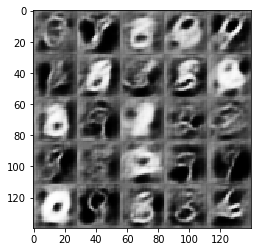

Epoch 1/2 ___  Discriminator Loss: 0.9624 ___ Generator Loss: 1.4837
Epoch 1/2 ___  Discriminator Loss: 0.9013 ___ Generator Loss: 0.8956
Epoch 1/2 ___  Discriminator Loss: 0.8474 ___ Generator Loss: 1.1887
Epoch 1/2 ___  Discriminator Loss: 0.7389 ___ Generator Loss: 1.4205
Epoch 1/2 ___  Discriminator Loss: 1.1492 ___ Generator Loss: 0.6807
Epoch 1/2 ___  Discriminator Loss: 1.0267 ___ Generator Loss: 0.8428
Epoch 1/2 ___  Discriminator Loss: 1.1875 ___ Generator Loss: 0.6695
Epoch 1/2 ___  Discriminator Loss: 1.1926 ___ Generator Loss: 0.6844
Epoch 1/2 ___  Discriminator Loss: 2.8035 ___ Generator Loss: 0.1378
Epoch 1/2 ___  Discriminator Loss: 0.9593 ___ Generator Loss: 1.0662


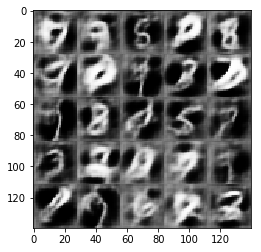

Epoch 1/2 ___  Discriminator Loss: 1.2138 ___ Generator Loss: 0.5907
Epoch 1/2 ___  Discriminator Loss: 1.2077 ___ Generator Loss: 0.6863
Epoch 1/2 ___  Discriminator Loss: 0.9842 ___ Generator Loss: 1.2494
Epoch 1/2 ___  Discriminator Loss: 0.8803 ___ Generator Loss: 1.1990
Epoch 1/2 ___  Discriminator Loss: 1.0170 ___ Generator Loss: 1.7252
Epoch 1/2 ___  Discriminator Loss: 0.6714 ___ Generator Loss: 1.6736
Epoch 1/2 ___  Discriminator Loss: 1.3323 ___ Generator Loss: 1.7130
Epoch 1/2 ___  Discriminator Loss: 1.0995 ___ Generator Loss: 1.0943
Epoch 1/2 ___  Discriminator Loss: 1.0647 ___ Generator Loss: 0.8493
Epoch 1/2 ___  Discriminator Loss: 0.8397 ___ Generator Loss: 1.1114


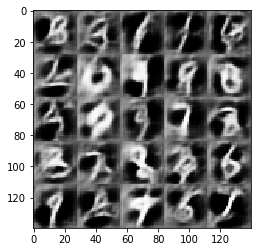

Epoch 1/2 ___  Discriminator Loss: 0.7627 ___ Generator Loss: 1.3865
Epoch 1/2 ___  Discriminator Loss: 1.3485 ___ Generator Loss: 2.3346
Epoch 1/2 ___  Discriminator Loss: 0.8606 ___ Generator Loss: 1.2797
Epoch 1/2 ___  Discriminator Loss: 1.1532 ___ Generator Loss: 0.6924
Epoch 1/2 ___  Discriminator Loss: 1.7153 ___ Generator Loss: 0.3599
Epoch 1/2 ___  Discriminator Loss: 0.9052 ___ Generator Loss: 0.9878
Epoch 1/2 ___  Discriminator Loss: 1.1113 ___ Generator Loss: 0.7974
Epoch 1/2 ___  Discriminator Loss: 3.1173 ___ Generator Loss: 3.5872
Epoch 1/2 ___  Discriminator Loss: 1.1071 ___ Generator Loss: 0.7884
Epoch 1/2 ___  Discriminator Loss: 1.1790 ___ Generator Loss: 0.6502


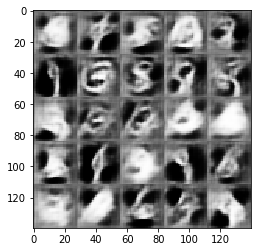

Epoch 1/2 ___  Discriminator Loss: 0.8524 ___ Generator Loss: 1.1676
Epoch 1/2 ___  Discriminator Loss: 0.9078 ___ Generator Loss: 1.0395
Epoch 1/2 ___  Discriminator Loss: 0.9887 ___ Generator Loss: 0.8502
Epoch 1/2 ___  Discriminator Loss: 1.0124 ___ Generator Loss: 0.7673
Epoch 1/2 ___  Discriminator Loss: 1.3252 ___ Generator Loss: 0.5786
Epoch 1/2 ___  Discriminator Loss: 1.5558 ___ Generator Loss: 0.4689
Epoch 1/2 ___  Discriminator Loss: 0.6521 ___ Generator Loss: 1.6417
Epoch 1/2 ___  Discriminator Loss: 0.8075 ___ Generator Loss: 1.2657
Epoch 1/2 ___  Discriminator Loss: 0.7988 ___ Generator Loss: 1.2892
Epoch 1/2 ___  Discriminator Loss: 0.9775 ___ Generator Loss: 0.9397


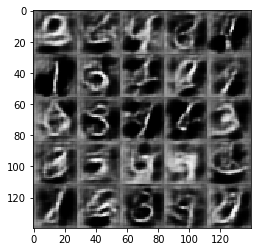

Epoch 1/2 ___  Discriminator Loss: 1.1111 ___ Generator Loss: 0.7312
Epoch 1/2 ___  Discriminator Loss: 2.0885 ___ Generator Loss: 0.2587
Epoch 1/2 ___  Discriminator Loss: 0.9581 ___ Generator Loss: 0.9537
Epoch 1/2 ___  Discriminator Loss: 1.4247 ___ Generator Loss: 0.5174
Epoch 1/2 ___  Discriminator Loss: 1.1739 ___ Generator Loss: 3.2590
Epoch 1/2 ___  Discriminator Loss: 0.9105 ___ Generator Loss: 1.0328
Epoch 1/2 ___  Discriminator Loss: 0.8419 ___ Generator Loss: 1.1346
Epoch 1/2 ___  Discriminator Loss: 0.8590 ___ Generator Loss: 1.0614
Epoch 1/2 ___  Discriminator Loss: 1.2146 ___ Generator Loss: 0.6379
Epoch 1/2 ___  Discriminator Loss: 1.4830 ___ Generator Loss: 2.7609


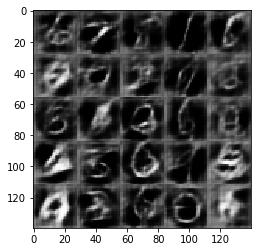

Epoch 1/2 ___  Discriminator Loss: 0.7802 ___ Generator Loss: 1.3170
Epoch 1/2 ___  Discriminator Loss: 1.2994 ___ Generator Loss: 0.6328
Epoch 1/2 ___  Discriminator Loss: 0.8978 ___ Generator Loss: 1.0645
Epoch 1/2 ___  Discriminator Loss: 0.9936 ___ Generator Loss: 1.1582
Epoch 1/2 ___  Discriminator Loss: 0.8834 ___ Generator Loss: 0.9226
Epoch 1/2 ___  Discriminator Loss: 0.8534 ___ Generator Loss: 1.6578
Epoch 1/2 ___  Discriminator Loss: 0.6862 ___ Generator Loss: 1.3826
Epoch 1/2 ___  Discriminator Loss: 0.7912 ___ Generator Loss: 1.0859
Epoch 1/2 ___  Discriminator Loss: 1.1502 ___ Generator Loss: 0.7478
Epoch 1/2 ___  Discriminator Loss: 1.0136 ___ Generator Loss: 0.8302


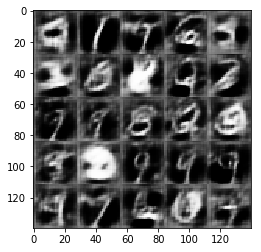

Epoch 1/2 ___  Discriminator Loss: 0.8149 ___ Generator Loss: 1.2033
Epoch 1/2 ___  Discriminator Loss: 0.6399 ___ Generator Loss: 1.8570
Epoch 1/2 ___  Discriminator Loss: 0.6339 ___ Generator Loss: 1.8261
Epoch 1/2 ___  Discriminator Loss: 1.6841 ___ Generator Loss: 0.3888
Epoch 1/2 ___  Discriminator Loss: 0.9605 ___ Generator Loss: 0.9352
Epoch 1/2 ___  Discriminator Loss: 0.6248 ___ Generator Loss: 1.6306
Epoch 1/2 ___  Discriminator Loss: 0.6784 ___ Generator Loss: 1.6190
Epoch 1/2 ___  Discriminator Loss: 0.6932 ___ Generator Loss: 1.6367
Epoch 1/2 ___  Discriminator Loss: 0.7346 ___ Generator Loss: 1.4742
Epoch 1/2 ___  Discriminator Loss: 1.1854 ___ Generator Loss: 1.3786


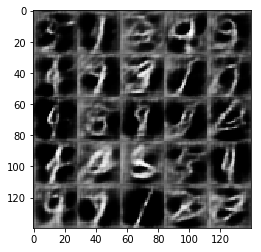

Epoch 1/2 ___  Discriminator Loss: 1.0748 ___ Generator Loss: 0.7609
Epoch 1/2 ___  Discriminator Loss: 3.0350 ___ Generator Loss: 0.0946
Epoch 1/2 ___  Discriminator Loss: 1.1281 ___ Generator Loss: 0.8604
Epoch 1/2 ___  Discriminator Loss: 0.8286 ___ Generator Loss: 1.0876
Epoch 1/2 ___  Discriminator Loss: 0.9533 ___ Generator Loss: 1.0444
Epoch 1/2 ___  Discriminator Loss: 1.7721 ___ Generator Loss: 0.3313
Epoch 1/2 ___  Discriminator Loss: 0.9218 ___ Generator Loss: 1.0120
Epoch 1/2 ___  Discriminator Loss: 0.7740 ___ Generator Loss: 1.2552
Epoch 1/2 ___  Discriminator Loss: 0.5452 ___ Generator Loss: 2.1119
Epoch 1/2 ___  Discriminator Loss: 1.3107 ___ Generator Loss: 0.5771


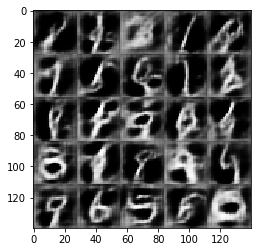

Epoch 1/2 ___  Discriminator Loss: 0.6501 ___ Generator Loss: 1.7059
Epoch 1/2 ___  Discriminator Loss: 1.7098 ___ Generator Loss: 0.3562
Epoch 1/2 ___  Discriminator Loss: 0.9853 ___ Generator Loss: 1.1564
Epoch 1/2 ___  Discriminator Loss: 0.9179 ___ Generator Loss: 1.1030
Epoch 1/2 ___  Discriminator Loss: 1.1552 ___ Generator Loss: 0.7334
Epoch 1/2 ___  Discriminator Loss: 0.8412 ___ Generator Loss: 1.3719
Epoch 1/2 ___  Discriminator Loss: 0.7126 ___ Generator Loss: 1.3317
Epoch 1/2 ___  Discriminator Loss: 0.6332 ___ Generator Loss: 1.5177
Epoch 1/2 ___  Discriminator Loss: 0.6683 ___ Generator Loss: 2.0309
Epoch 1/2 ___  Discriminator Loss: 0.7755 ___ Generator Loss: 1.8096


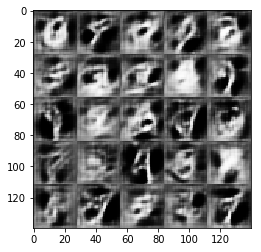

Epoch 1/2 ___  Discriminator Loss: 1.3173 ___ Generator Loss: 0.5824
Epoch 1/2 ___  Discriminator Loss: 0.9476 ___ Generator Loss: 0.9125
Epoch 1/2 ___  Discriminator Loss: 1.4431 ___ Generator Loss: 0.4651
Epoch 1/2 ___  Discriminator Loss: 0.7173 ___ Generator Loss: 2.1622
Epoch 1/2 ___  Discriminator Loss: 1.1036 ___ Generator Loss: 0.7921
Epoch 1/2 ___  Discriminator Loss: 1.9780 ___ Generator Loss: 0.4141
Epoch 1/2 ___  Discriminator Loss: 0.7518 ___ Generator Loss: 1.3221
Epoch 1/2 ___  Discriminator Loss: 1.1227 ___ Generator Loss: 0.8027
Epoch 1/2 ___  Discriminator Loss: 0.9273 ___ Generator Loss: 1.0146
Epoch 1/2 ___  Discriminator Loss: 0.7014 ___ Generator Loss: 1.4118


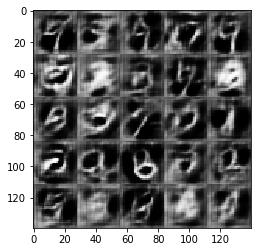

Epoch 1/2 ___  Discriminator Loss: 0.9003 ___ Generator Loss: 1.0668
Epoch 1/2 ___  Discriminator Loss: 0.8483 ___ Generator Loss: 1.0379
Epoch 1/2 ___  Discriminator Loss: 1.0186 ___ Generator Loss: 0.9668
Epoch 1/2 ___  Discriminator Loss: 0.9711 ___ Generator Loss: 0.8583
Epoch 1/2 ___  Discriminator Loss: 0.8605 ___ Generator Loss: 1.0210
Epoch 1/2 ___  Discriminator Loss: 1.2092 ___ Generator Loss: 0.6081
Epoch 1/2 ___  Discriminator Loss: 0.7093 ___ Generator Loss: 1.4981
Epoch 1/2 ___  Discriminator Loss: 2.5509 ___ Generator Loss: 0.2006
Epoch 1/2 ___  Discriminator Loss: 1.5696 ___ Generator Loss: 0.4791
Epoch 1/2 ___  Discriminator Loss: 0.8575 ___ Generator Loss: 1.7462


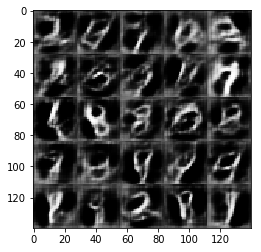

Epoch 1/2 ___  Discriminator Loss: 1.6708 ___ Generator Loss: 0.6088
Epoch 1/2 ___  Discriminator Loss: 1.7505 ___ Generator Loss: 0.3322
Epoch 1/2 ___  Discriminator Loss: 1.1275 ___ Generator Loss: 0.8004
Epoch 1/2 ___  Discriminator Loss: 1.0588 ___ Generator Loss: 0.7639
Epoch 1/2 ___  Discriminator Loss: 0.8913 ___ Generator Loss: 0.9642
Epoch 1/2 ___  Discriminator Loss: 0.6510 ___ Generator Loss: 1.5661
Epoch 1/2 ___  Discriminator Loss: 0.9227 ___ Generator Loss: 0.9505
Epoch 1/2 ___  Discriminator Loss: 0.5437 ___ Generator Loss: 1.9263
Epoch 1/2 ___  Discriminator Loss: 0.6915 ___ Generator Loss: 1.3318
Epoch 1/2 ___  Discriminator Loss: 0.7180 ___ Generator Loss: 1.4541


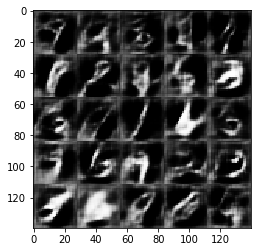

Epoch 1/2 ___  Discriminator Loss: 0.5648 ___ Generator Loss: 1.9957
Epoch 1/2 ___  Discriminator Loss: 0.8717 ___ Generator Loss: 1.0551
Epoch 1/2 ___  Discriminator Loss: 2.3443 ___ Generator Loss: 2.9780
Epoch 1/2 ___  Discriminator Loss: 1.2281 ___ Generator Loss: 0.6480
Epoch 1/2 ___  Discriminator Loss: 0.9087 ___ Generator Loss: 1.0489
Epoch 1/2 ___  Discriminator Loss: 0.8316 ___ Generator Loss: 1.1743
Epoch 1/2 ___  Discriminator Loss: 0.8218 ___ Generator Loss: 1.3233
Epoch 1/2 ___  Discriminator Loss: 0.8255 ___ Generator Loss: 2.3140
Epoch 1/2 ___  Discriminator Loss: 1.5100 ___ Generator Loss: 0.5126
Epoch 1/2 ___  Discriminator Loss: 0.8630 ___ Generator Loss: 2.2938


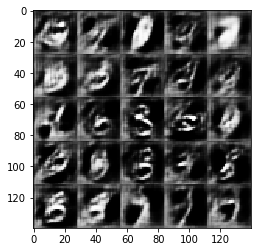

Epoch 1/2 ___  Discriminator Loss: 0.9450 ___ Generator Loss: 1.1174
Epoch 1/2 ___  Discriminator Loss: 0.8805 ___ Generator Loss: 1.3017
Epoch 1/2 ___  Discriminator Loss: 0.5960 ___ Generator Loss: 1.6913
Epoch 1/2 ___  Discriminator Loss: 0.8584 ___ Generator Loss: 1.0346
Epoch 1/2 ___  Discriminator Loss: 1.2826 ___ Generator Loss: 0.6227
Epoch 1/2 ___  Discriminator Loss: 0.8615 ___ Generator Loss: 1.1466
Epoch 1/2 ___  Discriminator Loss: 0.9361 ___ Generator Loss: 0.9459
Epoch 1/2 ___  Discriminator Loss: 1.8867 ___ Generator Loss: 0.3808
Epoch 1/2 ___  Discriminator Loss: 0.7524 ___ Generator Loss: 1.5064
Epoch 1/2 ___  Discriminator Loss: 0.6933 ___ Generator Loss: 1.9361


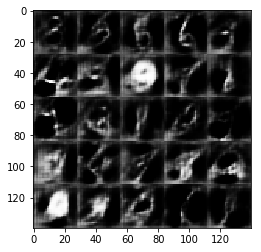

Epoch 1/2 ___  Discriminator Loss: 1.1722 ___ Generator Loss: 0.6859
Epoch 1/2 ___  Discriminator Loss: 0.7536 ___ Generator Loss: 1.3727
Epoch 1/2 ___  Discriminator Loss: 1.1240 ___ Generator Loss: 0.7739
Epoch 1/2 ___  Discriminator Loss: 1.0121 ___ Generator Loss: 0.8967
Epoch 1/2 ___  Discriminator Loss: 0.6331 ___ Generator Loss: 1.5414
Epoch 1/2 ___  Discriminator Loss: 0.6419 ___ Generator Loss: 1.5799
Epoch 1/2 ___  Discriminator Loss: 0.8782 ___ Generator Loss: 1.0599
Epoch 1/2 ___  Discriminator Loss: 0.5705 ___ Generator Loss: 2.2892
Epoch 1/2 ___  Discriminator Loss: 2.4217 ___ Generator Loss: 0.2405
Epoch 1/2 ___  Discriminator Loss: 0.7060 ___ Generator Loss: 1.4712


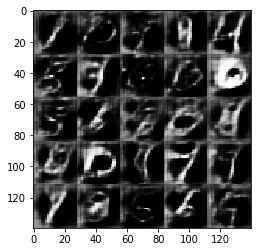

Epoch 1/2 ___  Discriminator Loss: 1.2464 ___ Generator Loss: 0.6180
Epoch 1/2 ___  Discriminator Loss: 0.6393 ___ Generator Loss: 1.5079
Epoch 1/2 ___  Discriminator Loss: 0.9385 ___ Generator Loss: 0.9938
Epoch 1/2 ___  Discriminator Loss: 0.9218 ___ Generator Loss: 0.9139
Epoch 1/2 ___  Discriminator Loss: 0.7248 ___ Generator Loss: 1.4015
Epoch 1/2 ___  Discriminator Loss: 0.6785 ___ Generator Loss: 1.4336
Epoch 1/2 ___  Discriminator Loss: 0.8592 ___ Generator Loss: 1.1947
Epoch 1/2 ___  Discriminator Loss: 3.0668 ___ Generator Loss: 4.3863
Epoch 1/2 ___  Discriminator Loss: 0.8383 ___ Generator Loss: 1.5265
Epoch 1/2 ___  Discriminator Loss: 0.7256 ___ Generator Loss: 1.2816


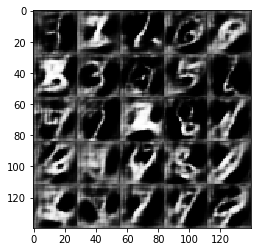

Epoch 1/2 ___  Discriminator Loss: 1.0203 ___ Generator Loss: 0.7883
Epoch 1/2 ___  Discriminator Loss: 0.7980 ___ Generator Loss: 1.2027
Epoch 1/2 ___  Discriminator Loss: 0.6936 ___ Generator Loss: 1.3040
Epoch 1/2 ___  Discriminator Loss: 1.3759 ___ Generator Loss: 0.5243
Epoch 1/2 ___  Discriminator Loss: 0.8471 ___ Generator Loss: 1.1460
Epoch 1/2 ___  Discriminator Loss: 0.7524 ___ Generator Loss: 1.2759
Epoch 1/2 ___  Discriminator Loss: 0.6673 ___ Generator Loss: 1.4160
Epoch 1/2 ___  Discriminator Loss: 0.7640 ___ Generator Loss: 1.5316
Epoch 1/2 ___  Discriminator Loss: 0.6136 ___ Generator Loss: 1.8434
Epoch 1/2 ___  Discriminator Loss: 1.2521 ___ Generator Loss: 0.6014


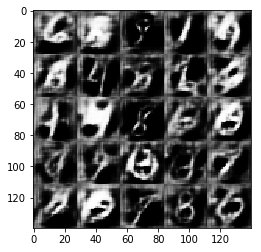

Epoch 1/2 ___  Discriminator Loss: 0.6299 ___ Generator Loss: 1.8179
Epoch 1/2 ___  Discriminator Loss: 0.6513 ___ Generator Loss: 1.4678
Epoch 1/2 ___  Discriminator Loss: 0.7023 ___ Generator Loss: 1.3060
Epoch 1/2 ___  Discriminator Loss: 0.6627 ___ Generator Loss: 1.6467
Epoch 1/2 ___  Discriminator Loss: 1.0623 ___ Generator Loss: 0.8755
Epoch 1/2 ___  Discriminator Loss: 1.0559 ___ Generator Loss: 0.8179
Epoch 1/2 ___  Discriminator Loss: 0.8195 ___ Generator Loss: 1.2246
Epoch 1/2 ___  Discriminator Loss: 1.0084 ___ Generator Loss: 0.8922
Epoch 1/2 ___  Discriminator Loss: 1.2391 ___ Generator Loss: 0.6349
Epoch 1/2 ___  Discriminator Loss: 1.1728 ___ Generator Loss: 0.6912


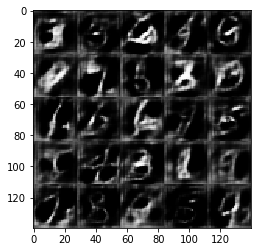

Epoch 1/2 ___  Discriminator Loss: 1.0225 ___ Generator Loss: 0.8001
Epoch 1/2 ___  Discriminator Loss: 0.6609 ___ Generator Loss: 1.9402
Epoch 1/2 ___  Discriminator Loss: 0.6352 ___ Generator Loss: 1.5464
Epoch 1/2 ___  Discriminator Loss: 1.9595 ___ Generator Loss: 0.3034
Epoch 1/2 ___  Discriminator Loss: 0.7760 ___ Generator Loss: 1.2061
Epoch 1/2 ___  Discriminator Loss: 0.7371 ___ Generator Loss: 1.2737
Epoch 1/2 ___  Discriminator Loss: 1.1116 ___ Generator Loss: 0.8103
Epoch 1/2 ___  Discriminator Loss: 0.7202 ___ Generator Loss: 1.2542
Epoch 1/2 ___  Discriminator Loss: 1.0332 ___ Generator Loss: 0.8313
Epoch 1/2 ___  Discriminator Loss: 0.5659 ___ Generator Loss: 1.8741


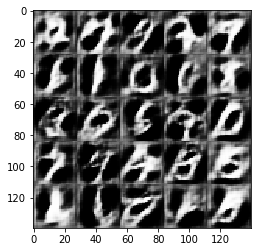

Epoch 1/2 ___  Discriminator Loss: 0.8998 ___ Generator Loss: 1.0603
Epoch 1/2 ___  Discriminator Loss: 1.5548 ___ Generator Loss: 0.4858
Epoch 1/2 ___  Discriminator Loss: 1.2262 ___ Generator Loss: 0.7525
Epoch 1/2 ___  Discriminator Loss: 0.9010 ___ Generator Loss: 2.2292
Epoch 1/2 ___  Discriminator Loss: 0.6512 ___ Generator Loss: 1.5428
Epoch 1/2 ___  Discriminator Loss: 0.8375 ___ Generator Loss: 1.1240
Epoch 1/2 ___  Discriminator Loss: 1.0089 ___ Generator Loss: 0.9126
Epoch 1/2 ___  Discriminator Loss: 0.6124 ___ Generator Loss: 1.6488
Epoch 1/2 ___  Discriminator Loss: 0.5981 ___ Generator Loss: 2.0939
Epoch 1/2 ___  Discriminator Loss: 1.1304 ___ Generator Loss: 0.7260


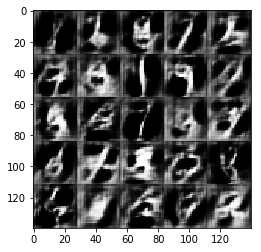

Epoch 1/2 ___  Discriminator Loss: 0.8933 ___ Generator Loss: 1.1125
Epoch 1/2 ___  Discriminator Loss: 1.1362 ___ Generator Loss: 0.6852
Epoch 1/2 ___  Discriminator Loss: 0.7611 ___ Generator Loss: 1.2941
Epoch 1/2 ___  Discriminator Loss: 0.9560 ___ Generator Loss: 0.9336
Epoch 1/2 ___  Discriminator Loss: 1.0180 ___ Generator Loss: 0.9126
Epoch 1/2 ___  Discriminator Loss: 0.9464 ___ Generator Loss: 0.8586
Epoch 1/2 ___  Discriminator Loss: 2.0116 ___ Generator Loss: 0.3099
Epoch 1/2 ___  Discriminator Loss: 0.5845 ___ Generator Loss: 1.8990
Epoch 1/2 ___  Discriminator Loss: 0.6689 ___ Generator Loss: 1.5627
Epoch 1/2 ___  Discriminator Loss: 0.6573 ___ Generator Loss: 1.4479


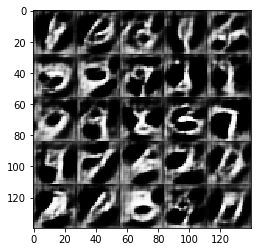

Epoch 1/2 ___  Discriminator Loss: 1.2233 ___ Generator Loss: 0.6318
Epoch 1/2 ___  Discriminator Loss: 0.8152 ___ Generator Loss: 1.2870
Epoch 1/2 ___  Discriminator Loss: 1.0133 ___ Generator Loss: 1.0679
Epoch 1/2 ___  Discriminator Loss: 1.2312 ___ Generator Loss: 0.6394
Epoch 1/2 ___  Discriminator Loss: 0.9893 ___ Generator Loss: 0.8482
Epoch 1/2 ___  Discriminator Loss: 1.0111 ___ Generator Loss: 0.7834
Epoch 1/2 ___  Discriminator Loss: 1.3175 ___ Generator Loss: 0.6051
Epoch 1/2 ___  Discriminator Loss: 0.7203 ___ Generator Loss: 1.3918
Epoch 1/2 ___  Discriminator Loss: 0.6056 ___ Generator Loss: 1.6431
Epoch 1/2 ___  Discriminator Loss: 0.7128 ___ Generator Loss: 1.3359


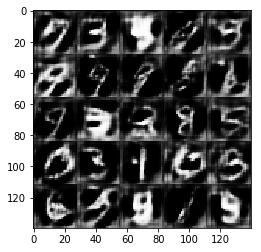

Epoch 1/2 ___  Discriminator Loss: 1.1849 ___ Generator Loss: 0.7848
Epoch 1/2 ___  Discriminator Loss: 1.3742 ___ Generator Loss: 0.5289
Epoch 1/2 ___  Discriminator Loss: 0.6384 ___ Generator Loss: 1.8661
Epoch 1/2 ___  Discriminator Loss: 1.5237 ___ Generator Loss: 1.8606
Epoch 1/2 ___  Discriminator Loss: 1.0924 ___ Generator Loss: 0.8179
Epoch 1/2 ___  Discriminator Loss: 1.0266 ___ Generator Loss: 0.7640
Epoch 1/2 ___  Discriminator Loss: 0.7389 ___ Generator Loss: 1.2787
Epoch 1/2 ___  Discriminator Loss: 0.5846 ___ Generator Loss: 1.6879
Epoch 1/2 ___  Discriminator Loss: 0.8722 ___ Generator Loss: 0.9868
Epoch 1/2 ___  Discriminator Loss: 1.1989 ___ Generator Loss: 0.6817


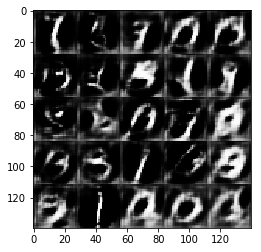

Epoch 1/2 ___  Discriminator Loss: 2.2090 ___ Generator Loss: 0.1850
Epoch 1/2 ___  Discriminator Loss: 1.4878 ___ Generator Loss: 0.5437
Epoch 1/2 ___  Discriminator Loss: 0.9567 ___ Generator Loss: 0.9145
Epoch 1/2 ___  Discriminator Loss: 0.6699 ___ Generator Loss: 1.5893
Epoch 1/2 ___  Discriminator Loss: 1.0448 ___ Generator Loss: 1.4749
Epoch 1/2 ___  Discriminator Loss: 0.8487 ___ Generator Loss: 1.1912
Epoch 1/2 ___  Discriminator Loss: 0.6802 ___ Generator Loss: 1.4114
Epoch 1/2 ___  Discriminator Loss: 0.8316 ___ Generator Loss: 1.0548
Epoch 1/2 ___  Discriminator Loss: 0.9086 ___ Generator Loss: 1.0487
Epoch 1/2 ___  Discriminator Loss: 2.0983 ___ Generator Loss: 0.3784


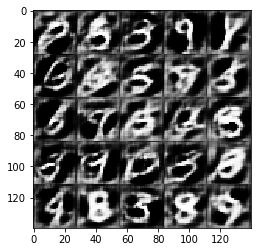

Epoch 1/2 ___  Discriminator Loss: 0.6496 ___ Generator Loss: 1.9007
Epoch 1/2 ___  Discriminator Loss: 0.8274 ___ Generator Loss: 1.1060
Epoch 1/2 ___  Discriminator Loss: 1.0092 ___ Generator Loss: 0.8268
Epoch 1/2 ___  Discriminator Loss: 0.9612 ___ Generator Loss: 0.9511
Epoch 1/2 ___  Discriminator Loss: 0.6740 ___ Generator Loss: 1.7013
Epoch 1/2 ___  Discriminator Loss: 0.6807 ___ Generator Loss: 1.9362
Epoch 1/2 ___  Discriminator Loss: 0.6942 ___ Generator Loss: 1.3585
Epoch 1/2 ___  Discriminator Loss: 0.6987 ___ Generator Loss: 1.6481
Epoch 1/2 ___  Discriminator Loss: 0.5719 ___ Generator Loss: 1.7727
Epoch 1/2 ___  Discriminator Loss: 0.6093 ___ Generator Loss: 1.6142


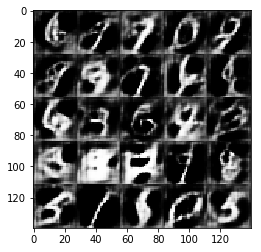

Epoch 1/2 ___  Discriminator Loss: 0.5804 ___ Generator Loss: 1.8403
Epoch 1/2 ___  Discriminator Loss: 1.9816 ___ Generator Loss: 0.3504
Epoch 1/2 ___  Discriminator Loss: 1.3144 ___ Generator Loss: 0.5923
Epoch 1/2 ___  Discriminator Loss: 0.7311 ___ Generator Loss: 1.6526
Epoch 1/2 ___  Discriminator Loss: 0.7134 ___ Generator Loss: 1.3872
Epoch 1/2 ___  Discriminator Loss: 0.7501 ___ Generator Loss: 1.1798
Epoch 1/2 ___  Discriminator Loss: 1.0618 ___ Generator Loss: 2.5979
Epoch 1/2 ___  Discriminator Loss: 0.7247 ___ Generator Loss: 1.5099
Epoch 1/2 ___  Discriminator Loss: 0.8796 ___ Generator Loss: 1.0776
Epoch 1/2 ___  Discriminator Loss: 0.9647 ___ Generator Loss: 0.8347


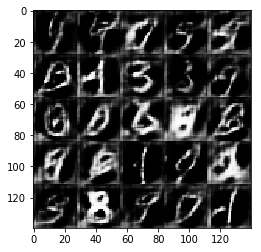

Epoch 1/2 ___  Discriminator Loss: 1.4930 ___ Generator Loss: 0.4527
Epoch 1/2 ___  Discriminator Loss: 0.6817 ___ Generator Loss: 1.3829
Epoch 1/2 ___  Discriminator Loss: 0.7508 ___ Generator Loss: 1.3386
Epoch 1/2 ___  Discriminator Loss: 0.5538 ___ Generator Loss: 1.7898
Epoch 1/2 ___  Discriminator Loss: 1.4456 ___ Generator Loss: 0.6013
Epoch 1/2 ___  Discriminator Loss: 0.9864 ___ Generator Loss: 0.8043
Epoch 1/2 ___  Discriminator Loss: 0.6692 ___ Generator Loss: 1.4651
Epoch 1/2 ___  Discriminator Loss: 0.6169 ___ Generator Loss: 1.6295
Epoch 1/2 ___  Discriminator Loss: 0.6435 ___ Generator Loss: 1.4480
Epoch 1/2 ___  Discriminator Loss: 0.6623 ___ Generator Loss: 1.5091


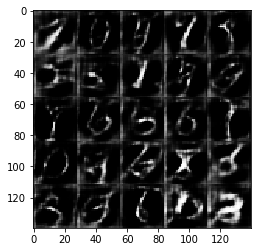

Epoch 1/2 ___  Discriminator Loss: 1.3196 ___ Generator Loss: 0.6467
Epoch 1/2 ___  Discriminator Loss: 0.9181 ___ Generator Loss: 1.8470
Epoch 1/2 ___  Discriminator Loss: 0.6862 ___ Generator Loss: 1.5341
Epoch 1/2 ___  Discriminator Loss: 0.6809 ___ Generator Loss: 1.6431
Epoch 1/2 ___  Discriminator Loss: 1.1102 ___ Generator Loss: 0.7410
Epoch 1/2 ___  Discriminator Loss: 0.7603 ___ Generator Loss: 1.2870
Epoch 1/2 ___  Discriminator Loss: 0.9241 ___ Generator Loss: 0.8978
Epoch 1/2 ___  Discriminator Loss: 1.0433 ___ Generator Loss: 0.8131
Epoch 1/2 ___  Discriminator Loss: 1.5349 ___ Generator Loss: 0.4683
Epoch 1/2 ___  Discriminator Loss: 1.1088 ___ Generator Loss: 0.7229


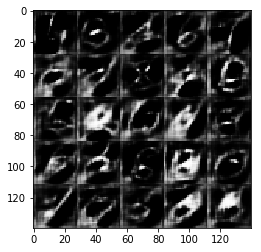

Epoch 1/2 ___  Discriminator Loss: 1.2024 ___ Generator Loss: 2.6826
Epoch 1/2 ___  Discriminator Loss: 1.6945 ___ Generator Loss: 0.3998
Epoch 1/2 ___  Discriminator Loss: 0.6853 ___ Generator Loss: 1.9353
Epoch 1/2 ___  Discriminator Loss: 0.6730 ___ Generator Loss: 1.3784
Epoch 1/2 ___  Discriminator Loss: 1.8476 ___ Generator Loss: 0.3963
Epoch 1/2 ___  Discriminator Loss: 0.7322 ___ Generator Loss: 2.9926
Epoch 1/2 ___  Discriminator Loss: 0.6635 ___ Generator Loss: 1.4950
Epoch 1/2 ___  Discriminator Loss: 0.8511 ___ Generator Loss: 1.1996
Epoch 1/2 ___  Discriminator Loss: 0.6785 ___ Generator Loss: 1.5681
Epoch 1/2 ___  Discriminator Loss: 1.0647 ___ Generator Loss: 0.7894


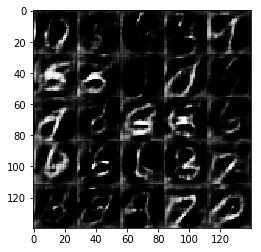

Epoch 1/2 ___  Discriminator Loss: 0.6590 ___ Generator Loss: 1.5845
Epoch 1/2 ___  Discriminator Loss: 1.7378 ___ Generator Loss: 0.3696
Epoch 1/2 ___  Discriminator Loss: 1.0230 ___ Generator Loss: 0.8124
Epoch 1/2 ___  Discriminator Loss: 0.6910 ___ Generator Loss: 1.5403
Epoch 1/2 ___  Discriminator Loss: 1.2717 ___ Generator Loss: 0.7092
Epoch 1/2 ___  Discriminator Loss: 0.5506 ___ Generator Loss: 1.9480
Epoch 1/2 ___  Discriminator Loss: 0.6265 ___ Generator Loss: 1.6796
Epoch 1/2 ___  Discriminator Loss: 0.7108 ___ Generator Loss: 1.5177
Epoch 1/2 ___  Discriminator Loss: 1.1666 ___ Generator Loss: 0.7439
Epoch 1/2 ___  Discriminator Loss: 1.0213 ___ Generator Loss: 0.8049


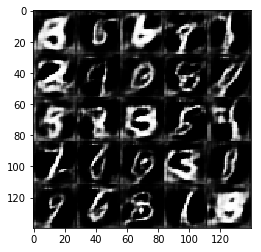

Epoch 1/2 ___  Discriminator Loss: 0.8191 ___ Generator Loss: 1.1020
Epoch 1/2 ___  Discriminator Loss: 0.6970 ___ Generator Loss: 1.4117
Epoch 1/2 ___  Discriminator Loss: 0.8904 ___ Generator Loss: 1.0280
Epoch 1/2 ___  Discriminator Loss: 1.1277 ___ Generator Loss: 0.7300
Epoch 1/2 ___  Discriminator Loss: 0.6455 ___ Generator Loss: 1.8155
Epoch 1/2 ___  Discriminator Loss: 0.7567 ___ Generator Loss: 1.5102
Epoch 1/2 ___  Discriminator Loss: 0.7186 ___ Generator Loss: 1.7226
Epoch 1/2 ___  Discriminator Loss: 0.8810 ___ Generator Loss: 1.2076
Epoch 1/2 ___  Discriminator Loss: 0.7347 ___ Generator Loss: 1.3578
Epoch 1/2 ___  Discriminator Loss: 0.6672 ___ Generator Loss: 1.4682


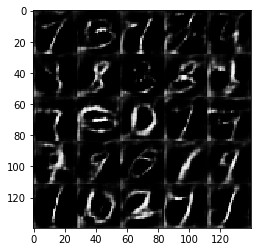

Epoch 1/2 ___  Discriminator Loss: 0.9946 ___ Generator Loss: 0.9783
Epoch 1/2 ___  Discriminator Loss: 0.6735 ___ Generator Loss: 1.3859
Epoch 1/2 ___  Discriminator Loss: 0.6133 ___ Generator Loss: 1.6692
Epoch 1/2 ___  Discriminator Loss: 0.9328 ___ Generator Loss: 0.8893
Epoch 1/2 ___  Discriminator Loss: 0.5762 ___ Generator Loss: 2.2019
Epoch 1/2 ___  Discriminator Loss: 0.8095 ___ Generator Loss: 1.3286
Epoch 1/2 ___  Discriminator Loss: 1.0986 ___ Generator Loss: 1.3776
Epoch 1/2 ___  Discriminator Loss: 0.6902 ___ Generator Loss: 1.6071
Epoch 1/2 ___  Discriminator Loss: 0.7751 ___ Generator Loss: 1.2937
Epoch 1/2 ___  Discriminator Loss: 0.9482 ___ Generator Loss: 0.8996


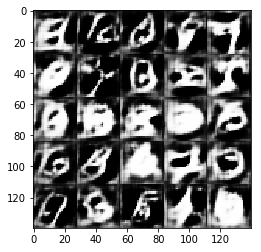

Epoch 1/2 ___  Discriminator Loss: 0.6916 ___ Generator Loss: 1.7575
Epoch 1/2 ___  Discriminator Loss: 0.5805 ___ Generator Loss: 2.1515
Epoch 1/2 ___  Discriminator Loss: 0.7813 ___ Generator Loss: 1.2664
Epoch 1/2 ___  Discriminator Loss: 0.7354 ___ Generator Loss: 1.4844
Epoch 1/2 ___  Discriminator Loss: 1.1344 ___ Generator Loss: 0.7709
Epoch 1/2 ___  Discriminator Loss: 0.7989 ___ Generator Loss: 1.2582
Epoch 1/2 ___  Discriminator Loss: 0.5970 ___ Generator Loss: 2.3533
Epoch 1/2 ___  Discriminator Loss: 0.6733 ___ Generator Loss: 1.5641
Epoch 1/2 ___  Discriminator Loss: 2.1180 ___ Generator Loss: 0.2438
Epoch 1/2 ___  Discriminator Loss: 0.7346 ___ Generator Loss: 1.3463


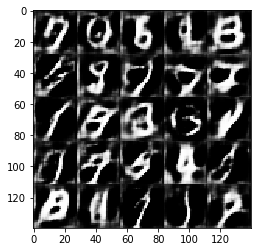

Epoch 1/2 ___  Discriminator Loss: 1.6208 ___ Generator Loss: 0.4572
Epoch 1/2 ___  Discriminator Loss: 2.1858 ___ Generator Loss: 0.2971
Epoch 1/2 ___  Discriminator Loss: 1.2310 ___ Generator Loss: 0.6912
Epoch 1/2 ___  Discriminator Loss: 0.6717 ___ Generator Loss: 1.4758
Epoch 1/2 ___  Discriminator Loss: 0.6576 ___ Generator Loss: 2.0453
Epoch 1/2 ___  Discriminator Loss: 0.6869 ___ Generator Loss: 1.5345
Epoch 1/2 ___  Discriminator Loss: 0.6366 ___ Generator Loss: 1.7114
Epoch 1/2 ___  Discriminator Loss: 0.9134 ___ Generator Loss: 1.2191
Epoch 1/2 ___  Discriminator Loss: 0.7075 ___ Generator Loss: 1.6807
Epoch 1/2 ___  Discriminator Loss: 0.6536 ___ Generator Loss: 1.4973


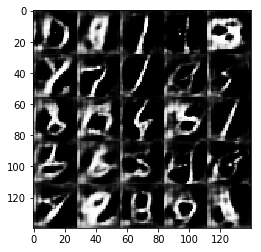

Epoch 1/2 ___  Discriminator Loss: 0.6092 ___ Generator Loss: 1.6294
Epoch 1/2 ___  Discriminator Loss: 0.9402 ___ Generator Loss: 1.1410
Epoch 1/2 ___  Discriminator Loss: 0.9855 ___ Generator Loss: 0.8752
Epoch 1/2 ___  Discriminator Loss: 0.6901 ___ Generator Loss: 1.3627
Epoch 1/2 ___  Discriminator Loss: 1.3380 ___ Generator Loss: 0.5835
Epoch 1/2 ___  Discriminator Loss: 0.6076 ___ Generator Loss: 1.6271
Epoch 1/2 ___  Discriminator Loss: 1.0150 ___ Generator Loss: 0.8435
Epoch 1/2 ___  Discriminator Loss: 0.7586 ___ Generator Loss: 1.2971
Epoch 1/2 ___  Discriminator Loss: 0.6634 ___ Generator Loss: 1.4576
Epoch 1/2 ___  Discriminator Loss: 0.8065 ___ Generator Loss: 1.1320


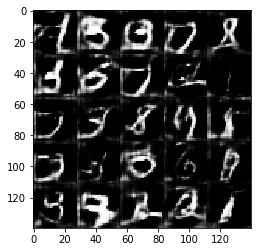

Epoch 1/2 ___  Discriminator Loss: 0.6955 ___ Generator Loss: 1.4062
Epoch 1/2 ___  Discriminator Loss: 0.6184 ___ Generator Loss: 1.5596
Epoch 1/2 ___  Discriminator Loss: 0.8416 ___ Generator Loss: 1.0074
Epoch 1/2 ___  Discriminator Loss: 0.5887 ___ Generator Loss: 2.2145
Epoch 1/2 ___  Discriminator Loss: 0.7549 ___ Generator Loss: 1.4837
Epoch 1/2 ___  Discriminator Loss: 0.6231 ___ Generator Loss: 1.6043
Epoch 1/2 ___  Discriminator Loss: 0.8823 ___ Generator Loss: 0.9948
Epoch 1/2 ___  Discriminator Loss: 0.5171 ___ Generator Loss: 2.0669
Epoch 1/2 ___  Discriminator Loss: 0.9114 ___ Generator Loss: 0.9473
Epoch 1/2 ___  Discriminator Loss: 0.6094 ___ Generator Loss: 1.8509


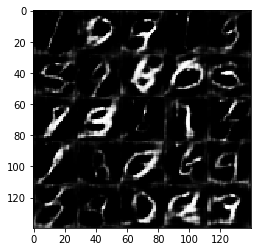

Epoch 1/2 ___  Discriminator Loss: 0.6482 ___ Generator Loss: 1.6781
Epoch 1/2 ___  Discriminator Loss: 0.5339 ___ Generator Loss: 2.3043
Epoch 1/2 ___  Discriminator Loss: 1.1338 ___ Generator Loss: 0.7719
Epoch 1/2 ___  Discriminator Loss: 0.6329 ___ Generator Loss: 1.8788
Epoch 1/2 ___  Discriminator Loss: 3.4341 ___ Generator Loss: 0.0989
Epoch 1/2 ___  Discriminator Loss: 1.7196 ___ Generator Loss: 0.4285
Epoch 1/2 ___  Discriminator Loss: 0.7441 ___ Generator Loss: 1.9005
Epoch 1/2 ___  Discriminator Loss: 1.2495 ___ Generator Loss: 0.6454
Epoch 1/2 ___  Discriminator Loss: 0.6899 ___ Generator Loss: 1.8641
Epoch 1/2 ___  Discriminator Loss: 0.7610 ___ Generator Loss: 1.2833


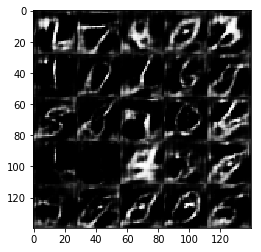

Epoch 1/2 ___  Discriminator Loss: 1.2274 ___ Generator Loss: 0.7238
Epoch 1/2 ___  Discriminator Loss: 0.7691 ___ Generator Loss: 1.3259
Epoch 1/2 ___  Discriminator Loss: 0.8965 ___ Generator Loss: 0.9384
Epoch 1/2 ___  Discriminator Loss: 0.7151 ___ Generator Loss: 1.3623
Epoch 1/2 ___  Discriminator Loss: 0.6927 ___ Generator Loss: 1.3439
Epoch 1/2 ___  Discriminator Loss: 0.7171 ___ Generator Loss: 1.5048
Epoch 1/2 ___  Discriminator Loss: 1.1366 ___ Generator Loss: 0.7193
Epoch 1/2 ___  Discriminator Loss: 0.5399 ___ Generator Loss: 1.9777
Epoch 1/2 ___  Discriminator Loss: 0.8938 ___ Generator Loss: 0.9330
Epoch 1/2 ___  Discriminator Loss: 0.6391 ___ Generator Loss: 1.6579


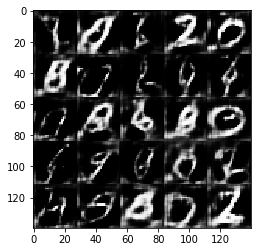

Epoch 1/2 ___  Discriminator Loss: 0.6529 ___ Generator Loss: 1.6695
Epoch 1/2 ___  Discriminator Loss: 0.8662 ___ Generator Loss: 1.0319
Epoch 1/2 ___  Discriminator Loss: 0.6586 ___ Generator Loss: 1.7449
Epoch 1/2 ___  Discriminator Loss: 1.0161 ___ Generator Loss: 0.8455
Epoch 1/2 ___  Discriminator Loss: 0.7312 ___ Generator Loss: 1.7113
Epoch 1/2 ___  Discriminator Loss: 0.7940 ___ Generator Loss: 1.3398
Epoch 1/2 ___  Discriminator Loss: 0.5163 ___ Generator Loss: 2.7626
Epoch 1/2 ___  Discriminator Loss: 0.7061 ___ Generator Loss: 1.4017
Epoch 1/2 ___  Discriminator Loss: 0.6200 ___ Generator Loss: 1.5512
Epoch 1/2 ___  Discriminator Loss: 0.7821 ___ Generator Loss: 1.1562


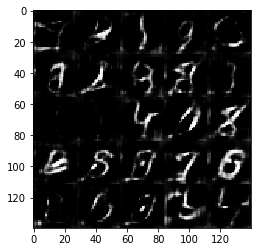

Epoch 1/2 ___  Discriminator Loss: 0.8982 ___ Generator Loss: 0.9862
Epoch 1/2 ___  Discriminator Loss: 1.2373 ___ Generator Loss: 0.6943
Epoch 1/2 ___  Discriminator Loss: 2.8349 ___ Generator Loss: 0.1261
Epoch 1/2 ___  Discriminator Loss: 1.2020 ___ Generator Loss: 0.7520
Epoch 1/2 ___  Discriminator Loss: 0.9951 ___ Generator Loss: 0.9837
Epoch 1/2 ___  Discriminator Loss: 1.4174 ___ Generator Loss: 0.4681
Epoch 1/2 ___  Discriminator Loss: 0.8903 ___ Generator Loss: 2.2437
Epoch 1/2 ___  Discriminator Loss: 1.0138 ___ Generator Loss: 0.8026
Epoch 1/2 ___  Discriminator Loss: 0.9579 ___ Generator Loss: 0.9520
Epoch 1/2 ___  Discriminator Loss: 1.0840 ___ Generator Loss: 0.8043


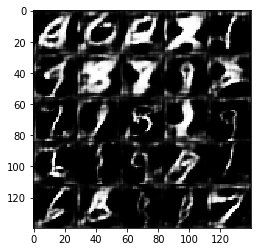

Epoch 1/2 ___  Discriminator Loss: 0.6463 ___ Generator Loss: 1.6674
Epoch 1/2 ___  Discriminator Loss: 1.5115 ___ Generator Loss: 0.4247
Epoch 1/2 ___  Discriminator Loss: 0.7113 ___ Generator Loss: 1.9262
Epoch 1/2 ___  Discriminator Loss: 1.0653 ___ Generator Loss: 0.7776
Epoch 1/2 ___  Discriminator Loss: 0.6159 ___ Generator Loss: 1.9213
Epoch 1/2 ___  Discriminator Loss: 0.6714 ___ Generator Loss: 1.6902
Epoch 1/2 ___  Discriminator Loss: 0.5858 ___ Generator Loss: 1.8127
Epoch 1/2 ___  Discriminator Loss: 0.6208 ___ Generator Loss: 1.5787
Epoch 1/2 ___  Discriminator Loss: 0.6205 ___ Generator Loss: 1.6741
Epoch 1/2 ___  Discriminator Loss: 0.8782 ___ Generator Loss: 0.9737


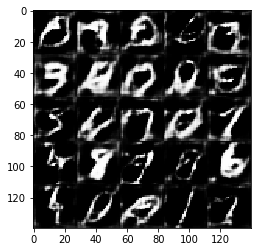

Epoch 1/2 ___  Discriminator Loss: 1.1938 ___ Generator Loss: 0.6395
Epoch 1/2 ___  Discriminator Loss: 0.7788 ___ Generator Loss: 1.2784
Epoch 1/2 ___  Discriminator Loss: 0.6710 ___ Generator Loss: 1.3914
Epoch 1/2 ___  Discriminator Loss: 0.6296 ___ Generator Loss: 1.5844
Epoch 1/2 ___  Discriminator Loss: 1.1336 ___ Generator Loss: 0.8055
Epoch 1/2 ___  Discriminator Loss: 1.3161 ___ Generator Loss: 0.6526
Epoch 1/2 ___  Discriminator Loss: 0.5993 ___ Generator Loss: 1.7305
Epoch 1/2 ___  Discriminator Loss: 0.4990 ___ Generator Loss: 2.5927
Epoch 1/2 ___  Discriminator Loss: 0.6562 ___ Generator Loss: 1.4459
Epoch 1/2 ___  Discriminator Loss: 0.5930 ___ Generator Loss: 1.8661


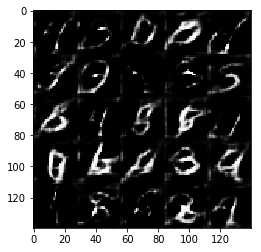

Epoch 2/2 ___  Discriminator Loss: 1.9977 ___ Generator Loss: 0.3037
Epoch 2/2 ___  Discriminator Loss: 0.5880 ___ Generator Loss: 2.2197
Epoch 2/2 ___  Discriminator Loss: 0.7715 ___ Generator Loss: 1.2744
Epoch 2/2 ___  Discriminator Loss: 0.6019 ___ Generator Loss: 1.8343
Epoch 2/2 ___  Discriminator Loss: 0.6280 ___ Generator Loss: 1.6693
Epoch 2/2 ___  Discriminator Loss: 0.8001 ___ Generator Loss: 1.4076
Epoch 2/2 ___  Discriminator Loss: 1.5561 ___ Generator Loss: 0.4502
Epoch 2/2 ___  Discriminator Loss: 0.4722 ___ Generator Loss: 2.8776
Epoch 2/2 ___  Discriminator Loss: 0.6516 ___ Generator Loss: 1.5451
Epoch 2/2 ___  Discriminator Loss: 0.5754 ___ Generator Loss: 2.0252


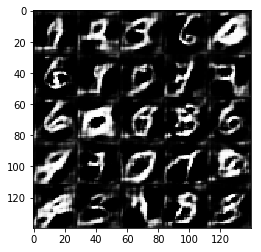

Epoch 2/2 ___  Discriminator Loss: 0.6037 ___ Generator Loss: 1.6400
Epoch 2/2 ___  Discriminator Loss: 0.9035 ___ Generator Loss: 0.9414
Epoch 2/2 ___  Discriminator Loss: 0.7235 ___ Generator Loss: 1.9418
Epoch 2/2 ___  Discriminator Loss: 1.1643 ___ Generator Loss: 0.6683
Epoch 2/2 ___  Discriminator Loss: 0.7533 ___ Generator Loss: 1.3949
Epoch 2/2 ___  Discriminator Loss: 0.5591 ___ Generator Loss: 1.9505
Epoch 2/2 ___  Discriminator Loss: 0.7840 ___ Generator Loss: 1.4774
Epoch 2/2 ___  Discriminator Loss: 0.6402 ___ Generator Loss: 1.7605
Epoch 2/2 ___  Discriminator Loss: 1.1368 ___ Generator Loss: 0.8808
Epoch 2/2 ___  Discriminator Loss: 0.7559 ___ Generator Loss: 1.2924


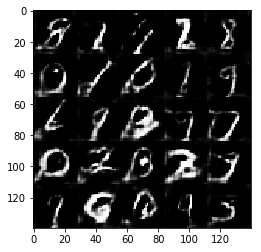

Epoch 2/2 ___  Discriminator Loss: 0.8844 ___ Generator Loss: 1.0319
Epoch 2/2 ___  Discriminator Loss: 0.4786 ___ Generator Loss: 2.2072
Epoch 2/2 ___  Discriminator Loss: 0.6825 ___ Generator Loss: 1.3929
Epoch 2/2 ___  Discriminator Loss: 0.6279 ___ Generator Loss: 1.6120
Epoch 2/2 ___  Discriminator Loss: 0.5840 ___ Generator Loss: 2.0113
Epoch 2/2 ___  Discriminator Loss: 0.6797 ___ Generator Loss: 1.4865
Epoch 2/2 ___  Discriminator Loss: 0.7130 ___ Generator Loss: 1.3282
Epoch 2/2 ___  Discriminator Loss: 1.0166 ___ Generator Loss: 3.6982
Epoch 2/2 ___  Discriminator Loss: 0.8423 ___ Generator Loss: 1.0989
Epoch 2/2 ___  Discriminator Loss: 0.6827 ___ Generator Loss: 1.4772


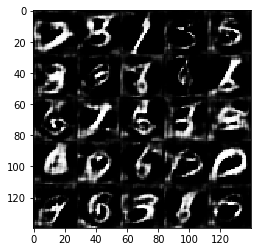

Epoch 2/2 ___  Discriminator Loss: 0.8232 ___ Generator Loss: 2.9082
Epoch 2/2 ___  Discriminator Loss: 1.9765 ___ Generator Loss: 0.4496
Epoch 2/2 ___  Discriminator Loss: 0.8720 ___ Generator Loss: 1.0685
Epoch 2/2 ___  Discriminator Loss: 0.9238 ___ Generator Loss: 1.0360
Epoch 2/2 ___  Discriminator Loss: 1.0893 ___ Generator Loss: 0.7502
Epoch 2/2 ___  Discriminator Loss: 1.1752 ___ Generator Loss: 0.6482
Epoch 2/2 ___  Discriminator Loss: 0.5110 ___ Generator Loss: 2.2273
Epoch 2/2 ___  Discriminator Loss: 0.6137 ___ Generator Loss: 2.3293
Epoch 2/2 ___  Discriminator Loss: 1.0287 ___ Generator Loss: 0.8051
Epoch 2/2 ___  Discriminator Loss: 1.4555 ___ Generator Loss: 0.4854


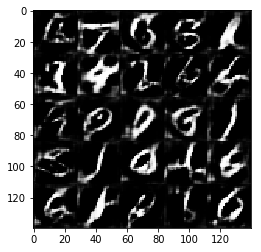

Epoch 2/2 ___  Discriminator Loss: 1.0507 ___ Generator Loss: 0.7962
Epoch 2/2 ___  Discriminator Loss: 2.2984 ___ Generator Loss: 0.2359
Epoch 2/2 ___  Discriminator Loss: 0.5615 ___ Generator Loss: 1.9464
Epoch 2/2 ___  Discriminator Loss: 2.1225 ___ Generator Loss: 0.3342
Epoch 2/2 ___  Discriminator Loss: 0.7557 ___ Generator Loss: 1.3599
Epoch 2/2 ___  Discriminator Loss: 1.7057 ___ Generator Loss: 0.4196
Epoch 2/2 ___  Discriminator Loss: 0.7496 ___ Generator Loss: 1.1711
Epoch 2/2 ___  Discriminator Loss: 0.7426 ___ Generator Loss: 1.3940
Epoch 2/2 ___  Discriminator Loss: 1.1383 ___ Generator Loss: 0.6695
Epoch 2/2 ___  Discriminator Loss: 0.8119 ___ Generator Loss: 1.1526


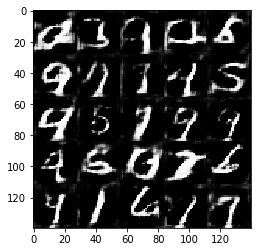

Epoch 2/2 ___  Discriminator Loss: 0.7057 ___ Generator Loss: 1.4474
Epoch 2/2 ___  Discriminator Loss: 0.6253 ___ Generator Loss: 1.6882
Epoch 2/2 ___  Discriminator Loss: 0.7854 ___ Generator Loss: 1.1586
Epoch 2/2 ___  Discriminator Loss: 0.7983 ___ Generator Loss: 1.9468
Epoch 2/2 ___  Discriminator Loss: 0.5977 ___ Generator Loss: 1.7353
Epoch 2/2 ___  Discriminator Loss: 0.4742 ___ Generator Loss: 2.4096
Epoch 2/2 ___  Discriminator Loss: 1.2552 ___ Generator Loss: 0.5690
Epoch 2/2 ___  Discriminator Loss: 0.6327 ___ Generator Loss: 1.6696
Epoch 2/2 ___  Discriminator Loss: 0.7471 ___ Generator Loss: 1.4272
Epoch 2/2 ___  Discriminator Loss: 1.4425 ___ Generator Loss: 0.5197


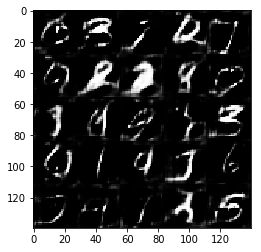

Epoch 2/2 ___  Discriminator Loss: 1.1191 ___ Generator Loss: 0.8755
Epoch 2/2 ___  Discriminator Loss: 0.5982 ___ Generator Loss: 1.8202
Epoch 2/2 ___  Discriminator Loss: 0.6846 ___ Generator Loss: 1.4320
Epoch 2/2 ___  Discriminator Loss: 0.7151 ___ Generator Loss: 1.3619
Epoch 2/2 ___  Discriminator Loss: 0.5565 ___ Generator Loss: 2.2744
Epoch 2/2 ___  Discriminator Loss: 0.7960 ___ Generator Loss: 1.9818
Epoch 2/2 ___  Discriminator Loss: 0.9413 ___ Generator Loss: 0.9637
Epoch 2/2 ___  Discriminator Loss: 1.5609 ___ Generator Loss: 0.4167
Epoch 2/2 ___  Discriminator Loss: 0.5697 ___ Generator Loss: 1.7777
Epoch 2/2 ___  Discriminator Loss: 1.1881 ___ Generator Loss: 0.7175


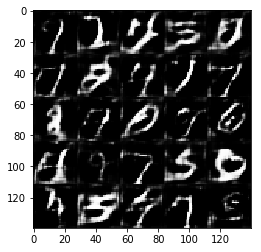

Epoch 2/2 ___  Discriminator Loss: 0.5158 ___ Generator Loss: 2.0088
Epoch 2/2 ___  Discriminator Loss: 0.8638 ___ Generator Loss: 1.0039
Epoch 2/2 ___  Discriminator Loss: 0.5619 ___ Generator Loss: 1.8951
Epoch 2/2 ___  Discriminator Loss: 0.6709 ___ Generator Loss: 1.4173
Epoch 2/2 ___  Discriminator Loss: 0.5097 ___ Generator Loss: 2.4076
Epoch 2/2 ___  Discriminator Loss: 0.8577 ___ Generator Loss: 1.3323
Epoch 2/2 ___  Discriminator Loss: 0.7165 ___ Generator Loss: 1.3397
Epoch 2/2 ___  Discriminator Loss: 0.6512 ___ Generator Loss: 1.7578
Epoch 2/2 ___  Discriminator Loss: 0.5527 ___ Generator Loss: 1.8286
Epoch 2/2 ___  Discriminator Loss: 0.6396 ___ Generator Loss: 1.4918


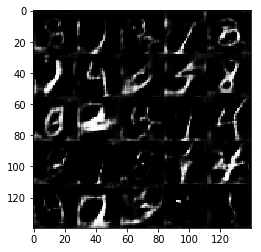

Epoch 2/2 ___  Discriminator Loss: 0.5699 ___ Generator Loss: 1.9628
Epoch 2/2 ___  Discriminator Loss: 0.8951 ___ Generator Loss: 1.0449
Epoch 2/2 ___  Discriminator Loss: 0.8732 ___ Generator Loss: 3.1375
Epoch 2/2 ___  Discriminator Loss: 0.7138 ___ Generator Loss: 1.5622
Epoch 2/2 ___  Discriminator Loss: 0.9179 ___ Generator Loss: 1.0436
Epoch 2/2 ___  Discriminator Loss: 1.2488 ___ Generator Loss: 0.6710
Epoch 2/2 ___  Discriminator Loss: 0.8121 ___ Generator Loss: 1.2268
Epoch 2/2 ___  Discriminator Loss: 0.7660 ___ Generator Loss: 1.2866
Epoch 2/2 ___  Discriminator Loss: 0.7036 ___ Generator Loss: 1.3328
Epoch 2/2 ___  Discriminator Loss: 0.5783 ___ Generator Loss: 1.8388


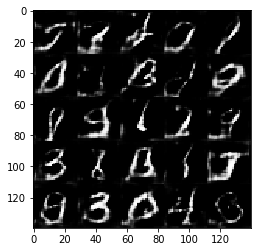

Epoch 2/2 ___  Discriminator Loss: 1.0213 ___ Generator Loss: 0.8236
Epoch 2/2 ___  Discriminator Loss: 0.6222 ___ Generator Loss: 1.9271
Epoch 2/2 ___  Discriminator Loss: 1.0922 ___ Generator Loss: 0.7629
Epoch 2/2 ___  Discriminator Loss: 0.6607 ___ Generator Loss: 1.5122
Epoch 2/2 ___  Discriminator Loss: 0.7251 ___ Generator Loss: 1.7346
Epoch 2/2 ___  Discriminator Loss: 0.8948 ___ Generator Loss: 1.0813
Epoch 2/2 ___  Discriminator Loss: 0.6286 ___ Generator Loss: 1.8132
Epoch 2/2 ___  Discriminator Loss: 0.5840 ___ Generator Loss: 2.0459
Epoch 2/2 ___  Discriminator Loss: 0.8776 ___ Generator Loss: 1.2620
Epoch 2/2 ___  Discriminator Loss: 0.6562 ___ Generator Loss: 1.6108


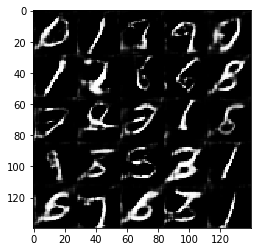

Epoch 2/2 ___  Discriminator Loss: 0.7908 ___ Generator Loss: 1.2258
Epoch 2/2 ___  Discriminator Loss: 0.6626 ___ Generator Loss: 1.6336
Epoch 2/2 ___  Discriminator Loss: 0.6512 ___ Generator Loss: 1.4419
Epoch 2/2 ___  Discriminator Loss: 0.5153 ___ Generator Loss: 2.0836
Epoch 2/2 ___  Discriminator Loss: 1.0596 ___ Generator Loss: 0.7943
Epoch 2/2 ___  Discriminator Loss: 0.5560 ___ Generator Loss: 2.0491
Epoch 2/2 ___  Discriminator Loss: 0.9015 ___ Generator Loss: 0.9948
Epoch 2/2 ___  Discriminator Loss: 0.9374 ___ Generator Loss: 1.0547
Epoch 2/2 ___  Discriminator Loss: 0.6902 ___ Generator Loss: 1.4405
Epoch 2/2 ___  Discriminator Loss: 0.8275 ___ Generator Loss: 1.2274


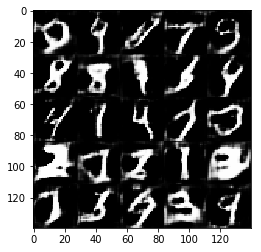

Epoch 2/2 ___  Discriminator Loss: 1.2963 ___ Generator Loss: 0.6371
Epoch 2/2 ___  Discriminator Loss: 1.6125 ___ Generator Loss: 0.4136
Epoch 2/2 ___  Discriminator Loss: 0.7841 ___ Generator Loss: 1.1587
Epoch 2/2 ___  Discriminator Loss: 0.7073 ___ Generator Loss: 1.2961
Epoch 2/2 ___  Discriminator Loss: 0.6610 ___ Generator Loss: 1.5701
Epoch 2/2 ___  Discriminator Loss: 1.1769 ___ Generator Loss: 0.7697
Epoch 2/2 ___  Discriminator Loss: 0.5940 ___ Generator Loss: 2.1342
Epoch 2/2 ___  Discriminator Loss: 0.6008 ___ Generator Loss: 1.7950
Epoch 2/2 ___  Discriminator Loss: 0.8617 ___ Generator Loss: 1.0422
Epoch 2/2 ___  Discriminator Loss: 0.7987 ___ Generator Loss: 1.1880


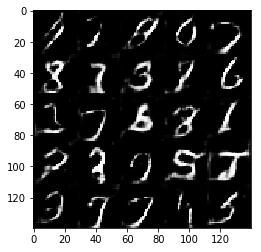

Epoch 2/2 ___  Discriminator Loss: 0.5139 ___ Generator Loss: 2.0614
Epoch 2/2 ___  Discriminator Loss: 1.0702 ___ Generator Loss: 0.8038
Epoch 2/2 ___  Discriminator Loss: 0.7170 ___ Generator Loss: 1.3604
Epoch 2/2 ___  Discriminator Loss: 0.7856 ___ Generator Loss: 1.6175
Epoch 2/2 ___  Discriminator Loss: 0.7790 ___ Generator Loss: 1.2995
Epoch 2/2 ___  Discriminator Loss: 0.7258 ___ Generator Loss: 1.2734
Epoch 2/2 ___  Discriminator Loss: 0.7507 ___ Generator Loss: 1.9599
Epoch 2/2 ___  Discriminator Loss: 0.9064 ___ Generator Loss: 1.2495
Epoch 2/2 ___  Discriminator Loss: 0.7782 ___ Generator Loss: 1.2765
Epoch 2/2 ___  Discriminator Loss: 0.5141 ___ Generator Loss: 2.3064


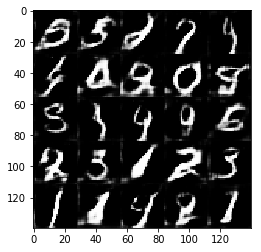

Epoch 2/2 ___  Discriminator Loss: 0.7949 ___ Generator Loss: 1.2333
Epoch 2/2 ___  Discriminator Loss: 0.5139 ___ Generator Loss: 2.1272
Epoch 2/2 ___  Discriminator Loss: 0.6062 ___ Generator Loss: 1.8793
Epoch 2/2 ___  Discriminator Loss: 0.6339 ___ Generator Loss: 1.5937
Epoch 2/2 ___  Discriminator Loss: 1.3793 ___ Generator Loss: 0.6193
Epoch 2/2 ___  Discriminator Loss: 2.2339 ___ Generator Loss: 0.2197
Epoch 2/2 ___  Discriminator Loss: 0.5347 ___ Generator Loss: 2.1295
Epoch 2/2 ___  Discriminator Loss: 0.7422 ___ Generator Loss: 1.2417
Epoch 2/2 ___  Discriminator Loss: 0.9325 ___ Generator Loss: 1.2062
Epoch 2/2 ___  Discriminator Loss: 1.6324 ___ Generator Loss: 0.4384


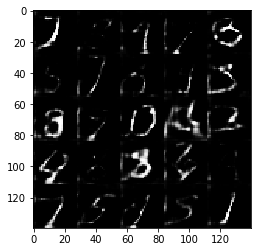

Epoch 2/2 ___  Discriminator Loss: 0.5239 ___ Generator Loss: 1.8562
Epoch 2/2 ___  Discriminator Loss: 0.7956 ___ Generator Loss: 1.3385
Epoch 2/2 ___  Discriminator Loss: 0.6579 ___ Generator Loss: 1.5631
Epoch 2/2 ___  Discriminator Loss: 0.7912 ___ Generator Loss: 1.2171
Epoch 2/2 ___  Discriminator Loss: 0.6794 ___ Generator Loss: 1.5951
Epoch 2/2 ___  Discriminator Loss: 1.0471 ___ Generator Loss: 0.8504
Epoch 2/2 ___  Discriminator Loss: 1.3078 ___ Generator Loss: 0.6006
Epoch 2/2 ___  Discriminator Loss: 0.8797 ___ Generator Loss: 0.9645
Epoch 2/2 ___  Discriminator Loss: 0.6531 ___ Generator Loss: 1.6653
Epoch 2/2 ___  Discriminator Loss: 0.5874 ___ Generator Loss: 1.7091


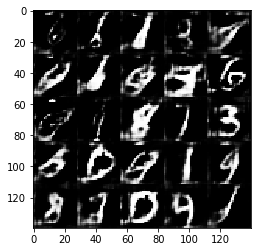

Epoch 2/2 ___  Discriminator Loss: 0.5955 ___ Generator Loss: 1.6045
Epoch 2/2 ___  Discriminator Loss: 0.6186 ___ Generator Loss: 1.6163
Epoch 2/2 ___  Discriminator Loss: 0.6740 ___ Generator Loss: 1.9203
Epoch 2/2 ___  Discriminator Loss: 0.5727 ___ Generator Loss: 1.7061
Epoch 2/2 ___  Discriminator Loss: 0.5291 ___ Generator Loss: 1.9011
Epoch 2/2 ___  Discriminator Loss: 0.9338 ___ Generator Loss: 1.0951
Epoch 2/2 ___  Discriminator Loss: 0.6872 ___ Generator Loss: 1.5215
Epoch 2/2 ___  Discriminator Loss: 0.7243 ___ Generator Loss: 1.3861
Epoch 2/2 ___  Discriminator Loss: 2.4151 ___ Generator Loss: 0.1957
Epoch 2/2 ___  Discriminator Loss: 2.3105 ___ Generator Loss: 0.2190


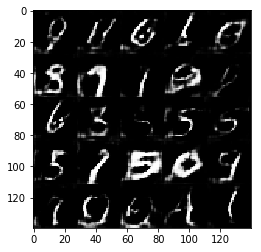

Epoch 2/2 ___  Discriminator Loss: 1.2074 ___ Generator Loss: 0.7052
Epoch 2/2 ___  Discriminator Loss: 1.1363 ___ Generator Loss: 0.7470
Epoch 2/2 ___  Discriminator Loss: 0.5402 ___ Generator Loss: 2.0161
Epoch 2/2 ___  Discriminator Loss: 0.5769 ___ Generator Loss: 1.7964
Epoch 2/2 ___  Discriminator Loss: 0.7420 ___ Generator Loss: 1.8725
Epoch 2/2 ___  Discriminator Loss: 0.6843 ___ Generator Loss: 1.3636
Epoch 2/2 ___  Discriminator Loss: 0.6765 ___ Generator Loss: 1.5938
Epoch 2/2 ___  Discriminator Loss: 0.5330 ___ Generator Loss: 2.4174
Epoch 2/2 ___  Discriminator Loss: 1.1184 ___ Generator Loss: 0.7577
Epoch 2/2 ___  Discriminator Loss: 0.9220 ___ Generator Loss: 1.0064


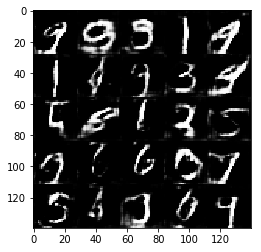

Epoch 2/2 ___  Discriminator Loss: 1.7754 ___ Generator Loss: 0.3979
Epoch 2/2 ___  Discriminator Loss: 0.7220 ___ Generator Loss: 1.3503
Epoch 2/2 ___  Discriminator Loss: 0.7918 ___ Generator Loss: 1.1999
Epoch 2/2 ___  Discriminator Loss: 1.0026 ___ Generator Loss: 0.9132
Epoch 2/2 ___  Discriminator Loss: 0.6993 ___ Generator Loss: 1.5665
Epoch 2/2 ___  Discriminator Loss: 1.0308 ___ Generator Loss: 0.8725
Epoch 2/2 ___  Discriminator Loss: 0.5444 ___ Generator Loss: 1.9801
Epoch 2/2 ___  Discriminator Loss: 0.7135 ___ Generator Loss: 1.2476
Epoch 2/2 ___  Discriminator Loss: 0.5966 ___ Generator Loss: 2.4145
Epoch 2/2 ___  Discriminator Loss: 0.6323 ___ Generator Loss: 1.7758


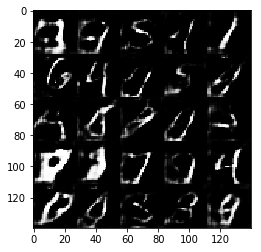

Epoch 2/2 ___  Discriminator Loss: 0.6928 ___ Generator Loss: 1.3633
Epoch 2/2 ___  Discriminator Loss: 0.7934 ___ Generator Loss: 1.2228
Epoch 2/2 ___  Discriminator Loss: 0.6463 ___ Generator Loss: 1.5778
Epoch 2/2 ___  Discriminator Loss: 0.8659 ___ Generator Loss: 1.1303
Epoch 2/2 ___  Discriminator Loss: 0.5661 ___ Generator Loss: 1.7554
Epoch 2/2 ___  Discriminator Loss: 0.6781 ___ Generator Loss: 1.3864
Epoch 2/2 ___  Discriminator Loss: 0.4417 ___ Generator Loss: 2.4050
Epoch 2/2 ___  Discriminator Loss: 1.2120 ___ Generator Loss: 0.6667
Epoch 2/2 ___  Discriminator Loss: 0.7285 ___ Generator Loss: 1.7055
Epoch 2/2 ___  Discriminator Loss: 1.3737 ___ Generator Loss: 0.5505


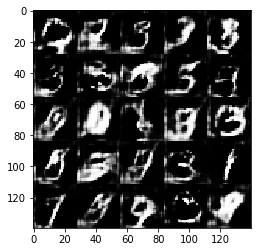

Epoch 2/2 ___  Discriminator Loss: 1.0550 ___ Generator Loss: 0.8743
Epoch 2/2 ___  Discriminator Loss: 0.7317 ___ Generator Loss: 1.4808
Epoch 2/2 ___  Discriminator Loss: 0.7905 ___ Generator Loss: 1.2588
Epoch 2/2 ___  Discriminator Loss: 1.0212 ___ Generator Loss: 0.8410
Epoch 2/2 ___  Discriminator Loss: 1.2136 ___ Generator Loss: 0.7410
Epoch 2/2 ___  Discriminator Loss: 0.8476 ___ Generator Loss: 1.0119
Epoch 2/2 ___  Discriminator Loss: 0.8762 ___ Generator Loss: 2.3906
Epoch 2/2 ___  Discriminator Loss: 0.7311 ___ Generator Loss: 1.2916
Epoch 2/2 ___  Discriminator Loss: 0.6429 ___ Generator Loss: 1.6398
Epoch 2/2 ___  Discriminator Loss: 0.6326 ___ Generator Loss: 2.0216


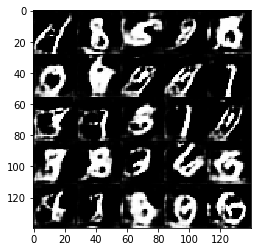

Epoch 2/2 ___  Discriminator Loss: 0.9402 ___ Generator Loss: 0.9809
Epoch 2/2 ___  Discriminator Loss: 0.5654 ___ Generator Loss: 1.9182
Epoch 2/2 ___  Discriminator Loss: 0.7666 ___ Generator Loss: 1.2143
Epoch 2/2 ___  Discriminator Loss: 0.6469 ___ Generator Loss: 1.4593
Epoch 2/2 ___  Discriminator Loss: 0.5432 ___ Generator Loss: 1.9909
Epoch 2/2 ___  Discriminator Loss: 0.8107 ___ Generator Loss: 1.1703
Epoch 2/2 ___  Discriminator Loss: 0.7168 ___ Generator Loss: 1.4958
Epoch 2/2 ___  Discriminator Loss: 0.6893 ___ Generator Loss: 1.3666
Epoch 2/2 ___  Discriminator Loss: 0.6014 ___ Generator Loss: 1.7805
Epoch 2/2 ___  Discriminator Loss: 0.8237 ___ Generator Loss: 1.1669


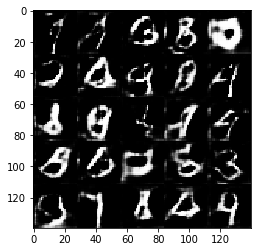

Epoch 2/2 ___  Discriminator Loss: 0.6932 ___ Generator Loss: 4.3708
Epoch 2/2 ___  Discriminator Loss: 0.6291 ___ Generator Loss: 1.6558
Epoch 2/2 ___  Discriminator Loss: 0.9091 ___ Generator Loss: 1.0318
Epoch 2/2 ___  Discriminator Loss: 0.4810 ___ Generator Loss: 2.7710
Epoch 2/2 ___  Discriminator Loss: 0.9757 ___ Generator Loss: 1.0926
Epoch 2/2 ___  Discriminator Loss: 0.7027 ___ Generator Loss: 1.4893
Epoch 2/2 ___  Discriminator Loss: 0.5669 ___ Generator Loss: 1.7719
Epoch 2/2 ___  Discriminator Loss: 0.6843 ___ Generator Loss: 1.6959
Epoch 2/2 ___  Discriminator Loss: 0.9357 ___ Generator Loss: 1.0153
Epoch 2/2 ___  Discriminator Loss: 1.2816 ___ Generator Loss: 0.6440


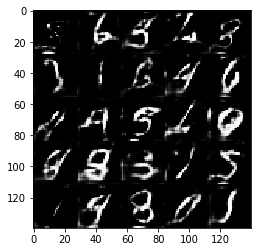

Epoch 2/2 ___  Discriminator Loss: 0.5127 ___ Generator Loss: 2.0905
Epoch 2/2 ___  Discriminator Loss: 0.4771 ___ Generator Loss: 2.2149
Epoch 2/2 ___  Discriminator Loss: 0.6068 ___ Generator Loss: 1.6122
Epoch 2/2 ___  Discriminator Loss: 0.4269 ___ Generator Loss: 2.7481
Epoch 2/2 ___  Discriminator Loss: 0.7471 ___ Generator Loss: 1.2645
Epoch 2/2 ___  Discriminator Loss: 0.4997 ___ Generator Loss: 2.3975
Epoch 2/2 ___  Discriminator Loss: 0.7050 ___ Generator Loss: 1.5119
Epoch 2/2 ___  Discriminator Loss: 0.5961 ___ Generator Loss: 2.1865
Epoch 2/2 ___  Discriminator Loss: 0.8143 ___ Generator Loss: 1.1628
Epoch 2/2 ___  Discriminator Loss: 1.2467 ___ Generator Loss: 0.7421


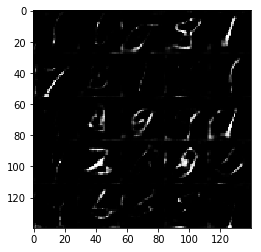

Epoch 2/2 ___  Discriminator Loss: 0.7746 ___ Generator Loss: 1.1340
Epoch 2/2 ___  Discriminator Loss: 1.1320 ___ Generator Loss: 0.6730
Epoch 2/2 ___  Discriminator Loss: 0.5651 ___ Generator Loss: 2.2105
Epoch 2/2 ___  Discriminator Loss: 1.2539 ___ Generator Loss: 0.6975
Epoch 2/2 ___  Discriminator Loss: 0.6222 ___ Generator Loss: 1.7508
Epoch 2/2 ___  Discriminator Loss: 0.6198 ___ Generator Loss: 2.2593
Epoch 2/2 ___  Discriminator Loss: 0.5885 ___ Generator Loss: 1.7491
Epoch 2/2 ___  Discriminator Loss: 0.5880 ___ Generator Loss: 1.8801
Epoch 2/2 ___  Discriminator Loss: 0.6533 ___ Generator Loss: 1.5260
Epoch 2/2 ___  Discriminator Loss: 0.5447 ___ Generator Loss: 2.0212


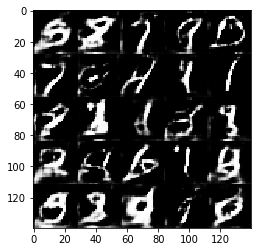

Epoch 2/2 ___  Discriminator Loss: 0.7381 ___ Generator Loss: 1.3998
Epoch 2/2 ___  Discriminator Loss: 0.8271 ___ Generator Loss: 1.2481
Epoch 2/2 ___  Discriminator Loss: 0.5370 ___ Generator Loss: 2.0144
Epoch 2/2 ___  Discriminator Loss: 0.9676 ___ Generator Loss: 1.1772
Epoch 2/2 ___  Discriminator Loss: 0.7580 ___ Generator Loss: 1.3227
Epoch 2/2 ___  Discriminator Loss: 0.8738 ___ Generator Loss: 1.0121
Epoch 2/2 ___  Discriminator Loss: 0.5843 ___ Generator Loss: 1.7422
Epoch 2/2 ___  Discriminator Loss: 1.7580 ___ Generator Loss: 0.4288
Epoch 2/2 ___  Discriminator Loss: 1.4272 ___ Generator Loss: 4.2461
Epoch 2/2 ___  Discriminator Loss: 1.3736 ___ Generator Loss: 0.5878


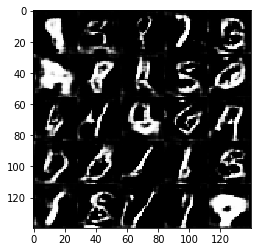

Epoch 2/2 ___  Discriminator Loss: 0.6671 ___ Generator Loss: 1.6692
Epoch 2/2 ___  Discriminator Loss: 0.7417 ___ Generator Loss: 1.2237
Epoch 2/2 ___  Discriminator Loss: 1.4738 ___ Generator Loss: 0.7882
Epoch 2/2 ___  Discriminator Loss: 0.9850 ___ Generator Loss: 0.9664
Epoch 2/2 ___  Discriminator Loss: 0.7759 ___ Generator Loss: 1.2002
Epoch 2/2 ___  Discriminator Loss: 0.5353 ___ Generator Loss: 2.1776
Epoch 2/2 ___  Discriminator Loss: 0.6838 ___ Generator Loss: 1.3450
Epoch 2/2 ___  Discriminator Loss: 0.6798 ___ Generator Loss: 1.5056
Epoch 2/2 ___  Discriminator Loss: 0.4139 ___ Generator Loss: 2.8811
Epoch 2/2 ___  Discriminator Loss: 0.6241 ___ Generator Loss: 1.5938


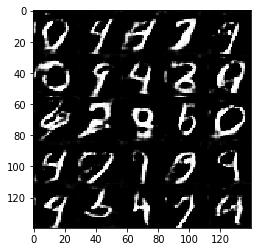

Epoch 2/2 ___  Discriminator Loss: 0.7214 ___ Generator Loss: 1.4114
Epoch 2/2 ___  Discriminator Loss: 0.7528 ___ Generator Loss: 1.2644
Epoch 2/2 ___  Discriminator Loss: 0.5687 ___ Generator Loss: 1.7766
Epoch 2/2 ___  Discriminator Loss: 0.8828 ___ Generator Loss: 1.1005
Epoch 2/2 ___  Discriminator Loss: 1.9892 ___ Generator Loss: 0.2679
Epoch 2/2 ___  Discriminator Loss: 0.7223 ___ Generator Loss: 1.3482
Epoch 2/2 ___  Discriminator Loss: 0.5596 ___ Generator Loss: 1.9174
Epoch 2/2 ___  Discriminator Loss: 1.1807 ___ Generator Loss: 0.7414
Epoch 2/2 ___  Discriminator Loss: 0.8083 ___ Generator Loss: 1.0872
Epoch 2/2 ___  Discriminator Loss: 0.4366 ___ Generator Loss: 2.5074


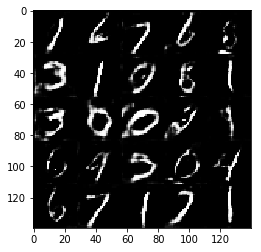

Epoch 2/2 ___  Discriminator Loss: 0.5622 ___ Generator Loss: 1.7469
Epoch 2/2 ___  Discriminator Loss: 0.9867 ___ Generator Loss: 0.8883
Epoch 2/2 ___  Discriminator Loss: 0.8930 ___ Generator Loss: 2.8047
Epoch 2/2 ___  Discriminator Loss: 1.4458 ___ Generator Loss: 0.4680
Epoch 2/2 ___  Discriminator Loss: 1.2595 ___ Generator Loss: 0.7825
Epoch 2/2 ___  Discriminator Loss: 0.6007 ___ Generator Loss: 1.6652
Epoch 2/2 ___  Discriminator Loss: 0.7148 ___ Generator Loss: 1.2897
Epoch 2/2 ___  Discriminator Loss: 0.5708 ___ Generator Loss: 2.2901
Epoch 2/2 ___  Discriminator Loss: 0.6676 ___ Generator Loss: 1.4504
Epoch 2/2 ___  Discriminator Loss: 1.9546 ___ Generator Loss: 0.2931


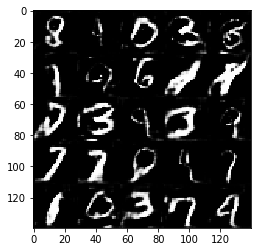

Epoch 2/2 ___  Discriminator Loss: 0.8702 ___ Generator Loss: 1.2664
Epoch 2/2 ___  Discriminator Loss: 0.6493 ___ Generator Loss: 1.3793
Epoch 2/2 ___  Discriminator Loss: 0.5042 ___ Generator Loss: 2.1965
Epoch 2/2 ___  Discriminator Loss: 0.5946 ___ Generator Loss: 1.8421
Epoch 2/2 ___  Discriminator Loss: 0.5889 ___ Generator Loss: 1.8169
Epoch 2/2 ___  Discriminator Loss: 0.5860 ___ Generator Loss: 1.9539
Epoch 2/2 ___  Discriminator Loss: 1.5181 ___ Generator Loss: 0.5426
Epoch 2/2 ___  Discriminator Loss: 0.6747 ___ Generator Loss: 1.4702
Epoch 2/2 ___  Discriminator Loss: 0.4786 ___ Generator Loss: 2.5691
Epoch 2/2 ___  Discriminator Loss: 0.7286 ___ Generator Loss: 1.5254


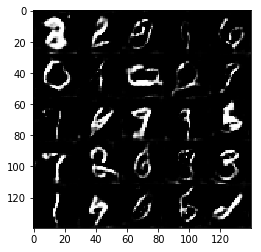

Epoch 2/2 ___  Discriminator Loss: 0.6558 ___ Generator Loss: 1.3874
Epoch 2/2 ___  Discriminator Loss: 0.5523 ___ Generator Loss: 2.0817
Epoch 2/2 ___  Discriminator Loss: 0.5548 ___ Generator Loss: 1.9241
Epoch 2/2 ___  Discriminator Loss: 0.6712 ___ Generator Loss: 1.3762
Epoch 2/2 ___  Discriminator Loss: 0.6943 ___ Generator Loss: 1.6045
Epoch 2/2 ___  Discriminator Loss: 2.0523 ___ Generator Loss: 0.2613
Epoch 2/2 ___  Discriminator Loss: 0.5535 ___ Generator Loss: 2.2944
Epoch 2/2 ___  Discriminator Loss: 0.7325 ___ Generator Loss: 1.2061
Epoch 2/2 ___  Discriminator Loss: 0.7076 ___ Generator Loss: 1.3114
Epoch 2/2 ___  Discriminator Loss: 1.3714 ___ Generator Loss: 0.6628


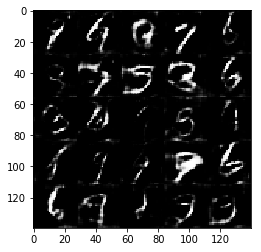

Epoch 2/2 ___  Discriminator Loss: 0.6828 ___ Generator Loss: 1.4423
Epoch 2/2 ___  Discriminator Loss: 1.0154 ___ Generator Loss: 4.0638
Epoch 2/2 ___  Discriminator Loss: 0.7046 ___ Generator Loss: 1.3275
Epoch 2/2 ___  Discriminator Loss: 0.9943 ___ Generator Loss: 0.8858
Epoch 2/2 ___  Discriminator Loss: 0.6197 ___ Generator Loss: 1.7212
Epoch 2/2 ___  Discriminator Loss: 0.8002 ___ Generator Loss: 1.3401
Epoch 2/2 ___  Discriminator Loss: 0.6315 ___ Generator Loss: 1.6352
Epoch 2/2 ___  Discriminator Loss: 0.6168 ___ Generator Loss: 1.9200
Epoch 2/2 ___  Discriminator Loss: 0.5460 ___ Generator Loss: 2.0899
Epoch 2/2 ___  Discriminator Loss: 1.1599 ___ Generator Loss: 0.7592


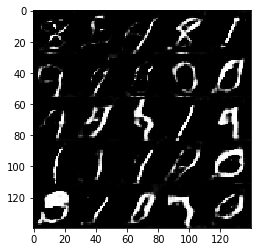

Epoch 2/2 ___  Discriminator Loss: 1.1221 ___ Generator Loss: 0.8279
Epoch 2/2 ___  Discriminator Loss: 1.7370 ___ Generator Loss: 0.4272
Epoch 2/2 ___  Discriminator Loss: 0.9849 ___ Generator Loss: 0.9935
Epoch 2/2 ___  Discriminator Loss: 0.4936 ___ Generator Loss: 2.3114
Epoch 2/2 ___  Discriminator Loss: 0.9284 ___ Generator Loss: 0.9670
Epoch 2/2 ___  Discriminator Loss: 0.5196 ___ Generator Loss: 2.2074
Epoch 2/2 ___  Discriminator Loss: 0.5930 ___ Generator Loss: 1.6533
Epoch 2/2 ___  Discriminator Loss: 0.5065 ___ Generator Loss: 2.1810
Epoch 2/2 ___  Discriminator Loss: 0.7964 ___ Generator Loss: 1.1642
Epoch 2/2 ___  Discriminator Loss: 0.6541 ___ Generator Loss: 1.4440


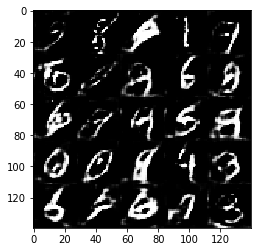

Epoch 2/2 ___  Discriminator Loss: 0.7381 ___ Generator Loss: 1.2410
Epoch 2/2 ___  Discriminator Loss: 0.6938 ___ Generator Loss: 1.5069
Epoch 2/2 ___  Discriminator Loss: 0.6045 ___ Generator Loss: 1.6473
Epoch 2/2 ___  Discriminator Loss: 0.8016 ___ Generator Loss: 1.2651
Epoch 2/2 ___  Discriminator Loss: 0.7368 ___ Generator Loss: 1.3294
Epoch 2/2 ___  Discriminator Loss: 0.5429 ___ Generator Loss: 2.0385
Epoch 2/2 ___  Discriminator Loss: 1.0058 ___ Generator Loss: 0.9239
Epoch 2/2 ___  Discriminator Loss: 0.6613 ___ Generator Loss: 1.4858
Epoch 2/2 ___  Discriminator Loss: 0.6292 ___ Generator Loss: 1.6426
Epoch 2/2 ___  Discriminator Loss: 1.2209 ___ Generator Loss: 0.6465


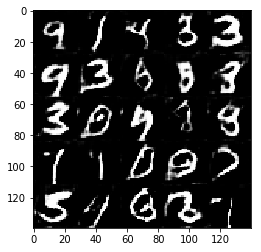

Epoch 2/2 ___  Discriminator Loss: 0.6347 ___ Generator Loss: 1.5604
Epoch 2/2 ___  Discriminator Loss: 0.7292 ___ Generator Loss: 1.2941
Epoch 2/2 ___  Discriminator Loss: 0.7066 ___ Generator Loss: 1.3525
Epoch 2/2 ___  Discriminator Loss: 0.5056 ___ Generator Loss: 2.3681
Epoch 2/2 ___  Discriminator Loss: 1.6549 ___ Generator Loss: 3.8342
Epoch 2/2 ___  Discriminator Loss: 1.4388 ___ Generator Loss: 0.7402
Epoch 2/2 ___  Discriminator Loss: 1.8521 ___ Generator Loss: 4.1555
Epoch 2/2 ___  Discriminator Loss: 1.3382 ___ Generator Loss: 0.5699
Epoch 2/2 ___  Discriminator Loss: 0.9028 ___ Generator Loss: 2.0882
Epoch 2/2 ___  Discriminator Loss: 0.5709 ___ Generator Loss: 2.2389


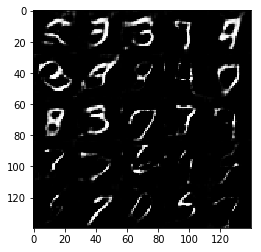

Epoch 2/2 ___  Discriminator Loss: 1.2662 ___ Generator Loss: 0.5974
Epoch 2/2 ___  Discriminator Loss: 0.7360 ___ Generator Loss: 1.3597
Epoch 2/2 ___  Discriminator Loss: 0.6965 ___ Generator Loss: 1.6546
Epoch 2/2 ___  Discriminator Loss: 0.5181 ___ Generator Loss: 2.5329
Epoch 2/2 ___  Discriminator Loss: 0.5953 ___ Generator Loss: 1.9450
Epoch 2/2 ___  Discriminator Loss: 0.8841 ___ Generator Loss: 1.1138
Epoch 2/2 ___  Discriminator Loss: 0.6583 ___ Generator Loss: 1.6554
Epoch 2/2 ___  Discriminator Loss: 0.9510 ___ Generator Loss: 0.9635
Epoch 2/2 ___  Discriminator Loss: 0.5853 ___ Generator Loss: 1.8369
Epoch 2/2 ___  Discriminator Loss: 1.0288 ___ Generator Loss: 0.9413


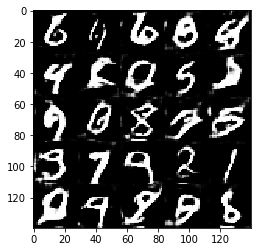

Epoch 2/2 ___  Discriminator Loss: 0.4816 ___ Generator Loss: 2.2337
Epoch 2/2 ___  Discriminator Loss: 0.8319 ___ Generator Loss: 0.9909
Epoch 2/2 ___  Discriminator Loss: 0.5498 ___ Generator Loss: 1.9477
Epoch 2/2 ___  Discriminator Loss: 0.4258 ___ Generator Loss: 2.5835
Epoch 2/2 ___  Discriminator Loss: 0.9955 ___ Generator Loss: 0.9524
Epoch 2/2 ___  Discriminator Loss: 0.6862 ___ Generator Loss: 1.8078
Epoch 2/2 ___  Discriminator Loss: 0.7526 ___ Generator Loss: 1.3062
Epoch 2/2 ___  Discriminator Loss: 0.7009 ___ Generator Loss: 1.3149
Epoch 2/2 ___  Discriminator Loss: 0.6584 ___ Generator Loss: 1.5571
Epoch 2/2 ___  Discriminator Loss: 0.6862 ___ Generator Loss: 1.4835


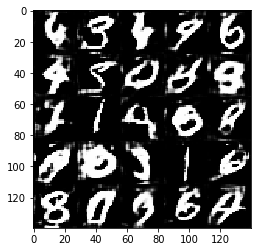

Epoch 2/2 ___  Discriminator Loss: 0.7143 ___ Generator Loss: 1.5341
Epoch 2/2 ___  Discriminator Loss: 0.4456 ___ Generator Loss: 2.4384
Epoch 2/2 ___  Discriminator Loss: 1.3988 ___ Generator Loss: 0.6305
Epoch 2/2 ___  Discriminator Loss: 1.4814 ___ Generator Loss: 0.4406
Epoch 2/2 ___  Discriminator Loss: 0.5255 ___ Generator Loss: 2.3222
Epoch 2/2 ___  Discriminator Loss: 1.3920 ___ Generator Loss: 0.5796
Epoch 2/2 ___  Discriminator Loss: 0.4709 ___ Generator Loss: 2.4007
Epoch 2/2 ___  Discriminator Loss: 0.5167 ___ Generator Loss: 2.1941
Epoch 2/2 ___  Discriminator Loss: 0.5683 ___ Generator Loss: 1.7908
Epoch 2/2 ___  Discriminator Loss: 1.0366 ___ Generator Loss: 0.8499


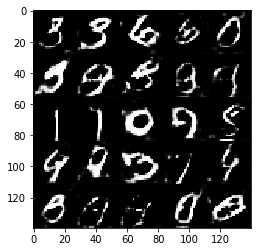

Epoch 2/2 ___  Discriminator Loss: 0.9948 ___ Generator Loss: 0.8179
Epoch 2/2 ___  Discriminator Loss: 1.0171 ___ Generator Loss: 0.9843
Epoch 2/2 ___  Discriminator Loss: 0.9486 ___ Generator Loss: 1.0544
Epoch 2/2 ___  Discriminator Loss: 1.3608 ___ Generator Loss: 0.5266
Epoch 2/2 ___  Discriminator Loss: 2.0876 ___ Generator Loss: 0.2640
Epoch 2/2 ___  Discriminator Loss: 0.8332 ___ Generator Loss: 1.9840
Epoch 2/2 ___  Discriminator Loss: 0.7480 ___ Generator Loss: 1.2426
Epoch 2/2 ___  Discriminator Loss: 0.9544 ___ Generator Loss: 1.0022
Epoch 2/2 ___  Discriminator Loss: 0.8813 ___ Generator Loss: 1.0192
Epoch 2/2 ___  Discriminator Loss: 0.5924 ___ Generator Loss: 1.7115


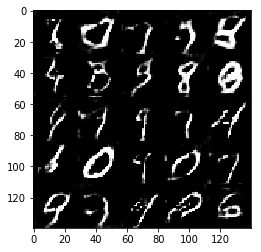

Epoch 2/2 ___  Discriminator Loss: 0.7242 ___ Generator Loss: 1.3892
Epoch 2/2 ___  Discriminator Loss: 0.8208 ___ Generator Loss: 1.1254
Epoch 2/2 ___  Discriminator Loss: 0.6372 ___ Generator Loss: 1.4893
Epoch 2/2 ___  Discriminator Loss: 0.6100 ___ Generator Loss: 1.6839
Epoch 2/2 ___  Discriminator Loss: 0.5674 ___ Generator Loss: 1.8923
Epoch 2/2 ___  Discriminator Loss: 1.1352 ___ Generator Loss: 0.7266
Epoch 2/2 ___  Discriminator Loss: 0.5369 ___ Generator Loss: 1.9390
Epoch 2/2 ___  Discriminator Loss: 0.7505 ___ Generator Loss: 1.2231
Epoch 2/2 ___  Discriminator Loss: 0.6420 ___ Generator Loss: 1.4696
Epoch 2/2 ___  Discriminator Loss: 0.7121 ___ Generator Loss: 1.3874


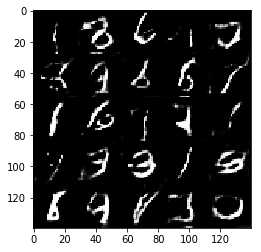

Epoch 2/2 ___  Discriminator Loss: 0.4612 ___ Generator Loss: 2.4251
Epoch 2/2 ___  Discriminator Loss: 0.5003 ___ Generator Loss: 2.2839
Epoch 2/2 ___  Discriminator Loss: 0.4792 ___ Generator Loss: 2.7927
Epoch 2/2 ___  Discriminator Loss: 0.8115 ___ Generator Loss: 1.3988
Epoch 2/2 ___  Discriminator Loss: 0.5352 ___ Generator Loss: 1.8910
Epoch 2/2 ___  Discriminator Loss: 0.5064 ___ Generator Loss: 2.1543
Epoch 2/2 ___  Discriminator Loss: 0.5958 ___ Generator Loss: 1.9115
Epoch 2/2 ___  Discriminator Loss: 0.5552 ___ Generator Loss: 1.9788
Epoch 2/2 ___  Discriminator Loss: 0.9558 ___ Generator Loss: 0.9002
Epoch 2/2 ___  Discriminator Loss: 0.6039 ___ Generator Loss: 1.6496


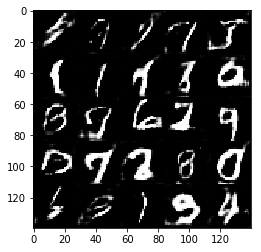

Epoch 2/2 ___  Discriminator Loss: 0.7293 ___ Generator Loss: 1.5693
Epoch 2/2 ___  Discriminator Loss: 0.7042 ___ Generator Loss: 1.4854
Epoch 2/2 ___  Discriminator Loss: 1.0438 ___ Generator Loss: 0.8737
Epoch 2/2 ___  Discriminator Loss: 1.6978 ___ Generator Loss: 3.4810
Epoch 2/2 ___  Discriminator Loss: 0.8007 ___ Generator Loss: 2.0776
Epoch 2/2 ___  Discriminator Loss: 1.3481 ___ Generator Loss: 0.5084
Epoch 2/2 ___  Discriminator Loss: 0.9873 ___ Generator Loss: 0.9289
Epoch 2/2 ___  Discriminator Loss: 0.6616 ___ Generator Loss: 1.5080
Epoch 2/2 ___  Discriminator Loss: 0.5259 ___ Generator Loss: 2.7313
Epoch 2/2 ___  Discriminator Loss: 1.8601 ___ Generator Loss: 0.3379


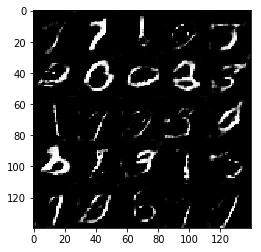

Epoch 2/2 ___  Discriminator Loss: 0.9064 ___ Generator Loss: 0.9887
Epoch 2/2 ___  Discriminator Loss: 0.6401 ___ Generator Loss: 1.5091
Epoch 2/2 ___  Discriminator Loss: 0.7357 ___ Generator Loss: 1.2908
Epoch 2/2 ___  Discriminator Loss: 1.1503 ___ Generator Loss: 0.8366
Epoch 2/2 ___  Discriminator Loss: 0.8842 ___ Generator Loss: 1.1973
Epoch 2/2 ___  Discriminator Loss: 0.6425 ___ Generator Loss: 1.6175
Epoch 2/2 ___  Discriminator Loss: 0.6076 ___ Generator Loss: 1.6742
Epoch 2/2 ___  Discriminator Loss: 0.5532 ___ Generator Loss: 2.2647
Epoch 2/2 ___  Discriminator Loss: 0.8852 ___ Generator Loss: 0.9907
Epoch 2/2 ___  Discriminator Loss: 1.4347 ___ Generator Loss: 0.5040


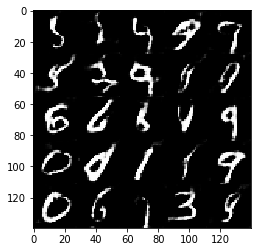

Epoch 2/2 ___  Discriminator Loss: 1.0915 ___ Generator Loss: 0.7940
Epoch 2/2 ___  Discriminator Loss: 0.6555 ___ Generator Loss: 1.5462
Epoch 2/2 ___  Discriminator Loss: 1.1781 ___ Generator Loss: 0.7285
Epoch 2/2 ___  Discriminator Loss: 0.7755 ___ Generator Loss: 1.1919
Epoch 2/2 ___  Discriminator Loss: 0.6572 ___ Generator Loss: 1.5536
Epoch 2/2 ___  Discriminator Loss: 0.4749 ___ Generator Loss: 2.6602
Epoch 2/2 ___  Discriminator Loss: 0.4947 ___ Generator Loss: 2.1251
Epoch 2/2 ___  Discriminator Loss: 0.8367 ___ Generator Loss: 1.1069
Epoch 2/2 ___  Discriminator Loss: 0.7331 ___ Generator Loss: 1.3112
Epoch 2/2 ___  Discriminator Loss: 0.8957 ___ Generator Loss: 0.9994


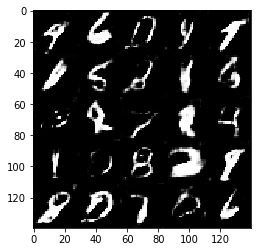

Epoch 2/2 ___  Discriminator Loss: 0.7847 ___ Generator Loss: 1.2465
Epoch 2/2 ___  Discriminator Loss: 0.6608 ___ Generator Loss: 1.5364
Epoch 2/2 ___  Discriminator Loss: 0.8578 ___ Generator Loss: 1.0912
Epoch 2/2 ___  Discriminator Loss: 0.7586 ___ Generator Loss: 1.2581
Epoch 2/2 ___  Discriminator Loss: 0.8665 ___ Generator Loss: 1.0275
Epoch 2/2 ___  Discriminator Loss: 1.6250 ___ Generator Loss: 0.6265
Epoch 2/2 ___  Discriminator Loss: 0.5200 ___ Generator Loss: 2.2881
Epoch 2/2 ___  Discriminator Loss: 0.5881 ___ Generator Loss: 1.7653
Epoch 2/2 ___  Discriminator Loss: 0.8942 ___ Generator Loss: 1.0799
Epoch 2/2 ___  Discriminator Loss: 0.6756 ___ Generator Loss: 1.4358


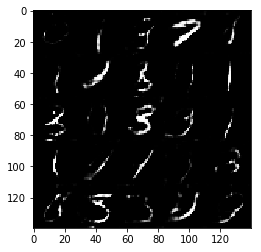

Epoch 2/2 ___  Discriminator Loss: 0.8969 ___ Generator Loss: 1.1634
Epoch 2/2 ___  Discriminator Loss: 0.7729 ___ Generator Loss: 1.3152
Epoch 2/2 ___  Discriminator Loss: 1.8131 ___ Generator Loss: 0.4515
Epoch 2/2 ___  Discriminator Loss: 1.8371 ___ Generator Loss: 0.3656
Epoch 2/2 ___  Discriminator Loss: 0.6533 ___ Generator Loss: 1.6254
Epoch 2/2 ___  Discriminator Loss: 1.5281 ___ Generator Loss: 0.4866
Epoch 2/2 ___  Discriminator Loss: 0.7310 ___ Generator Loss: 1.3784
Epoch 2/2 ___  Discriminator Loss: 0.6942 ___ Generator Loss: 1.3125
Epoch 2/2 ___  Discriminator Loss: 0.7664 ___ Generator Loss: 1.2654
Epoch 2/2 ___  Discriminator Loss: 0.6807 ___ Generator Loss: 1.3574


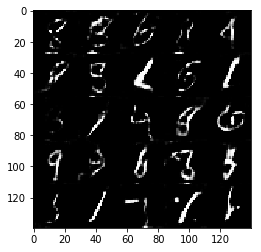

Epoch 2/2 ___  Discriminator Loss: 0.8605 ___ Generator Loss: 1.0387
Epoch 2/2 ___  Discriminator Loss: 0.5150 ___ Generator Loss: 2.0192
Epoch 2/2 ___  Discriminator Loss: 0.6671 ___ Generator Loss: 1.7449
Epoch 2/2 ___  Discriminator Loss: 0.6062 ___ Generator Loss: 1.6907
Epoch 2/2 ___  Discriminator Loss: 0.5876 ___ Generator Loss: 1.7870
Epoch 2/2 ___  Discriminator Loss: 0.4201 ___ Generator Loss: 2.9929
Epoch 2/2 ___  Discriminator Loss: 0.6000 ___ Generator Loss: 1.6731
Epoch 2/2 ___  Discriminator Loss: 0.4655 ___ Generator Loss: 3.0775
Epoch 2/2 ___  Discriminator Loss: 0.5098 ___ Generator Loss: 2.0454
Epoch 2/2 ___  Discriminator Loss: 0.7219 ___ Generator Loss: 1.4485


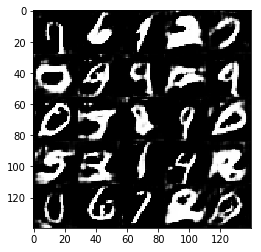

Epoch 2/2 ___  Discriminator Loss: 0.5171 ___ Generator Loss: 2.0343
Epoch 2/2 ___  Discriminator Loss: 0.5702 ___ Generator Loss: 1.7855
Epoch 2/2 ___  Discriminator Loss: 0.8196 ___ Generator Loss: 1.2459
Epoch 2/2 ___  Discriminator Loss: 0.7120 ___ Generator Loss: 1.5112
Epoch 2/2 ___  Discriminator Loss: 1.3982 ___ Generator Loss: 0.6091
Epoch 2/2 ___  Discriminator Loss: 0.9199 ___ Generator Loss: 1.0436
Epoch 2/2 ___  Discriminator Loss: 0.5784 ___ Generator Loss: 2.0058
Epoch 2/2 ___  Discriminator Loss: 0.9943 ___ Generator Loss: 0.8986
Epoch 2/2 ___  Discriminator Loss: 0.9421 ___ Generator Loss: 0.9372
Epoch 2/2 ___  Discriminator Loss: 0.5383 ___ Generator Loss: 2.4080


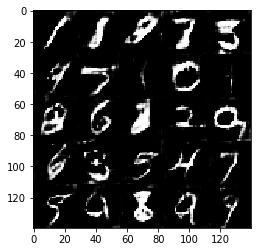

Epoch 2/2 ___  Discriminator Loss: 0.6528 ___ Generator Loss: 1.5009
Epoch 2/2 ___  Discriminator Loss: 0.4233 ___ Generator Loss: 2.8022
Epoch 2/2 ___  Discriminator Loss: 0.6722 ___ Generator Loss: 1.5639
Epoch 2/2 ___  Discriminator Loss: 0.5691 ___ Generator Loss: 2.0270
Epoch 2/2 ___  Discriminator Loss: 0.6439 ___ Generator Loss: 1.5695
Epoch 2/2 ___  Discriminator Loss: 0.6043 ___ Generator Loss: 1.8003
Epoch 2/2 ___  Discriminator Loss: 0.6702 ___ Generator Loss: 1.5057
Epoch 2/2 ___  Discriminator Loss: 1.0461 ___ Generator Loss: 3.8461
Epoch 2/2 ___  Discriminator Loss: 1.3934 ___ Generator Loss: 0.5966
Epoch 2/2 ___  Discriminator Loss: 1.1002 ___ Generator Loss: 0.8953


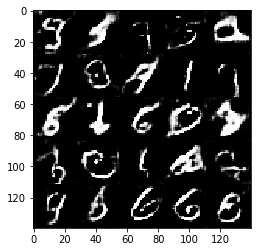

Epoch 2/2 ___  Discriminator Loss: 0.8295 ___ Generator Loss: 1.0997
Epoch 2/2 ___  Discriminator Loss: 0.8024 ___ Generator Loss: 1.1691
Epoch 2/2 ___  Discriminator Loss: 0.5216 ___ Generator Loss: 2.0222
Epoch 2/2 ___  Discriminator Loss: 0.6909 ___ Generator Loss: 2.8186
Epoch 2/2 ___  Discriminator Loss: 0.4990 ___ Generator Loss: 2.2529
Epoch 2/2 ___  Discriminator Loss: 0.4736 ___ Generator Loss: 2.3314
Epoch 2/2 ___  Discriminator Loss: 0.9948 ___ Generator Loss: 3.6707
Epoch 2/2 ___  Discriminator Loss: 1.2230 ___ Generator Loss: 0.8426
Epoch 2/2 ___  Discriminator Loss: 0.9320 ___ Generator Loss: 2.4748
Epoch 2/2 ___  Discriminator Loss: 0.7488 ___ Generator Loss: 2.0870


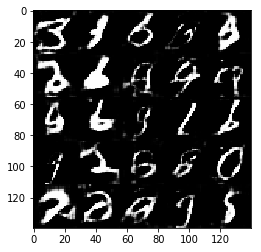

Epoch 2/2 ___  Discriminator Loss: 1.9527 ___ Generator Loss: 0.4598
Epoch 2/2 ___  Discriminator Loss: 0.9423 ___ Generator Loss: 1.2617
Epoch 2/2 ___  Discriminator Loss: 0.7388 ___ Generator Loss: 1.3905
Epoch 2/2 ___  Discriminator Loss: 0.6127 ___ Generator Loss: 1.9241
Epoch 2/2 ___  Discriminator Loss: 0.9177 ___ Generator Loss: 1.0202
Epoch 2/2 ___  Discriminator Loss: 0.8880 ___ Generator Loss: 1.0636
Epoch 2/2 ___  Discriminator Loss: 0.6220 ___ Generator Loss: 1.5246
Epoch 2/2 ___  Discriminator Loss: 0.5285 ___ Generator Loss: 2.2365
Epoch 2/2 ___  Discriminator Loss: 1.0554 ___ Generator Loss: 0.7774
Epoch 2/2 ___  Discriminator Loss: 1.3357 ___ Generator Loss: 0.6882


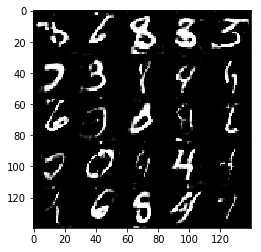

Epoch 2/2 ___  Discriminator Loss: 1.1371 ___ Generator Loss: 0.7954
Epoch 2/2 ___  Discriminator Loss: 0.5921 ___ Generator Loss: 2.4992
Epoch 2/2 ___  Discriminator Loss: 0.6065 ___ Generator Loss: 2.3837
Epoch 2/2 ___  Discriminator Loss: 0.6064 ___ Generator Loss: 1.8784
Epoch 2/2 ___  Discriminator Loss: 0.6082 ___ Generator Loss: 1.7423
Epoch 2/2 ___  Discriminator Loss: 0.6056 ___ Generator Loss: 2.1296
Epoch 2/2 ___  Discriminator Loss: 2.1252 ___ Generator Loss: 0.3394
Epoch 2/2 ___  Discriminator Loss: 0.6587 ___ Generator Loss: 1.6831
Epoch 2/2 ___  Discriminator Loss: 0.5094 ___ Generator Loss: 2.0128
Epoch 2/2 ___  Discriminator Loss: 0.9494 ___ Generator Loss: 0.9226


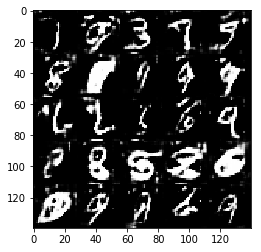

Epoch 2/2 ___  Discriminator Loss: 0.7560 ___ Generator Loss: 1.2420
Epoch 2/2 ___  Discriminator Loss: 0.6396 ___ Generator Loss: 3.1807
Epoch 2/2 ___  Discriminator Loss: 1.0265 ___ Generator Loss: 4.0440
Epoch 2/2 ___  Discriminator Loss: 0.9944 ___ Generator Loss: 0.9132
Epoch 2/2 ___  Discriminator Loss: 0.6833 ___ Generator Loss: 1.4109
Epoch 2/2 ___  Discriminator Loss: 0.8275 ___ Generator Loss: 1.0380
Epoch 2/2 ___  Discriminator Loss: 0.6063 ___ Generator Loss: 1.6500
Epoch 2/2 ___  Discriminator Loss: 0.5303 ___ Generator Loss: 2.1572
Epoch 2/2 ___  Discriminator Loss: 1.1975 ___ Generator Loss: 0.8376
Epoch 2/2 ___  Discriminator Loss: 0.5878 ___ Generator Loss: 1.8258


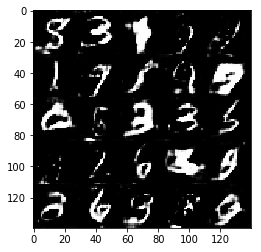

Epoch 2/2 ___  Discriminator Loss: 0.9034 ___ Generator Loss: 1.0156
Epoch 2/2 ___  Discriminator Loss: 0.6324 ___ Generator Loss: 1.6811
Epoch 2/2 ___  Discriminator Loss: 0.5541 ___ Generator Loss: 1.8062
Epoch 2/2 ___  Discriminator Loss: 0.6664 ___ Generator Loss: 1.4079
Epoch 2/2 ___  Discriminator Loss: 0.4878 ___ Generator Loss: 2.2274
Epoch 2/2 ___  Discriminator Loss: 0.5509 ___ Generator Loss: 2.0461
Epoch 2/2 ___  Discriminator Loss: 1.1694 ___ Generator Loss: 0.7431
Epoch 2/2 ___  Discriminator Loss: 0.6817 ___ Generator Loss: 1.3021
Epoch 2/2 ___  Discriminator Loss: 0.7180 ___ Generator Loss: 1.6652
Epoch 2/2 ___  Discriminator Loss: 0.6260 ___ Generator Loss: 1.5178


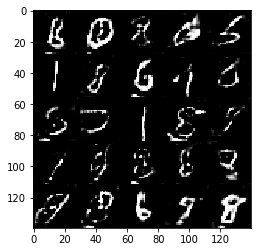

Epoch 2/2 ___  Discriminator Loss: 0.7277 ___ Generator Loss: 1.2794
Epoch 2/2 ___  Discriminator Loss: 0.8203 ___ Generator Loss: 1.2261
Epoch 2/2 ___  Discriminator Loss: 0.5784 ___ Generator Loss: 2.0319
Epoch 2/2 ___  Discriminator Loss: 0.5573 ___ Generator Loss: 2.0245
Epoch 2/2 ___  Discriminator Loss: 0.8373 ___ Generator Loss: 1.1338
Epoch 2/2 ___  Discriminator Loss: 0.7820 ___ Generator Loss: 1.1972
Epoch 2/2 ___  Discriminator Loss: 1.3651 ___ Generator Loss: 0.5459
Epoch 2/2 ___  Discriminator Loss: 0.7627 ___ Generator Loss: 1.2332
Epoch 2/2 ___  Discriminator Loss: 0.7066 ___ Generator Loss: 1.4631
Epoch 2/2 ___  Discriminator Loss: 0.4902 ___ Generator Loss: 2.2658


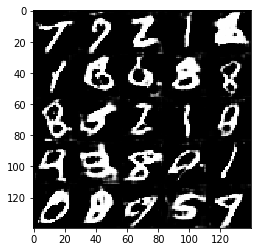

Epoch 2/2 ___  Discriminator Loss: 0.8953 ___ Generator Loss: 1.0021
Epoch 2/2 ___  Discriminator Loss: 1.2254 ___ Generator Loss: 0.6395
Epoch 2/2 ___  Discriminator Loss: 0.6173 ___ Generator Loss: 1.8981
Epoch 2/2 ___  Discriminator Loss: 1.1055 ___ Generator Loss: 0.7819
Epoch 2/2 ___  Discriminator Loss: 0.7314 ___ Generator Loss: 1.3347
Epoch 2/2 ___  Discriminator Loss: 0.5639 ___ Generator Loss: 1.7764
Epoch 2/2 ___  Discriminator Loss: 1.0521 ___ Generator Loss: 0.8678
Epoch 2/2 ___  Discriminator Loss: 0.5617 ___ Generator Loss: 2.1194
Epoch 2/2 ___  Discriminator Loss: 0.6887 ___ Generator Loss: 1.5013
Epoch 2/2 ___  Discriminator Loss: 0.6611 ___ Generator Loss: 1.5506


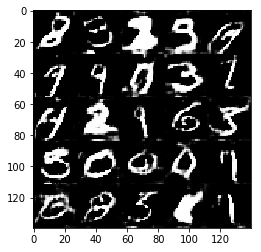

Epoch 2/2 ___  Discriminator Loss: 0.7392 ___ Generator Loss: 1.3182
Epoch 2/2 ___  Discriminator Loss: 1.1025 ___ Generator Loss: 0.8512
Epoch 2/2 ___  Discriminator Loss: 0.6409 ___ Generator Loss: 1.5261
Epoch 2/2 ___  Discriminator Loss: 0.6522 ___ Generator Loss: 1.9334
Epoch 2/2 ___  Discriminator Loss: 1.5407 ___ Generator Loss: 0.5349
Epoch 2/2 ___  Discriminator Loss: 1.0206 ___ Generator Loss: 1.3605
Epoch 2/2 ___  Discriminator Loss: 0.9847 ___ Generator Loss: 0.8864
Epoch 2/2 ___  Discriminator Loss: 0.5777 ___ Generator Loss: 2.5959
Epoch 2/2 ___  Discriminator Loss: 0.7005 ___ Generator Loss: 1.3734
Epoch 2/2 ___  Discriminator Loss: 0.5531 ___ Generator Loss: 2.0133


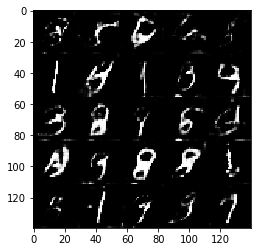

Epoch 2/2 ___  Discriminator Loss: 0.8952 ___ Generator Loss: 1.1395
Epoch 2/2 ___  Discriminator Loss: 1.1132 ___ Generator Loss: 0.7243
Epoch 2/2 ___  Discriminator Loss: 0.4950 ___ Generator Loss: 2.1833
Epoch 2/2 ___  Discriminator Loss: 0.5782 ___ Generator Loss: 1.9298
Epoch 2/2 ___  Discriminator Loss: 0.8071 ___ Generator Loss: 1.0838
Epoch 2/2 ___  Discriminator Loss: 0.6250 ___ Generator Loss: 1.6274
Epoch 2/2 ___  Discriminator Loss: 0.5849 ___ Generator Loss: 1.7196
Epoch 2/2 ___  Discriminator Loss: 0.6323 ___ Generator Loss: 1.5427
Epoch 2/2 ___  Discriminator Loss: 0.8230 ___ Generator Loss: 1.2175
Epoch 2/2 ___  Discriminator Loss: 0.6695 ___ Generator Loss: 1.6520


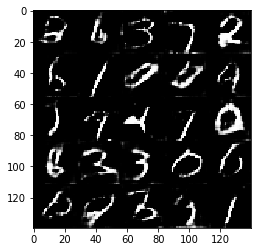

Epoch 2/2 ___  Discriminator Loss: 0.5396 ___ Generator Loss: 2.2197
Epoch 2/2 ___  Discriminator Loss: 0.6665 ___ Generator Loss: 1.6436
Epoch 2/2 ___  Discriminator Loss: 1.0346 ___ Generator Loss: 0.9253
Epoch 2/2 ___  Discriminator Loss: 0.8078 ___ Generator Loss: 1.0912
Epoch 2/2 ___  Discriminator Loss: 0.6486 ___ Generator Loss: 1.6713
Epoch 2/2 ___  Discriminator Loss: 0.7404 ___ Generator Loss: 1.3335
Epoch 2/2 ___  Discriminator Loss: 0.7650 ___ Generator Loss: 1.2058
Epoch 2/2 ___  Discriminator Loss: 0.6988 ___ Generator Loss: 1.5703
Epoch 2/2 ___  Discriminator Loss: 1.0090 ___ Generator Loss: 0.9796
Epoch 2/2 ___  Discriminator Loss: 0.6644 ___ Generator Loss: 1.4852


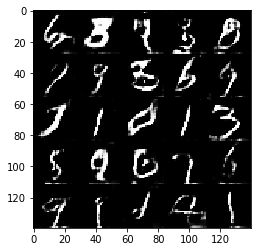

Epoch 2/2 ___  Discriminator Loss: 0.5224 ___ Generator Loss: 2.1060
Epoch 2/2 ___  Discriminator Loss: 0.5965 ___ Generator Loss: 2.0319
Epoch 2/2 ___  Discriminator Loss: 0.6188 ___ Generator Loss: 1.6475
Epoch 2/2 ___  Discriminator Loss: 0.6573 ___ Generator Loss: 1.6137
Epoch 2/2 ___  Discriminator Loss: 0.7665 ___ Generator Loss: 1.1241
Epoch 2/2 ___  Discriminator Loss: 0.8281 ___ Generator Loss: 1.2459
Epoch 2/2 ___  Discriminator Loss: 0.7541 ___ Generator Loss: 1.2789
Epoch 2/2 ___  Discriminator Loss: 0.8519 ___ Generator Loss: 2.8577
Epoch 2/2 ___  Discriminator Loss: 0.8084 ___ Generator Loss: 1.1603
Epoch 2/2 ___  Discriminator Loss: 0.7316 ___ Generator Loss: 1.3748


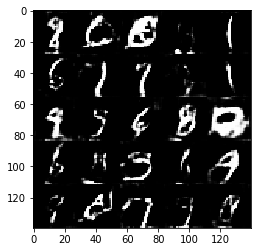

Epoch 2/2 ___  Discriminator Loss: 1.5302 ___ Generator Loss: 0.4665
Epoch 2/2 ___  Discriminator Loss: 0.6143 ___ Generator Loss: 1.7536
Epoch 2/2 ___  Discriminator Loss: 0.9223 ___ Generator Loss: 0.9593
Epoch 2/2 ___  Discriminator Loss: 1.0865 ___ Generator Loss: 0.8088
Epoch 2/2 ___  Discriminator Loss: 0.8965 ___ Generator Loss: 1.0530
Epoch 2/2 ___  Discriminator Loss: 0.7922 ___ Generator Loss: 1.0755
Epoch 2/2 ___  Discriminator Loss: 0.6367 ___ Generator Loss: 1.6122
Epoch 2/2 ___  Discriminator Loss: 0.6097 ___ Generator Loss: 1.5605
Epoch 2/2 ___  Discriminator Loss: 0.5668 ___ Generator Loss: 1.7050
Epoch 2/2 ___  Discriminator Loss: 0.8105 ___ Generator Loss: 1.2060


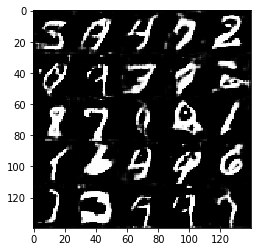

Epoch 2/2 ___  Discriminator Loss: 1.0207 ___ Generator Loss: 0.8683
Epoch 2/2 ___  Discriminator Loss: 1.0851 ___ Generator Loss: 0.8154
Epoch 2/2 ___  Discriminator Loss: 0.6074 ___ Generator Loss: 1.5324
Epoch 2/2 ___  Discriminator Loss: 0.7475 ___ Generator Loss: 1.1865
Epoch 2/2 ___  Discriminator Loss: 1.0143 ___ Generator Loss: 0.8897
Epoch 2/2 ___  Discriminator Loss: 0.7121 ___ Generator Loss: 1.3024
Epoch 2/2 ___  Discriminator Loss: 0.5691 ___ Generator Loss: 1.9204
Epoch 2/2 ___  Discriminator Loss: 1.4452 ___ Generator Loss: 0.5437
Epoch 2/2 ___  Discriminator Loss: 1.1823 ___ Generator Loss: 0.7182
Epoch 2/2 ___  Discriminator Loss: 0.6724 ___ Generator Loss: 1.4273


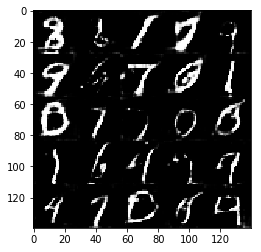

Epoch 2/2 ___  Discriminator Loss: 0.9496 ___ Generator Loss: 0.9489
Epoch 2/2 ___  Discriminator Loss: 1.1314 ___ Generator Loss: 0.8715
Epoch 2/2 ___  Discriminator Loss: 0.8375 ___ Generator Loss: 1.1671
Epoch 2/2 ___  Discriminator Loss: 0.6428 ___ Generator Loss: 1.5397
Epoch 2/2 ___  Discriminator Loss: 0.8384 ___ Generator Loss: 1.3015
Epoch 2/2 ___  Discriminator Loss: 0.4914 ___ Generator Loss: 2.2334
Epoch 2/2 ___  Discriminator Loss: 0.8451 ___ Generator Loss: 1.1198
Epoch 2/2 ___  Discriminator Loss: 1.0905 ___ Generator Loss: 0.8728
Epoch 2/2 ___  Discriminator Loss: 1.0505 ___ Generator Loss: 0.8389
Epoch 2/2 ___  Discriminator Loss: 0.8290 ___ Generator Loss: 1.0772


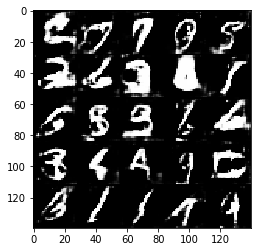

Epoch 2/2 ___  Discriminator Loss: 0.6593 ___ Generator Loss: 1.6326
Epoch 2/2 ___  Discriminator Loss: 1.3223 ___ Generator Loss: 0.5980
Epoch 2/2 ___  Discriminator Loss: 0.5302 ___ Generator Loss: 2.2336
Epoch 2/2 ___  Discriminator Loss: 0.5993 ___ Generator Loss: 1.7056
Epoch 2/2 ___  Discriminator Loss: 0.6470 ___ Generator Loss: 1.9125
Epoch 2/2 ___  Discriminator Loss: 0.6464 ___ Generator Loss: 1.5254
Epoch 2/2 ___  Discriminator Loss: 0.7551 ___ Generator Loss: 1.2998
Epoch 2/2 ___  Discriminator Loss: 0.6995 ___ Generator Loss: 1.3499
Epoch 2/2 ___  Discriminator Loss: 0.6415 ___ Generator Loss: 1.7175
Epoch 2/2 ___  Discriminator Loss: 0.5407 ___ Generator Loss: 1.7776


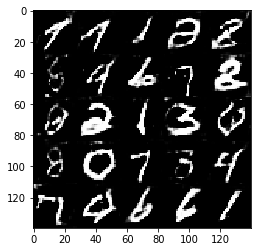

Epoch 2/2 ___  Discriminator Loss: 0.7333 ___ Generator Loss: 1.3225
Epoch 2/2 ___  Discriminator Loss: 0.6921 ___ Generator Loss: 1.5600
Epoch 2/2 ___  Discriminator Loss: 1.0711 ___ Generator Loss: 0.9215
Epoch 2/2 ___  Discriminator Loss: 0.8718 ___ Generator Loss: 1.1837
Epoch 2/2 ___  Discriminator Loss: 0.7583 ___ Generator Loss: 1.2104
Epoch 2/2 ___  Discriminator Loss: 0.5006 ___ Generator Loss: 2.6053
Epoch 2/2 ___  Discriminator Loss: 0.4826 ___ Generator Loss: 2.3499
Epoch 2/2 ___  Discriminator Loss: 0.6938 ___ Generator Loss: 1.4995
Epoch 2/2 ___  Discriminator Loss: 0.8449 ___ Generator Loss: 1.1020
Epoch 2/2 ___  Discriminator Loss: 0.6693 ___ Generator Loss: 1.4843


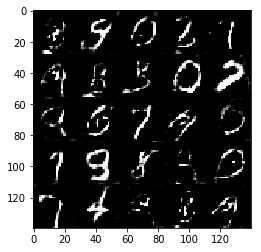

Epoch 2/2 ___  Discriminator Loss: 0.5565 ___ Generator Loss: 2.5426
Epoch 2/2 ___  Discriminator Loss: 0.5957 ___ Generator Loss: 1.6899
Epoch 2/2 ___  Discriminator Loss: 0.5447 ___ Generator Loss: 1.8616
Epoch 2/2 ___  Discriminator Loss: 0.7924 ___ Generator Loss: 1.2824
Epoch 2/2 ___  Discriminator Loss: 0.5923 ___ Generator Loss: 1.8811
Epoch 2/2 ___  Discriminator Loss: 0.5334 ___ Generator Loss: 2.1886
Epoch 2/2 ___  Discriminator Loss: 0.8132 ___ Generator Loss: 2.6420
Epoch 2/2 ___  Discriminator Loss: 0.5337 ___ Generator Loss: 1.9682
Epoch 2/2 ___  Discriminator Loss: 0.7097 ___ Generator Loss: 1.4267
Epoch 2/2 ___  Discriminator Loss: 0.8299 ___ Generator Loss: 1.3180


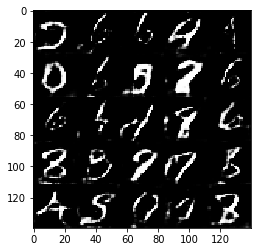

Epoch 2/2 ___  Discriminator Loss: 0.6962 ___ Generator Loss: 1.3611
Epoch 2/2 ___  Discriminator Loss: 0.6851 ___ Generator Loss: 1.4189
Epoch 2/2 ___  Discriminator Loss: 1.2639 ___ Generator Loss: 0.6853
Epoch 2/2 ___  Discriminator Loss: 0.7783 ___ Generator Loss: 1.1709
Epoch 2/2 ___  Discriminator Loss: 0.7352 ___ Generator Loss: 1.3859
Epoch 2/2 ___  Discriminator Loss: 0.8886 ___ Generator Loss: 1.1200
Epoch 2/2 ___  Discriminator Loss: 0.4858 ___ Generator Loss: 2.6452
Epoch 2/2 ___  Discriminator Loss: 0.6787 ___ Generator Loss: 1.4275
Epoch 2/2 ___  Discriminator Loss: 0.7942 ___ Generator Loss: 1.3274
Epoch 2/2 ___  Discriminator Loss: 1.7794 ___ Generator Loss: 0.4618


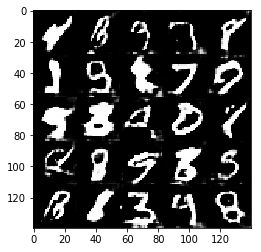

Epoch 2/2 ___  Discriminator Loss: 0.8592 ___ Generator Loss: 1.1434
Epoch 2/2 ___  Discriminator Loss: 0.6097 ___ Generator Loss: 1.5337
Epoch 2/2 ___  Discriminator Loss: 0.7825 ___ Generator Loss: 1.1844
Epoch 2/2 ___  Discriminator Loss: 0.6877 ___ Generator Loss: 1.4205
Epoch 2/2 ___  Discriminator Loss: 0.5883 ___ Generator Loss: 1.7549
Epoch 2/2 ___  Discriminator Loss: 0.7887 ___ Generator Loss: 1.2781
Epoch 2/2 ___  Discriminator Loss: 0.9729 ___ Generator Loss: 0.8388
Epoch 2/2 ___  Discriminator Loss: 0.6616 ___ Generator Loss: 1.6687
Epoch 2/2 ___  Discriminator Loss: 0.5609 ___ Generator Loss: 2.1568
Epoch 2/2 ___  Discriminator Loss: 0.5455 ___ Generator Loss: 1.9453


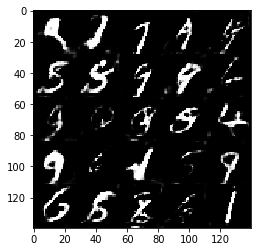

Epoch 2/2 ___  Discriminator Loss: 0.4744 ___ Generator Loss: 2.2461
Epoch 2/2 ___  Discriminator Loss: 1.0507 ___ Generator Loss: 0.9789
Epoch 2/2 ___  Discriminator Loss: 1.0464 ___ Generator Loss: 0.8394
Epoch 2/2 ___  Discriminator Loss: 0.4783 ___ Generator Loss: 2.1798
Epoch 2/2 ___  Discriminator Loss: 0.8515 ___ Generator Loss: 1.0615
Epoch 2/2 ___  Discriminator Loss: 0.6852 ___ Generator Loss: 1.6553
Epoch 2/2 ___  Discriminator Loss: 1.0468 ___ Generator Loss: 0.7998
Epoch 2/2 ___  Discriminator Loss: 0.6693 ___ Generator Loss: 1.8031
Epoch 2/2 ___  Discriminator Loss: 1.0539 ___ Generator Loss: 0.8666
Epoch 2/2 ___  Discriminator Loss: 1.4276 ___ Generator Loss: 0.5358


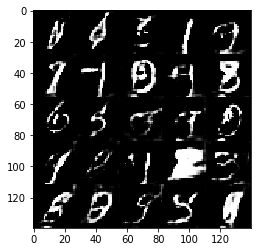

Epoch 2/2 ___  Discriminator Loss: 0.5276 ___ Generator Loss: 1.9502
Epoch 2/2 ___  Discriminator Loss: 0.5189 ___ Generator Loss: 2.2742
Epoch 2/2 ___  Discriminator Loss: 1.0649 ___ Generator Loss: 0.7130
Epoch 2/2 ___  Discriminator Loss: 0.6828 ___ Generator Loss: 1.4511
Epoch 2/2 ___  Discriminator Loss: 0.9418 ___ Generator Loss: 0.9001
Epoch 2/2 ___  Discriminator Loss: 0.6206 ___ Generator Loss: 1.6623
Epoch 2/2 ___  Discriminator Loss: 0.7271 ___ Generator Loss: 1.3058
Epoch 2/2 ___  Discriminator Loss: 0.6524 ___ Generator Loss: 1.4747
Epoch 2/2 ___  Discriminator Loss: 1.1348 ___ Generator Loss: 0.6796
Epoch 2/2 ___  Discriminator Loss: 0.7509 ___ Generator Loss: 1.1921


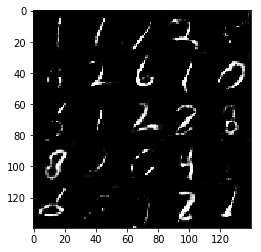

Epoch 2/2 ___  Discriminator Loss: 0.4437 ___ Generator Loss: 2.5576
Epoch 2/2 ___  Discriminator Loss: 0.8321 ___ Generator Loss: 2.6053
Epoch 2/2 ___  Discriminator Loss: 1.0626 ___ Generator Loss: 0.8218
Epoch 2/2 ___  Discriminator Loss: 0.5257 ___ Generator Loss: 2.2460
Epoch 2/2 ___  Discriminator Loss: 0.5723 ___ Generator Loss: 1.9567
Epoch 2/2 ___  Discriminator Loss: 0.6341 ___ Generator Loss: 1.6671
Epoch 2/2 ___  Discriminator Loss: 0.7983 ___ Generator Loss: 2.4400
Epoch 2/2 ___  Discriminator Loss: 0.7240 ___ Generator Loss: 1.3412
Epoch 2/2 ___  Discriminator Loss: 0.4732 ___ Generator Loss: 2.6296
Epoch 2/2 ___  Discriminator Loss: 0.5250 ___ Generator Loss: 2.0486


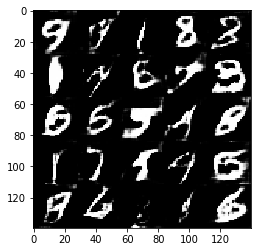

Epoch 2/2 ___  Discriminator Loss: 0.6385 ___ Generator Loss: 1.3786
Epoch 2/2 ___  Discriminator Loss: 0.7509 ___ Generator Loss: 1.1784
Epoch 2/2 ___  Discriminator Loss: 1.1735 ___ Generator Loss: 0.6442
Epoch 2/2 ___  Discriminator Loss: 0.5767 ___ Generator Loss: 1.7076
Epoch 2/2 ___  Discriminator Loss: 0.5638 ___ Generator Loss: 2.0038
Epoch 2/2 ___  Discriminator Loss: 1.0833 ___ Generator Loss: 0.7533
Epoch 2/2 ___  Discriminator Loss: 0.6696 ___ Generator Loss: 1.3706
Epoch 2/2 ___  Discriminator Loss: 0.6280 ___ Generator Loss: 1.8108
Epoch 2/2 ___  Discriminator Loss: 1.2549 ___ Generator Loss: 0.6312
Epoch 2/2 ___  Discriminator Loss: 0.8145 ___ Generator Loss: 1.1749


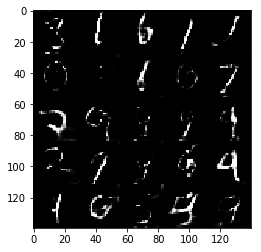

Epoch 2/2 ___  Discriminator Loss: 1.0464 ___ Generator Loss: 3.7011
Epoch 2/2 ___  Discriminator Loss: 1.0739 ___ Generator Loss: 0.9352
Epoch 2/2 ___  Discriminator Loss: 0.6596 ___ Generator Loss: 1.7270
Epoch 2/2 ___  Discriminator Loss: 0.8366 ___ Generator Loss: 1.0642
Epoch 2/2 ___  Discriminator Loss: 0.5926 ___ Generator Loss: 1.6654
Epoch 2/2 ___  Discriminator Loss: 1.1222 ___ Generator Loss: 0.7733
Epoch 2/2 ___  Discriminator Loss: 0.5239 ___ Generator Loss: 2.0813
Epoch 2/2 ___  Discriminator Loss: 0.9021 ___ Generator Loss: 1.0219
Epoch 2/2 ___  Discriminator Loss: 1.0244 ___ Generator Loss: 0.8559
Epoch 2/2 ___  Discriminator Loss: 0.8602 ___ Generator Loss: 1.0835


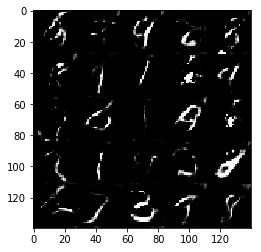

Epoch 2/2 ___  Discriminator Loss: 0.9798 ___ Generator Loss: 0.8379
Epoch 2/2 ___  Discriminator Loss: 0.6406 ___ Generator Loss: 1.4593
Epoch 2/2 ___  Discriminator Loss: 2.0496 ___ Generator Loss: 0.2571
Epoch 2/2 ___  Discriminator Loss: 0.8422 ___ Generator Loss: 1.1939
Epoch 2/2 ___  Discriminator Loss: 1.1013 ___ Generator Loss: 0.7921
Epoch 2/2 ___  Discriminator Loss: 0.8455 ___ Generator Loss: 1.0498
Epoch 2/2 ___  Discriminator Loss: 0.6809 ___ Generator Loss: 1.3498
Epoch 2/2 ___  Discriminator Loss: 0.6807 ___ Generator Loss: 1.4893
Epoch 2/2 ___  Discriminator Loss: 0.8290 ___ Generator Loss: 1.2222
Epoch 2/2 ___  Discriminator Loss: 0.7752 ___ Generator Loss: 1.5229


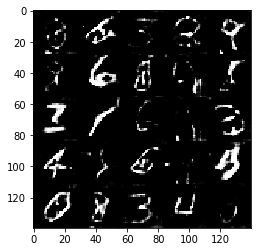

Epoch 2/2 ___  Discriminator Loss: 0.7284 ___ Generator Loss: 1.3357
Epoch 2/2 ___  Discriminator Loss: 0.8330 ___ Generator Loss: 1.0829
Epoch 2/2 ___  Discriminator Loss: 0.7881 ___ Generator Loss: 1.1423
Epoch 2/2 ___  Discriminator Loss: 0.9257 ___ Generator Loss: 1.1141
Epoch 2/2 ___  Discriminator Loss: 0.7818 ___ Generator Loss: 3.9133
Epoch 2/2 ___  Discriminator Loss: 0.8263 ___ Generator Loss: 1.2399
Epoch 2/2 ___  Discriminator Loss: 0.6161 ___ Generator Loss: 1.7146
Epoch 2/2 ___  Discriminator Loss: 0.8444 ___ Generator Loss: 1.1504
Epoch 2/2 ___  Discriminator Loss: 0.6723 ___ Generator Loss: 1.5761
Epoch 2/2 ___  Discriminator Loss: 0.7214 ___ Generator Loss: 1.3535


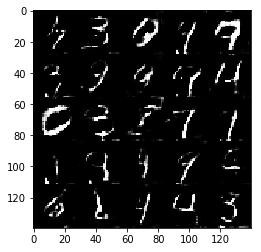

Epoch 2/2 ___  Discriminator Loss: 1.6280 ___ Generator Loss: 0.4518
Epoch 2/2 ___  Discriminator Loss: 1.2501 ___ Generator Loss: 0.9025
Epoch 2/2 ___  Discriminator Loss: 0.6491 ___ Generator Loss: 1.7890
Epoch 2/2 ___  Discriminator Loss: 0.6609 ___ Generator Loss: 1.4628
Epoch 2/2 ___  Discriminator Loss: 0.6747 ___ Generator Loss: 1.7399
Epoch 2/2 ___  Discriminator Loss: 0.8247 ___ Generator Loss: 1.0330
Epoch 2/2 ___  Discriminator Loss: 0.6121 ___ Generator Loss: 2.2479
Epoch 2/2 ___  Discriminator Loss: 0.6522 ___ Generator Loss: 1.5047
Epoch 2/2 ___  Discriminator Loss: 1.0164 ___ Generator Loss: 0.9718
Epoch 2/2 ___  Discriminator Loss: 1.1054 ___ Generator Loss: 0.7576


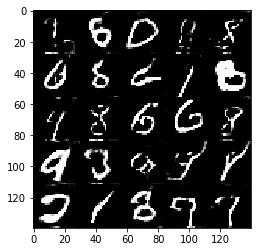

In [88]:
batch_size = 16
z_dim = 128 
learning_rate = 0.0002 
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 ___  Discriminator Loss: 1.8460 ___ Generator Loss: 0.4590
Epoch 1/1 ___  Discriminator Loss: 0.6746 ___ Generator Loss: 2.0041
Epoch 1/1 ___  Discriminator Loss: 1.0037 ___ Generator Loss: 2.6666
Epoch 1/1 ___  Discriminator Loss: 0.6782 ___ Generator Loss: 2.1569
Epoch 1/1 ___  Discriminator Loss: 1.0018 ___ Generator Loss: 1.4195
Epoch 1/1 ___  Discriminator Loss: 1.2017 ___ Generator Loss: 0.8457
Epoch 1/1 ___  Discriminator Loss: 0.6880 ___ Generator Loss: 2.3041
Epoch 1/1 ___  Discriminator Loss: 0.4857 ___ Generator Loss: 2.8088
Epoch 1/1 ___  Discriminator Loss: 0.5490 ___ Generator Loss: 2.5631
Epoch 1/1 ___  Discriminator Loss: 0.5782 ___ Generator Loss: 2.4339


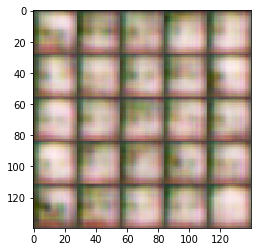

Epoch 1/1 ___  Discriminator Loss: 0.5754 ___ Generator Loss: 3.0986
Epoch 1/1 ___  Discriminator Loss: 0.6393 ___ Generator Loss: 2.4090
Epoch 1/1 ___  Discriminator Loss: 1.1990 ___ Generator Loss: 4.9224
Epoch 1/1 ___  Discriminator Loss: 0.8635 ___ Generator Loss: 1.4803
Epoch 1/1 ___  Discriminator Loss: 0.5346 ___ Generator Loss: 2.5229
Epoch 1/1 ___  Discriminator Loss: 2.4752 ___ Generator Loss: 0.1812
Epoch 1/1 ___  Discriminator Loss: 0.8676 ___ Generator Loss: 2.6686
Epoch 1/1 ___  Discriminator Loss: 0.8368 ___ Generator Loss: 1.6427
Epoch 1/1 ___  Discriminator Loss: 0.6257 ___ Generator Loss: 2.1785
Epoch 1/1 ___  Discriminator Loss: 0.7769 ___ Generator Loss: 1.6409


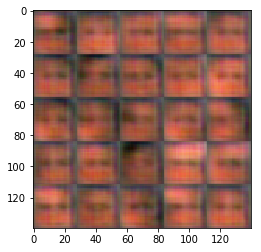

Epoch 1/1 ___  Discriminator Loss: 1.0600 ___ Generator Loss: 1.4315
Epoch 1/1 ___  Discriminator Loss: 1.2017 ___ Generator Loss: 0.8100
Epoch 1/1 ___  Discriminator Loss: 1.1072 ___ Generator Loss: 2.9920
Epoch 1/1 ___  Discriminator Loss: 1.1157 ___ Generator Loss: 2.7165
Epoch 1/1 ___  Discriminator Loss: 1.0353 ___ Generator Loss: 0.9966
Epoch 1/1 ___  Discriminator Loss: 0.7210 ___ Generator Loss: 2.9513
Epoch 1/1 ___  Discriminator Loss: 0.9962 ___ Generator Loss: 1.0990
Epoch 1/1 ___  Discriminator Loss: 1.7712 ___ Generator Loss: 6.4436
Epoch 1/1 ___  Discriminator Loss: 0.9006 ___ Generator Loss: 1.3312
Epoch 1/1 ___  Discriminator Loss: 0.9986 ___ Generator Loss: 1.2579


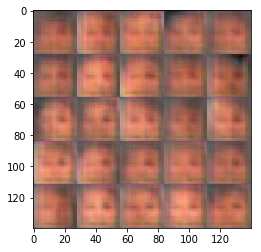

Epoch 1/1 ___  Discriminator Loss: 1.3507 ___ Generator Loss: 0.6357
Epoch 1/1 ___  Discriminator Loss: 1.2734 ___ Generator Loss: 0.7581
Epoch 1/1 ___  Discriminator Loss: 1.3687 ___ Generator Loss: 0.9410
Epoch 1/1 ___  Discriminator Loss: 1.4080 ___ Generator Loss: 2.9424
Epoch 1/1 ___  Discriminator Loss: 0.7380 ___ Generator Loss: 2.0417
Epoch 1/1 ___  Discriminator Loss: 0.8067 ___ Generator Loss: 1.8391
Epoch 1/1 ___  Discriminator Loss: 1.0631 ___ Generator Loss: 1.1455
Epoch 1/1 ___  Discriminator Loss: 1.1794 ___ Generator Loss: 0.9162
Epoch 1/1 ___  Discriminator Loss: 1.3181 ___ Generator Loss: 0.6624
Epoch 1/1 ___  Discriminator Loss: 1.1037 ___ Generator Loss: 1.2899


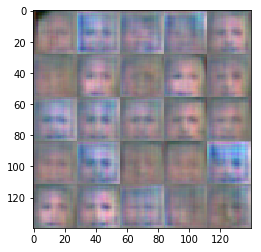

Epoch 1/1 ___  Discriminator Loss: 0.4859 ___ Generator Loss: 3.1403
Epoch 1/1 ___  Discriminator Loss: 0.8269 ___ Generator Loss: 2.1203
Epoch 1/1 ___  Discriminator Loss: 1.5807 ___ Generator Loss: 0.4288
Epoch 1/1 ___  Discriminator Loss: 1.5687 ___ Generator Loss: 2.9351
Epoch 1/1 ___  Discriminator Loss: 1.4889 ___ Generator Loss: 0.5515
Epoch 1/1 ___  Discriminator Loss: 0.8764 ___ Generator Loss: 1.6197
Epoch 1/1 ___  Discriminator Loss: 0.5760 ___ Generator Loss: 2.2908
Epoch 1/1 ___  Discriminator Loss: 1.2456 ___ Generator Loss: 0.7994
Epoch 1/1 ___  Discriminator Loss: 1.1491 ___ Generator Loss: 1.0813
Epoch 1/1 ___  Discriminator Loss: 0.9876 ___ Generator Loss: 1.2348


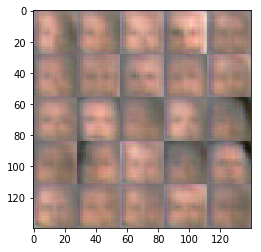

Epoch 1/1 ___  Discriminator Loss: 1.0892 ___ Generator Loss: 0.9508
Epoch 1/1 ___  Discriminator Loss: 0.6396 ___ Generator Loss: 1.9373
Epoch 1/1 ___  Discriminator Loss: 0.8901 ___ Generator Loss: 1.9712
Epoch 1/1 ___  Discriminator Loss: 0.7296 ___ Generator Loss: 1.5962
Epoch 1/1 ___  Discriminator Loss: 1.0283 ___ Generator Loss: 0.9724
Epoch 1/1 ___  Discriminator Loss: 1.7326 ___ Generator Loss: 0.4183
Epoch 1/1 ___  Discriminator Loss: 1.0224 ___ Generator Loss: 1.0930
Epoch 1/1 ___  Discriminator Loss: 1.2312 ___ Generator Loss: 0.6928
Epoch 1/1 ___  Discriminator Loss: 0.9862 ___ Generator Loss: 1.0521
Epoch 1/1 ___  Discriminator Loss: 1.0259 ___ Generator Loss: 1.9112


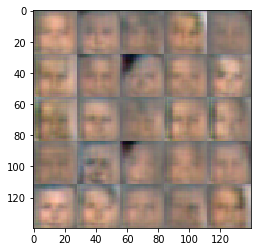

Epoch 1/1 ___  Discriminator Loss: 0.8160 ___ Generator Loss: 1.4728
Epoch 1/1 ___  Discriminator Loss: 0.7857 ___ Generator Loss: 1.5148
Epoch 1/1 ___  Discriminator Loss: 1.0241 ___ Generator Loss: 1.0514
Epoch 1/1 ___  Discriminator Loss: 1.0514 ___ Generator Loss: 1.0806
Epoch 1/1 ___  Discriminator Loss: 1.1291 ___ Generator Loss: 0.7983
Epoch 1/1 ___  Discriminator Loss: 0.7102 ___ Generator Loss: 2.4975
Epoch 1/1 ___  Discriminator Loss: 1.2057 ___ Generator Loss: 2.0969
Epoch 1/1 ___  Discriminator Loss: 1.2983 ___ Generator Loss: 0.5753
Epoch 1/1 ___  Discriminator Loss: 1.0601 ___ Generator Loss: 0.9046
Epoch 1/1 ___  Discriminator Loss: 1.1330 ___ Generator Loss: 1.6442


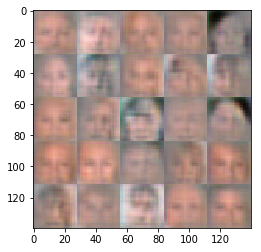

Epoch 1/1 ___  Discriminator Loss: 1.0626 ___ Generator Loss: 0.8978
Epoch 1/1 ___  Discriminator Loss: 1.7846 ___ Generator Loss: 2.9055
Epoch 1/1 ___  Discriminator Loss: 1.4364 ___ Generator Loss: 0.6069
Epoch 1/1 ___  Discriminator Loss: 0.7885 ___ Generator Loss: 2.9396
Epoch 1/1 ___  Discriminator Loss: 1.1544 ___ Generator Loss: 0.8468
Epoch 1/1 ___  Discriminator Loss: 1.2763 ___ Generator Loss: 0.6860
Epoch 1/1 ___  Discriminator Loss: 1.3276 ___ Generator Loss: 0.6291
Epoch 1/1 ___  Discriminator Loss: 0.9714 ___ Generator Loss: 2.4828
Epoch 1/1 ___  Discriminator Loss: 1.3277 ___ Generator Loss: 2.7646
Epoch 1/1 ___  Discriminator Loss: 1.1138 ___ Generator Loss: 1.0311


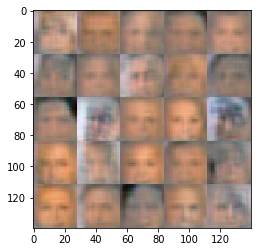

Epoch 1/1 ___  Discriminator Loss: 1.1455 ___ Generator Loss: 0.8125
Epoch 1/1 ___  Discriminator Loss: 1.1208 ___ Generator Loss: 0.8699
Epoch 1/1 ___  Discriminator Loss: 0.9322 ___ Generator Loss: 1.6763
Epoch 1/1 ___  Discriminator Loss: 1.0201 ___ Generator Loss: 1.3174
Epoch 1/1 ___  Discriminator Loss: 0.9608 ___ Generator Loss: 1.3762
Epoch 1/1 ___  Discriminator Loss: 0.9754 ___ Generator Loss: 1.1832
Epoch 1/1 ___  Discriminator Loss: 1.1822 ___ Generator Loss: 0.7892
Epoch 1/1 ___  Discriminator Loss: 1.1908 ___ Generator Loss: 0.8882
Epoch 1/1 ___  Discriminator Loss: 1.4910 ___ Generator Loss: 3.6936
Epoch 1/1 ___  Discriminator Loss: 1.4004 ___ Generator Loss: 0.6216


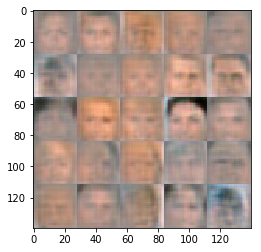

Epoch 1/1 ___  Discriminator Loss: 1.2057 ___ Generator Loss: 0.7422
Epoch 1/1 ___  Discriminator Loss: 1.1911 ___ Generator Loss: 0.9150
Epoch 1/1 ___  Discriminator Loss: 1.0906 ___ Generator Loss: 1.0518
Epoch 1/1 ___  Discriminator Loss: 1.0649 ___ Generator Loss: 0.8812
Epoch 1/1 ___  Discriminator Loss: 1.3634 ___ Generator Loss: 0.5985
Epoch 1/1 ___  Discriminator Loss: 1.1703 ___ Generator Loss: 0.8106
Epoch 1/1 ___  Discriminator Loss: 1.4856 ___ Generator Loss: 1.9546
Epoch 1/1 ___  Discriminator Loss: 1.1320 ___ Generator Loss: 1.1483
Epoch 1/1 ___  Discriminator Loss: 0.9696 ___ Generator Loss: 1.0945
Epoch 1/1 ___  Discriminator Loss: 1.1271 ___ Generator Loss: 0.8059


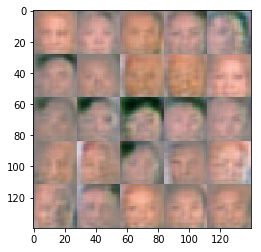

Epoch 1/1 ___  Discriminator Loss: 1.4261 ___ Generator Loss: 0.6768
Epoch 1/1 ___  Discriminator Loss: 1.0312 ___ Generator Loss: 1.4840
Epoch 1/1 ___  Discriminator Loss: 1.1057 ___ Generator Loss: 0.8319
Epoch 1/1 ___  Discriminator Loss: 1.1476 ___ Generator Loss: 1.0792
Epoch 1/1 ___  Discriminator Loss: 0.9928 ___ Generator Loss: 0.9869
Epoch 1/1 ___  Discriminator Loss: 1.7715 ___ Generator Loss: 0.3508
Epoch 1/1 ___  Discriminator Loss: 1.5401 ___ Generator Loss: 0.4988
Epoch 1/1 ___  Discriminator Loss: 1.2147 ___ Generator Loss: 0.6256
Epoch 1/1 ___  Discriminator Loss: 1.0123 ___ Generator Loss: 1.3658
Epoch 1/1 ___  Discriminator Loss: 1.2487 ___ Generator Loss: 2.2979


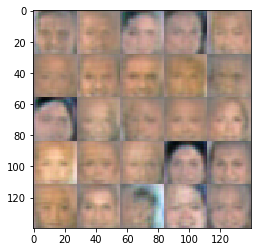

Epoch 1/1 ___  Discriminator Loss: 0.8161 ___ Generator Loss: 1.5703
Epoch 1/1 ___  Discriminator Loss: 0.9635 ___ Generator Loss: 1.2116
Epoch 1/1 ___  Discriminator Loss: 0.8531 ___ Generator Loss: 1.5308
Epoch 1/1 ___  Discriminator Loss: 1.2874 ___ Generator Loss: 1.0738
Epoch 1/1 ___  Discriminator Loss: 1.0276 ___ Generator Loss: 0.9302
Epoch 1/1 ___  Discriminator Loss: 0.9697 ___ Generator Loss: 1.3786
Epoch 1/1 ___  Discriminator Loss: 1.1952 ___ Generator Loss: 0.8787
Epoch 1/1 ___  Discriminator Loss: 1.3913 ___ Generator Loss: 0.5047
Epoch 1/1 ___  Discriminator Loss: 1.3450 ___ Generator Loss: 0.6228
Epoch 1/1 ___  Discriminator Loss: 1.3069 ___ Generator Loss: 0.5716


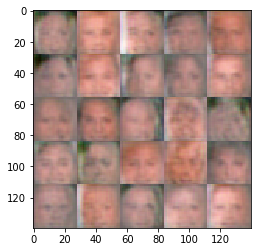

Epoch 1/1 ___  Discriminator Loss: 0.9769 ___ Generator Loss: 1.3270
Epoch 1/1 ___  Discriminator Loss: 1.9915 ___ Generator Loss: 0.2495
Epoch 1/1 ___  Discriminator Loss: 0.7730 ___ Generator Loss: 1.4921
Epoch 1/1 ___  Discriminator Loss: 1.0626 ___ Generator Loss: 1.6788
Epoch 1/1 ___  Discriminator Loss: 1.0770 ___ Generator Loss: 1.0562
Epoch 1/1 ___  Discriminator Loss: 1.2094 ___ Generator Loss: 1.0250
Epoch 1/1 ___  Discriminator Loss: 0.8877 ___ Generator Loss: 1.1313
Epoch 1/1 ___  Discriminator Loss: 1.2751 ___ Generator Loss: 0.6148
Epoch 1/1 ___  Discriminator Loss: 0.5580 ___ Generator Loss: 2.2170
Epoch 1/1 ___  Discriminator Loss: 1.2021 ___ Generator Loss: 1.0412


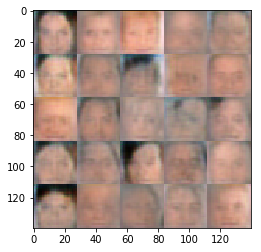

Epoch 1/1 ___  Discriminator Loss: 1.6076 ___ Generator Loss: 4.7528
Epoch 1/1 ___  Discriminator Loss: 1.3781 ___ Generator Loss: 0.5600
Epoch 1/1 ___  Discriminator Loss: 0.7321 ___ Generator Loss: 1.6672
Epoch 1/1 ___  Discriminator Loss: 1.0550 ___ Generator Loss: 1.2980
Epoch 1/1 ___  Discriminator Loss: 1.1952 ___ Generator Loss: 0.8967
Epoch 1/1 ___  Discriminator Loss: 1.2579 ___ Generator Loss: 0.6010
Epoch 1/1 ___  Discriminator Loss: 1.2012 ___ Generator Loss: 0.8252
Epoch 1/1 ___  Discriminator Loss: 1.1240 ___ Generator Loss: 0.7778
Epoch 1/1 ___  Discriminator Loss: 1.5477 ___ Generator Loss: 0.4540
Epoch 1/1 ___  Discriminator Loss: 1.2652 ___ Generator Loss: 0.7930


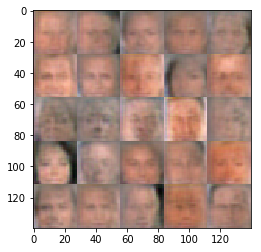

Epoch 1/1 ___  Discriminator Loss: 1.1018 ___ Generator Loss: 1.1291
Epoch 1/1 ___  Discriminator Loss: 1.1780 ___ Generator Loss: 0.8418
Epoch 1/1 ___  Discriminator Loss: 0.8226 ___ Generator Loss: 1.2730
Epoch 1/1 ___  Discriminator Loss: 1.2795 ___ Generator Loss: 0.6055
Epoch 1/1 ___  Discriminator Loss: 0.8240 ___ Generator Loss: 1.3922
Epoch 1/1 ___  Discriminator Loss: 1.1176 ___ Generator Loss: 1.5804
Epoch 1/1 ___  Discriminator Loss: 0.9101 ___ Generator Loss: 1.0160
Epoch 1/1 ___  Discriminator Loss: 0.7565 ___ Generator Loss: 1.5365
Epoch 1/1 ___  Discriminator Loss: 0.9168 ___ Generator Loss: 1.2355
Epoch 1/1 ___  Discriminator Loss: 0.8637 ___ Generator Loss: 1.0591


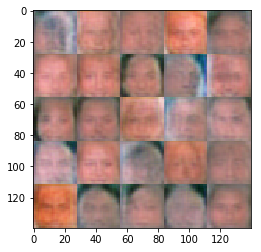

Epoch 1/1 ___  Discriminator Loss: 0.9628 ___ Generator Loss: 1.0268
Epoch 1/1 ___  Discriminator Loss: 1.1562 ___ Generator Loss: 0.8165
Epoch 1/1 ___  Discriminator Loss: 1.0404 ___ Generator Loss: 0.8610
Epoch 1/1 ___  Discriminator Loss: 0.8885 ___ Generator Loss: 1.7105
Epoch 1/1 ___  Discriminator Loss: 1.2036 ___ Generator Loss: 0.8416
Epoch 1/1 ___  Discriminator Loss: 1.0130 ___ Generator Loss: 1.4320
Epoch 1/1 ___  Discriminator Loss: 1.1531 ___ Generator Loss: 0.8284
Epoch 1/1 ___  Discriminator Loss: 1.3655 ___ Generator Loss: 0.5194
Epoch 1/1 ___  Discriminator Loss: 1.2235 ___ Generator Loss: 0.7300
Epoch 1/1 ___  Discriminator Loss: 1.0576 ___ Generator Loss: 0.9401


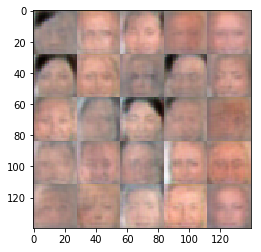

Epoch 1/1 ___  Discriminator Loss: 1.3213 ___ Generator Loss: 0.6948
Epoch 1/1 ___  Discriminator Loss: 1.0367 ___ Generator Loss: 0.9901
Epoch 1/1 ___  Discriminator Loss: 1.1028 ___ Generator Loss: 0.9842
Epoch 1/1 ___  Discriminator Loss: 1.0292 ___ Generator Loss: 0.9770
Epoch 1/1 ___  Discriminator Loss: 0.7352 ___ Generator Loss: 2.2288
Epoch 1/1 ___  Discriminator Loss: 0.4705 ___ Generator Loss: 3.8026
Epoch 1/1 ___  Discriminator Loss: 0.9352 ___ Generator Loss: 1.1075
Epoch 1/1 ___  Discriminator Loss: 1.6814 ___ Generator Loss: 0.3431
Epoch 1/1 ___  Discriminator Loss: 0.9666 ___ Generator Loss: 0.9074
Epoch 1/1 ___  Discriminator Loss: 0.9041 ___ Generator Loss: 1.7238


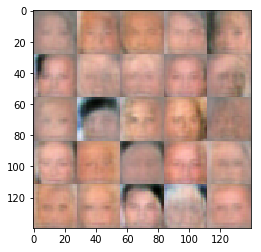

Epoch 1/1 ___  Discriminator Loss: 0.9050 ___ Generator Loss: 1.0496
Epoch 1/1 ___  Discriminator Loss: 1.1015 ___ Generator Loss: 0.7476
Epoch 1/1 ___  Discriminator Loss: 1.1155 ___ Generator Loss: 0.8469
Epoch 1/1 ___  Discriminator Loss: 0.9292 ___ Generator Loss: 1.0822
Epoch 1/1 ___  Discriminator Loss: 1.0209 ___ Generator Loss: 1.2574
Epoch 1/1 ___  Discriminator Loss: 0.8714 ___ Generator Loss: 1.1988
Epoch 1/1 ___  Discriminator Loss: 0.8073 ___ Generator Loss: 1.2408
Epoch 1/1 ___  Discriminator Loss: 0.8245 ___ Generator Loss: 1.3851
Epoch 1/1 ___  Discriminator Loss: 1.4386 ___ Generator Loss: 0.4721
Epoch 1/1 ___  Discriminator Loss: 0.8964 ___ Generator Loss: 1.1666


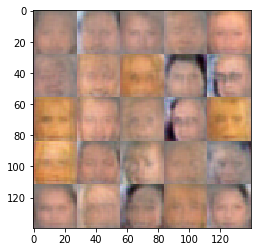

Epoch 1/1 ___  Discriminator Loss: 0.9983 ___ Generator Loss: 0.9571
Epoch 1/1 ___  Discriminator Loss: 1.2408 ___ Generator Loss: 0.6604
Epoch 1/1 ___  Discriminator Loss: 1.0774 ___ Generator Loss: 0.9102
Epoch 1/1 ___  Discriminator Loss: 1.0711 ___ Generator Loss: 0.8215
Epoch 1/1 ___  Discriminator Loss: 0.9243 ___ Generator Loss: 1.1798
Epoch 1/1 ___  Discriminator Loss: 1.1184 ___ Generator Loss: 1.1383
Epoch 1/1 ___  Discriminator Loss: 1.1575 ___ Generator Loss: 0.8041
Epoch 1/1 ___  Discriminator Loss: 0.9413 ___ Generator Loss: 1.2981
Epoch 1/1 ___  Discriminator Loss: 1.1211 ___ Generator Loss: 1.1405
Epoch 1/1 ___  Discriminator Loss: 1.0981 ___ Generator Loss: 0.7290


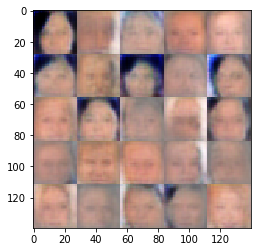

Epoch 1/1 ___  Discriminator Loss: 1.1568 ___ Generator Loss: 0.6875
Epoch 1/1 ___  Discriminator Loss: 1.2178 ___ Generator Loss: 0.7246
Epoch 1/1 ___  Discriminator Loss: 1.0887 ___ Generator Loss: 1.2532
Epoch 1/1 ___  Discriminator Loss: 0.7541 ___ Generator Loss: 2.2717
Epoch 1/1 ___  Discriminator Loss: 1.2148 ___ Generator Loss: 0.6825
Epoch 1/1 ___  Discriminator Loss: 1.7785 ___ Generator Loss: 0.3325
Epoch 1/1 ___  Discriminator Loss: 0.9649 ___ Generator Loss: 1.0744
Epoch 1/1 ___  Discriminator Loss: 0.7478 ___ Generator Loss: 1.4026
Epoch 1/1 ___  Discriminator Loss: 0.9691 ___ Generator Loss: 0.9595
Epoch 1/1 ___  Discriminator Loss: 1.0444 ___ Generator Loss: 0.8037


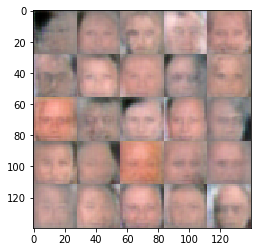

Epoch 1/1 ___  Discriminator Loss: 1.1235 ___ Generator Loss: 0.7437
Epoch 1/1 ___  Discriminator Loss: 0.8752 ___ Generator Loss: 1.6445
Epoch 1/1 ___  Discriminator Loss: 1.1437 ___ Generator Loss: 1.4794
Epoch 1/1 ___  Discriminator Loss: 0.6980 ___ Generator Loss: 1.5075
Epoch 1/1 ___  Discriminator Loss: 0.8658 ___ Generator Loss: 1.3887
Epoch 1/1 ___  Discriminator Loss: 1.0377 ___ Generator Loss: 1.1246
Epoch 1/1 ___  Discriminator Loss: 1.2973 ___ Generator Loss: 0.6128
Epoch 1/1 ___  Discriminator Loss: 0.7770 ___ Generator Loss: 2.0544
Epoch 1/1 ___  Discriminator Loss: 1.1189 ___ Generator Loss: 1.3084
Epoch 1/1 ___  Discriminator Loss: 1.0854 ___ Generator Loss: 0.7953


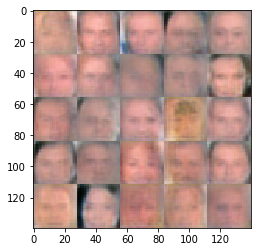

Epoch 1/1 ___  Discriminator Loss: 1.1173 ___ Generator Loss: 0.7727
Epoch 1/1 ___  Discriminator Loss: 0.6344 ___ Generator Loss: 2.3758
Epoch 1/1 ___  Discriminator Loss: 0.7800 ___ Generator Loss: 1.2957
Epoch 1/1 ___  Discriminator Loss: 1.1750 ___ Generator Loss: 0.8937
Epoch 1/1 ___  Discriminator Loss: 0.8977 ___ Generator Loss: 1.2131
Epoch 1/1 ___  Discriminator Loss: 1.0030 ___ Generator Loss: 1.1027
Epoch 1/1 ___  Discriminator Loss: 1.2610 ___ Generator Loss: 0.6725
Epoch 1/1 ___  Discriminator Loss: 1.0133 ___ Generator Loss: 1.0151
Epoch 1/1 ___  Discriminator Loss: 1.2704 ___ Generator Loss: 1.7360
Epoch 1/1 ___  Discriminator Loss: 1.0421 ___ Generator Loss: 0.9076


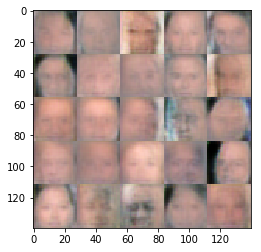

Epoch 1/1 ___  Discriminator Loss: 1.1511 ___ Generator Loss: 0.7538
Epoch 1/1 ___  Discriminator Loss: 1.1317 ___ Generator Loss: 0.8407
Epoch 1/1 ___  Discriminator Loss: 0.6466 ___ Generator Loss: 3.1271
Epoch 1/1 ___  Discriminator Loss: 1.2539 ___ Generator Loss: 0.7473
Epoch 1/1 ___  Discriminator Loss: 0.7511 ___ Generator Loss: 1.7108
Epoch 1/1 ___  Discriminator Loss: 1.1946 ___ Generator Loss: 1.3841
Epoch 1/1 ___  Discriminator Loss: 1.2059 ___ Generator Loss: 0.6815
Epoch 1/1 ___  Discriminator Loss: 0.8919 ___ Generator Loss: 1.7727
Epoch 1/1 ___  Discriminator Loss: 1.1420 ___ Generator Loss: 0.9521
Epoch 1/1 ___  Discriminator Loss: 0.8475 ___ Generator Loss: 1.7983


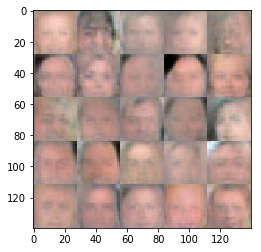

Epoch 1/1 ___  Discriminator Loss: 1.3894 ___ Generator Loss: 0.6414
Epoch 1/1 ___  Discriminator Loss: 1.2752 ___ Generator Loss: 2.4514
Epoch 1/1 ___  Discriminator Loss: 0.9748 ___ Generator Loss: 1.1391
Epoch 1/1 ___  Discriminator Loss: 0.6276 ___ Generator Loss: 1.9151
Epoch 1/1 ___  Discriminator Loss: 0.8416 ___ Generator Loss: 2.3845
Epoch 1/1 ___  Discriminator Loss: 1.3903 ___ Generator Loss: 0.5044
Epoch 1/1 ___  Discriminator Loss: 1.1965 ___ Generator Loss: 0.6672
Epoch 1/1 ___  Discriminator Loss: 1.0458 ___ Generator Loss: 1.0078
Epoch 1/1 ___  Discriminator Loss: 0.8662 ___ Generator Loss: 1.1825
Epoch 1/1 ___  Discriminator Loss: 1.3815 ___ Generator Loss: 0.5463


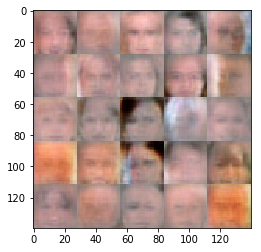

Epoch 1/1 ___  Discriminator Loss: 1.2158 ___ Generator Loss: 1.7795
Epoch 1/1 ___  Discriminator Loss: 1.2126 ___ Generator Loss: 2.1963
Epoch 1/1 ___  Discriminator Loss: 1.2635 ___ Generator Loss: 0.7223
Epoch 1/1 ___  Discriminator Loss: 1.2253 ___ Generator Loss: 0.7812
Epoch 1/1 ___  Discriminator Loss: 0.8774 ___ Generator Loss: 1.1165
Epoch 1/1 ___  Discriminator Loss: 0.8433 ___ Generator Loss: 1.3527
Epoch 1/1 ___  Discriminator Loss: 1.0584 ___ Generator Loss: 0.9814
Epoch 1/1 ___  Discriminator Loss: 0.7183 ___ Generator Loss: 1.5739
Epoch 1/1 ___  Discriminator Loss: 0.8829 ___ Generator Loss: 1.0984
Epoch 1/1 ___  Discriminator Loss: 0.7256 ___ Generator Loss: 2.1878


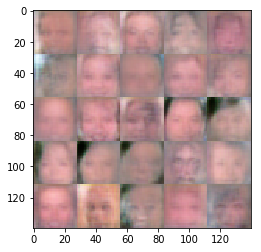

Epoch 1/1 ___  Discriminator Loss: 0.9316 ___ Generator Loss: 1.1706
Epoch 1/1 ___  Discriminator Loss: 1.3188 ___ Generator Loss: 0.6041
Epoch 1/1 ___  Discriminator Loss: 0.8819 ___ Generator Loss: 1.1938
Epoch 1/1 ___  Discriminator Loss: 1.1963 ___ Generator Loss: 0.6575
Epoch 1/1 ___  Discriminator Loss: 1.1801 ___ Generator Loss: 1.7650
Epoch 1/1 ___  Discriminator Loss: 0.8924 ___ Generator Loss: 1.3183
Epoch 1/1 ___  Discriminator Loss: 1.3629 ___ Generator Loss: 1.2664
Epoch 1/1 ___  Discriminator Loss: 1.0800 ___ Generator Loss: 0.7930
Epoch 1/1 ___  Discriminator Loss: 1.0412 ___ Generator Loss: 1.1807
Epoch 1/1 ___  Discriminator Loss: 0.7333 ___ Generator Loss: 1.7509


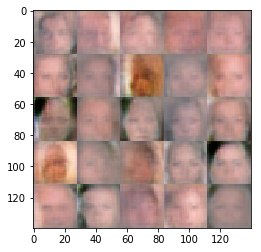

Epoch 1/1 ___  Discriminator Loss: 1.1009 ___ Generator Loss: 0.8194
Epoch 1/1 ___  Discriminator Loss: 1.4388 ___ Generator Loss: 0.4615
Epoch 1/1 ___  Discriminator Loss: 0.7656 ___ Generator Loss: 1.4703
Epoch 1/1 ___  Discriminator Loss: 0.7816 ___ Generator Loss: 2.1326
Epoch 1/1 ___  Discriminator Loss: 1.1470 ___ Generator Loss: 0.7210
Epoch 1/1 ___  Discriminator Loss: 0.8511 ___ Generator Loss: 1.0858
Epoch 1/1 ___  Discriminator Loss: 0.9735 ___ Generator Loss: 1.5063
Epoch 1/1 ___  Discriminator Loss: 0.9572 ___ Generator Loss: 1.0364
Epoch 1/1 ___  Discriminator Loss: 1.0885 ___ Generator Loss: 0.9356
Epoch 1/1 ___  Discriminator Loss: 0.9802 ___ Generator Loss: 1.1452


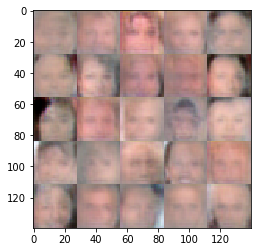

Epoch 1/1 ___  Discriminator Loss: 1.4296 ___ Generator Loss: 2.3568
Epoch 1/1 ___  Discriminator Loss: 1.0902 ___ Generator Loss: 0.8116
Epoch 1/1 ___  Discriminator Loss: 0.8492 ___ Generator Loss: 1.1847
Epoch 1/1 ___  Discriminator Loss: 1.0823 ___ Generator Loss: 1.8700
Epoch 1/1 ___  Discriminator Loss: 0.9788 ___ Generator Loss: 1.1099
Epoch 1/1 ___  Discriminator Loss: 0.8867 ___ Generator Loss: 2.5719
Epoch 1/1 ___  Discriminator Loss: 1.2649 ___ Generator Loss: 0.6165
Epoch 1/1 ___  Discriminator Loss: 1.3553 ___ Generator Loss: 0.7188
Epoch 1/1 ___  Discriminator Loss: 1.0249 ___ Generator Loss: 1.0531
Epoch 1/1 ___  Discriminator Loss: 0.9496 ___ Generator Loss: 1.2997


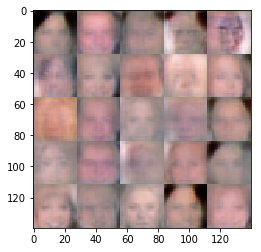

Epoch 1/1 ___  Discriminator Loss: 1.1533 ___ Generator Loss: 0.8369
Epoch 1/1 ___  Discriminator Loss: 0.8763 ___ Generator Loss: 2.3625
Epoch 1/1 ___  Discriminator Loss: 1.0272 ___ Generator Loss: 1.1937
Epoch 1/1 ___  Discriminator Loss: 1.8540 ___ Generator Loss: 0.2994
Epoch 1/1 ___  Discriminator Loss: 1.1058 ___ Generator Loss: 0.8448
Epoch 1/1 ___  Discriminator Loss: 1.2235 ___ Generator Loss: 0.7799
Epoch 1/1 ___  Discriminator Loss: 0.7997 ___ Generator Loss: 1.2925
Epoch 1/1 ___  Discriminator Loss: 0.9082 ___ Generator Loss: 1.4052
Epoch 1/1 ___  Discriminator Loss: 1.1422 ___ Generator Loss: 1.0358
Epoch 1/1 ___  Discriminator Loss: 0.9546 ___ Generator Loss: 0.9294


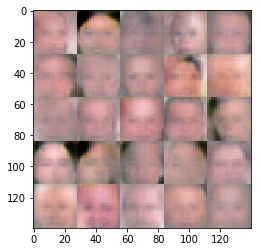

Epoch 1/1 ___  Discriminator Loss: 1.0914 ___ Generator Loss: 0.8049
Epoch 1/1 ___  Discriminator Loss: 1.1091 ___ Generator Loss: 2.0835
Epoch 1/1 ___  Discriminator Loss: 0.9754 ___ Generator Loss: 1.6735
Epoch 1/1 ___  Discriminator Loss: 1.1535 ___ Generator Loss: 0.7331
Epoch 1/1 ___  Discriminator Loss: 1.0235 ___ Generator Loss: 1.4801
Epoch 1/1 ___  Discriminator Loss: 0.8862 ___ Generator Loss: 1.4210
Epoch 1/1 ___  Discriminator Loss: 1.3865 ___ Generator Loss: 0.5998
Epoch 1/1 ___  Discriminator Loss: 1.0151 ___ Generator Loss: 1.3845
Epoch 1/1 ___  Discriminator Loss: 1.2838 ___ Generator Loss: 0.6589
Epoch 1/1 ___  Discriminator Loss: 0.6071 ___ Generator Loss: 2.1321


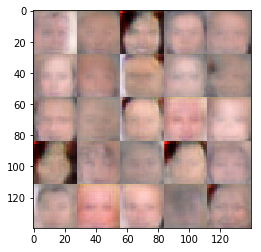

Epoch 1/1 ___  Discriminator Loss: 1.2175 ___ Generator Loss: 0.7547
Epoch 1/1 ___  Discriminator Loss: 0.9535 ___ Generator Loss: 1.3432
Epoch 1/1 ___  Discriminator Loss: 0.9157 ___ Generator Loss: 1.4046
Epoch 1/1 ___  Discriminator Loss: 1.0014 ___ Generator Loss: 1.4688
Epoch 1/1 ___  Discriminator Loss: 0.6881 ___ Generator Loss: 1.5920
Epoch 1/1 ___  Discriminator Loss: 1.2433 ___ Generator Loss: 0.6142
Epoch 1/1 ___  Discriminator Loss: 0.9941 ___ Generator Loss: 1.3056
Epoch 1/1 ___  Discriminator Loss: 0.7994 ___ Generator Loss: 1.2108
Epoch 1/1 ___  Discriminator Loss: 1.2950 ___ Generator Loss: 1.4491
Epoch 1/1 ___  Discriminator Loss: 1.1402 ___ Generator Loss: 1.5775


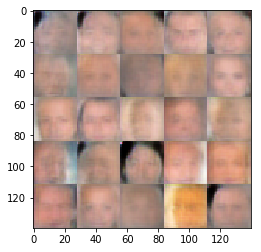

Epoch 1/1 ___  Discriminator Loss: 1.1182 ___ Generator Loss: 0.8211
Epoch 1/1 ___  Discriminator Loss: 0.9719 ___ Generator Loss: 1.1219
Epoch 1/1 ___  Discriminator Loss: 1.0906 ___ Generator Loss: 0.8673
Epoch 1/1 ___  Discriminator Loss: 1.1070 ___ Generator Loss: 1.0116
Epoch 1/1 ___  Discriminator Loss: 0.8932 ___ Generator Loss: 1.1683
Epoch 1/1 ___  Discriminator Loss: 1.1938 ___ Generator Loss: 0.8781
Epoch 1/1 ___  Discriminator Loss: 1.1396 ___ Generator Loss: 0.7980
Epoch 1/1 ___  Discriminator Loss: 1.0169 ___ Generator Loss: 1.1601
Epoch 1/1 ___  Discriminator Loss: 1.5230 ___ Generator Loss: 0.4069
Epoch 1/1 ___  Discriminator Loss: 1.1180 ___ Generator Loss: 0.7995


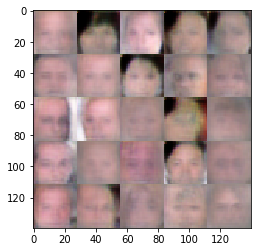

Epoch 1/1 ___  Discriminator Loss: 1.3203 ___ Generator Loss: 0.6911
Epoch 1/1 ___  Discriminator Loss: 1.5334 ___ Generator Loss: 0.4239
Epoch 1/1 ___  Discriminator Loss: 1.3823 ___ Generator Loss: 0.5477
Epoch 1/1 ___  Discriminator Loss: 1.1912 ___ Generator Loss: 0.7006
Epoch 1/1 ___  Discriminator Loss: 1.0457 ___ Generator Loss: 1.1105
Epoch 1/1 ___  Discriminator Loss: 0.9114 ___ Generator Loss: 1.0410
Epoch 1/1 ___  Discriminator Loss: 1.0930 ___ Generator Loss: 0.9657
Epoch 1/1 ___  Discriminator Loss: 0.8545 ___ Generator Loss: 1.4680
Epoch 1/1 ___  Discriminator Loss: 0.9821 ___ Generator Loss: 1.0761
Epoch 1/1 ___  Discriminator Loss: 1.2592 ___ Generator Loss: 0.6830


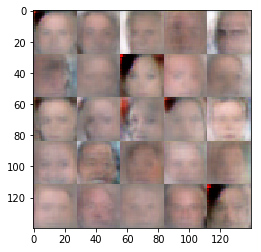

Epoch 1/1 ___  Discriminator Loss: 0.8699 ___ Generator Loss: 1.0946
Epoch 1/1 ___  Discriminator Loss: 1.0320 ___ Generator Loss: 1.2561
Epoch 1/1 ___  Discriminator Loss: 0.9470 ___ Generator Loss: 0.9751
Epoch 1/1 ___  Discriminator Loss: 1.3161 ___ Generator Loss: 0.5767
Epoch 1/1 ___  Discriminator Loss: 0.9210 ___ Generator Loss: 1.2262
Epoch 1/1 ___  Discriminator Loss: 1.1111 ___ Generator Loss: 1.0520
Epoch 1/1 ___  Discriminator Loss: 0.9876 ___ Generator Loss: 1.2418
Epoch 1/1 ___  Discriminator Loss: 1.1134 ___ Generator Loss: 1.5433
Epoch 1/1 ___  Discriminator Loss: 1.2899 ___ Generator Loss: 0.5882
Epoch 1/1 ___  Discriminator Loss: 1.1254 ___ Generator Loss: 1.9432


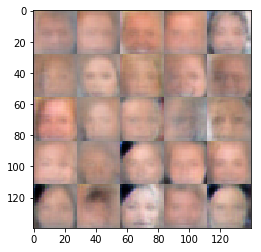

Epoch 1/1 ___  Discriminator Loss: 1.5550 ___ Generator Loss: 0.4171
Epoch 1/1 ___  Discriminator Loss: 1.0245 ___ Generator Loss: 1.2261
Epoch 1/1 ___  Discriminator Loss: 0.8373 ___ Generator Loss: 1.2802
Epoch 1/1 ___  Discriminator Loss: 1.1365 ___ Generator Loss: 0.7729
Epoch 1/1 ___  Discriminator Loss: 1.3601 ___ Generator Loss: 0.5232
Epoch 1/1 ___  Discriminator Loss: 0.9018 ___ Generator Loss: 1.2077
Epoch 1/1 ___  Discriminator Loss: 1.0495 ___ Generator Loss: 0.8382
Epoch 1/1 ___  Discriminator Loss: 1.1628 ___ Generator Loss: 0.8030
Epoch 1/1 ___  Discriminator Loss: 1.1239 ___ Generator Loss: 0.7453
Epoch 1/1 ___  Discriminator Loss: 1.0753 ___ Generator Loss: 1.0136


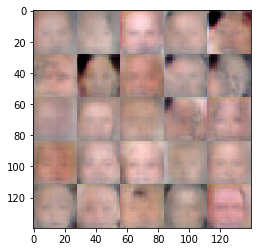

Epoch 1/1 ___  Discriminator Loss: 0.7684 ___ Generator Loss: 1.7866
Epoch 1/1 ___  Discriminator Loss: 1.1838 ___ Generator Loss: 0.6606
Epoch 1/1 ___  Discriminator Loss: 1.0862 ___ Generator Loss: 1.4391
Epoch 1/1 ___  Discriminator Loss: 1.1264 ___ Generator Loss: 0.8643
Epoch 1/1 ___  Discriminator Loss: 1.0823 ___ Generator Loss: 2.3710
Epoch 1/1 ___  Discriminator Loss: 1.0456 ___ Generator Loss: 0.9762
Epoch 1/1 ___  Discriminator Loss: 1.7385 ___ Generator Loss: 0.3486
Epoch 1/1 ___  Discriminator Loss: 0.9648 ___ Generator Loss: 1.1993
Epoch 1/1 ___  Discriminator Loss: 1.1227 ___ Generator Loss: 0.9645
Epoch 1/1 ___  Discriminator Loss: 0.8711 ___ Generator Loss: 1.0329


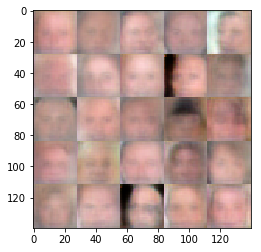

Epoch 1/1 ___  Discriminator Loss: 1.1874 ___ Generator Loss: 0.6868
Epoch 1/1 ___  Discriminator Loss: 1.0754 ___ Generator Loss: 1.2626
Epoch 1/1 ___  Discriminator Loss: 1.0607 ___ Generator Loss: 1.0200
Epoch 1/1 ___  Discriminator Loss: 1.3103 ___ Generator Loss: 0.5402
Epoch 1/1 ___  Discriminator Loss: 1.0489 ___ Generator Loss: 0.9554
Epoch 1/1 ___  Discriminator Loss: 0.5512 ___ Generator Loss: 2.0016
Epoch 1/1 ___  Discriminator Loss: 0.8694 ___ Generator Loss: 1.6132
Epoch 1/1 ___  Discriminator Loss: 1.4931 ___ Generator Loss: 0.4182
Epoch 1/1 ___  Discriminator Loss: 1.7744 ___ Generator Loss: 0.3234
Epoch 1/1 ___  Discriminator Loss: 1.1739 ___ Generator Loss: 0.7040


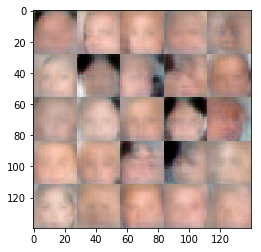

Epoch 1/1 ___  Discriminator Loss: 0.6608 ___ Generator Loss: 2.1468
Epoch 1/1 ___  Discriminator Loss: 0.8428 ___ Generator Loss: 1.7001
Epoch 1/1 ___  Discriminator Loss: 0.8287 ___ Generator Loss: 2.0925
Epoch 1/1 ___  Discriminator Loss: 1.0690 ___ Generator Loss: 1.8922
Epoch 1/1 ___  Discriminator Loss: 1.2999 ___ Generator Loss: 0.6503
Epoch 1/1 ___  Discriminator Loss: 1.0691 ___ Generator Loss: 1.0138
Epoch 1/1 ___  Discriminator Loss: 1.1808 ___ Generator Loss: 2.3951
Epoch 1/1 ___  Discriminator Loss: 1.2468 ___ Generator Loss: 0.5832
Epoch 1/1 ___  Discriminator Loss: 1.0259 ___ Generator Loss: 0.9699
Epoch 1/1 ___  Discriminator Loss: 1.2916 ___ Generator Loss: 0.6425


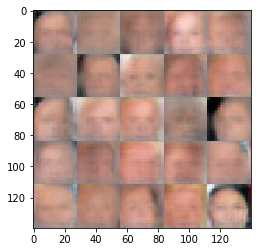

Epoch 1/1 ___  Discriminator Loss: 1.2795 ___ Generator Loss: 3.7049
Epoch 1/1 ___  Discriminator Loss: 1.0033 ___ Generator Loss: 0.9063
Epoch 1/1 ___  Discriminator Loss: 0.8593 ___ Generator Loss: 1.4540
Epoch 1/1 ___  Discriminator Loss: 1.0526 ___ Generator Loss: 0.9114
Epoch 1/1 ___  Discriminator Loss: 1.3282 ___ Generator Loss: 0.5578
Epoch 1/1 ___  Discriminator Loss: 1.0144 ___ Generator Loss: 0.8723
Epoch 1/1 ___  Discriminator Loss: 0.7761 ___ Generator Loss: 1.8371
Epoch 1/1 ___  Discriminator Loss: 1.3267 ___ Generator Loss: 0.5295
Epoch 1/1 ___  Discriminator Loss: 1.2268 ___ Generator Loss: 0.6433
Epoch 1/1 ___  Discriminator Loss: 1.0914 ___ Generator Loss: 0.7776


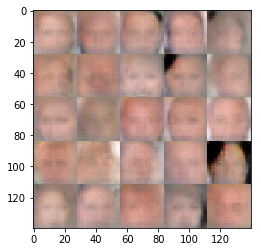

Epoch 1/1 ___  Discriminator Loss: 1.1269 ___ Generator Loss: 0.7762
Epoch 1/1 ___  Discriminator Loss: 1.1525 ___ Generator Loss: 0.7212
Epoch 1/1 ___  Discriminator Loss: 1.1118 ___ Generator Loss: 0.7485
Epoch 1/1 ___  Discriminator Loss: 1.1820 ___ Generator Loss: 0.6960
Epoch 1/1 ___  Discriminator Loss: 1.0301 ___ Generator Loss: 0.9634
Epoch 1/1 ___  Discriminator Loss: 0.9271 ___ Generator Loss: 1.8038
Epoch 1/1 ___  Discriminator Loss: 0.5649 ___ Generator Loss: 2.1482
Epoch 1/1 ___  Discriminator Loss: 1.2105 ___ Generator Loss: 0.6321
Epoch 1/1 ___  Discriminator Loss: 1.1057 ___ Generator Loss: 0.8824
Epoch 1/1 ___  Discriminator Loss: 1.1999 ___ Generator Loss: 0.6986


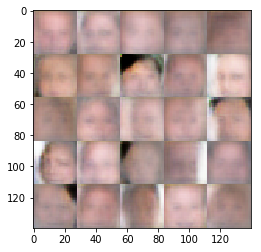

Epoch 1/1 ___  Discriminator Loss: 1.0601 ___ Generator Loss: 0.8494
Epoch 1/1 ___  Discriminator Loss: 2.2031 ___ Generator Loss: 3.3291
Epoch 1/1 ___  Discriminator Loss: 1.9786 ___ Generator Loss: 2.7896
Epoch 1/1 ___  Discriminator Loss: 1.0016 ___ Generator Loss: 1.3408
Epoch 1/1 ___  Discriminator Loss: 0.9475 ___ Generator Loss: 1.3097
Epoch 1/1 ___  Discriminator Loss: 0.9901 ___ Generator Loss: 0.9414
Epoch 1/1 ___  Discriminator Loss: 0.5889 ___ Generator Loss: 2.4726
Epoch 1/1 ___  Discriminator Loss: 1.0661 ___ Generator Loss: 1.2221
Epoch 1/1 ___  Discriminator Loss: 0.8884 ___ Generator Loss: 1.0121
Epoch 1/1 ___  Discriminator Loss: 1.1236 ___ Generator Loss: 1.4194


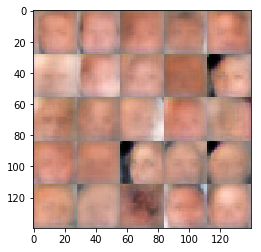

Epoch 1/1 ___  Discriminator Loss: 0.6436 ___ Generator Loss: 1.6564
Epoch 1/1 ___  Discriminator Loss: 0.9644 ___ Generator Loss: 0.8976
Epoch 1/1 ___  Discriminator Loss: 0.9149 ___ Generator Loss: 1.0331
Epoch 1/1 ___  Discriminator Loss: 1.2059 ___ Generator Loss: 0.7069
Epoch 1/1 ___  Discriminator Loss: 0.6476 ___ Generator Loss: 1.5822
Epoch 1/1 ___  Discriminator Loss: 1.0028 ___ Generator Loss: 0.9363
Epoch 1/1 ___  Discriminator Loss: 0.8325 ___ Generator Loss: 1.4367
Epoch 1/1 ___  Discriminator Loss: 1.4025 ___ Generator Loss: 0.4978
Epoch 1/1 ___  Discriminator Loss: 1.0047 ___ Generator Loss: 1.1295
Epoch 1/1 ___  Discriminator Loss: 0.8049 ___ Generator Loss: 2.2805


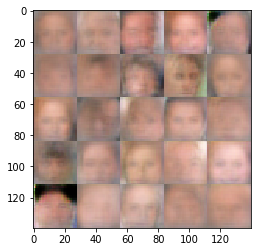

Epoch 1/1 ___  Discriminator Loss: 0.9642 ___ Generator Loss: 0.9561
Epoch 1/1 ___  Discriminator Loss: 1.4692 ___ Generator Loss: 0.4745
Epoch 1/1 ___  Discriminator Loss: 1.1347 ___ Generator Loss: 1.4034
Epoch 1/1 ___  Discriminator Loss: 0.9386 ___ Generator Loss: 1.5086
Epoch 1/1 ___  Discriminator Loss: 0.7785 ___ Generator Loss: 2.2887
Epoch 1/1 ___  Discriminator Loss: 1.1175 ___ Generator Loss: 0.7782
Epoch 1/1 ___  Discriminator Loss: 1.0706 ___ Generator Loss: 0.8621
Epoch 1/1 ___  Discriminator Loss: 1.0224 ___ Generator Loss: 1.3034
Epoch 1/1 ___  Discriminator Loss: 1.0750 ___ Generator Loss: 1.0617
Epoch 1/1 ___  Discriminator Loss: 1.0594 ___ Generator Loss: 0.8404


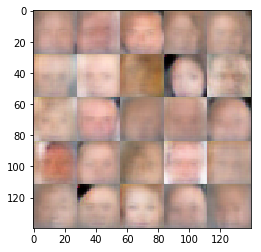

Epoch 1/1 ___  Discriminator Loss: 1.3407 ___ Generator Loss: 0.5552
Epoch 1/1 ___  Discriminator Loss: 1.2983 ___ Generator Loss: 0.5976
Epoch 1/1 ___  Discriminator Loss: 1.1761 ___ Generator Loss: 0.6528
Epoch 1/1 ___  Discriminator Loss: 0.9054 ___ Generator Loss: 1.3050
Epoch 1/1 ___  Discriminator Loss: 0.9734 ___ Generator Loss: 0.9128
Epoch 1/1 ___  Discriminator Loss: 1.0433 ___ Generator Loss: 0.8371
Epoch 1/1 ___  Discriminator Loss: 0.9292 ___ Generator Loss: 1.0669
Epoch 1/1 ___  Discriminator Loss: 1.2071 ___ Generator Loss: 0.6868
Epoch 1/1 ___  Discriminator Loss: 1.0300 ___ Generator Loss: 1.1509
Epoch 1/1 ___  Discriminator Loss: 1.2796 ___ Generator Loss: 0.5555


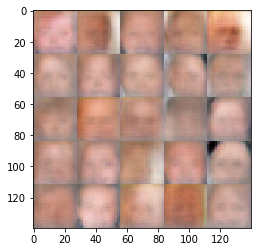

Epoch 1/1 ___  Discriminator Loss: 1.0998 ___ Generator Loss: 0.9339
Epoch 1/1 ___  Discriminator Loss: 0.9504 ___ Generator Loss: 1.0255
Epoch 1/1 ___  Discriminator Loss: 0.9305 ___ Generator Loss: 1.2518
Epoch 1/1 ___  Discriminator Loss: 0.9490 ___ Generator Loss: 1.0392
Epoch 1/1 ___  Discriminator Loss: 1.0508 ___ Generator Loss: 0.8617
Epoch 1/1 ___  Discriminator Loss: 1.0359 ___ Generator Loss: 1.1500
Epoch 1/1 ___  Discriminator Loss: 0.8203 ___ Generator Loss: 1.5913
Epoch 1/1 ___  Discriminator Loss: 0.9719 ___ Generator Loss: 0.9878
Epoch 1/1 ___  Discriminator Loss: 1.0190 ___ Generator Loss: 1.4818
Epoch 1/1 ___  Discriminator Loss: 0.9303 ___ Generator Loss: 1.2939


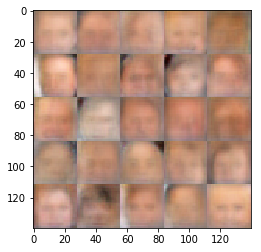

Epoch 1/1 ___  Discriminator Loss: 1.1560 ___ Generator Loss: 0.7478
Epoch 1/1 ___  Discriminator Loss: 0.8657 ___ Generator Loss: 1.1030
Epoch 1/1 ___  Discriminator Loss: 0.8883 ___ Generator Loss: 1.3614
Epoch 1/1 ___  Discriminator Loss: 1.3766 ___ Generator Loss: 0.4753
Epoch 1/1 ___  Discriminator Loss: 1.1464 ___ Generator Loss: 0.6831
Epoch 1/1 ___  Discriminator Loss: 1.1534 ___ Generator Loss: 0.8673
Epoch 1/1 ___  Discriminator Loss: 1.2739 ___ Generator Loss: 0.5998
Epoch 1/1 ___  Discriminator Loss: 1.0736 ___ Generator Loss: 0.7203
Epoch 1/1 ___  Discriminator Loss: 1.7599 ___ Generator Loss: 0.3118
Epoch 1/1 ___  Discriminator Loss: 1.0625 ___ Generator Loss: 1.0060


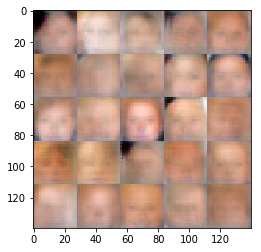

Epoch 1/1 ___  Discriminator Loss: 1.0487 ___ Generator Loss: 1.2349
Epoch 1/1 ___  Discriminator Loss: 0.7008 ___ Generator Loss: 2.0700
Epoch 1/1 ___  Discriminator Loss: 1.0177 ___ Generator Loss: 1.0740
Epoch 1/1 ___  Discriminator Loss: 1.1116 ___ Generator Loss: 0.6987
Epoch 1/1 ___  Discriminator Loss: 0.9425 ___ Generator Loss: 0.9997
Epoch 1/1 ___  Discriminator Loss: 1.3646 ___ Generator Loss: 0.5001
Epoch 1/1 ___  Discriminator Loss: 1.0373 ___ Generator Loss: 0.8529
Epoch 1/1 ___  Discriminator Loss: 1.0558 ___ Generator Loss: 0.7614
Epoch 1/1 ___  Discriminator Loss: 1.3855 ___ Generator Loss: 0.5125
Epoch 1/1 ___  Discriminator Loss: 1.1744 ___ Generator Loss: 0.6622


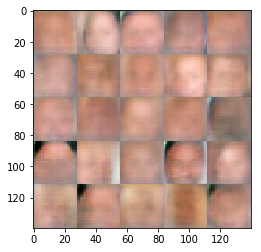

Epoch 1/1 ___  Discriminator Loss: 0.9207 ___ Generator Loss: 2.8987
Epoch 1/1 ___  Discriminator Loss: 1.7480 ___ Generator Loss: 0.3264
Epoch 1/1 ___  Discriminator Loss: 1.2797 ___ Generator Loss: 0.6062
Epoch 1/1 ___  Discriminator Loss: 0.9249 ___ Generator Loss: 1.1272
Epoch 1/1 ___  Discriminator Loss: 0.9931 ___ Generator Loss: 0.9944
Epoch 1/1 ___  Discriminator Loss: 1.1879 ___ Generator Loss: 0.7355
Epoch 1/1 ___  Discriminator Loss: 1.0595 ___ Generator Loss: 1.8668
Epoch 1/1 ___  Discriminator Loss: 0.8294 ___ Generator Loss: 1.3085
Epoch 1/1 ___  Discriminator Loss: 1.1928 ___ Generator Loss: 2.1699
Epoch 1/1 ___  Discriminator Loss: 0.5762 ___ Generator Loss: 2.3606


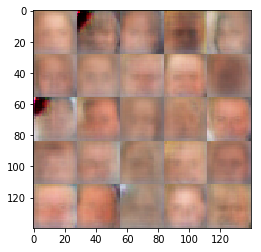

Epoch 1/1 ___  Discriminator Loss: 0.7865 ___ Generator Loss: 1.6131
Epoch 1/1 ___  Discriminator Loss: 0.9255 ___ Generator Loss: 1.6200
Epoch 1/1 ___  Discriminator Loss: 1.0699 ___ Generator Loss: 0.8915
Epoch 1/1 ___  Discriminator Loss: 1.1652 ___ Generator Loss: 0.7029
Epoch 1/1 ___  Discriminator Loss: 1.1480 ___ Generator Loss: 0.7651
Epoch 1/1 ___  Discriminator Loss: 1.2669 ___ Generator Loss: 0.5935
Epoch 1/1 ___  Discriminator Loss: 1.0434 ___ Generator Loss: 0.8784
Epoch 1/1 ___  Discriminator Loss: 1.3284 ___ Generator Loss: 0.5277
Epoch 1/1 ___  Discriminator Loss: 0.9905 ___ Generator Loss: 1.0947
Epoch 1/1 ___  Discriminator Loss: 0.9517 ___ Generator Loss: 1.0225


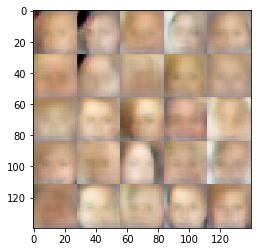

Epoch 1/1 ___  Discriminator Loss: 0.6402 ___ Generator Loss: 1.5626
Epoch 1/1 ___  Discriminator Loss: 1.0447 ___ Generator Loss: 0.7805
Epoch 1/1 ___  Discriminator Loss: 0.8797 ___ Generator Loss: 1.1481
Epoch 1/1 ___  Discriminator Loss: 0.5796 ___ Generator Loss: 2.2029
Epoch 1/1 ___  Discriminator Loss: 1.2357 ___ Generator Loss: 0.6084
Epoch 1/1 ___  Discriminator Loss: 0.7914 ___ Generator Loss: 1.7115
Epoch 1/1 ___  Discriminator Loss: 0.8827 ___ Generator Loss: 1.7296
Epoch 1/1 ___  Discriminator Loss: 1.0676 ___ Generator Loss: 0.7813
Epoch 1/1 ___  Discriminator Loss: 1.0098 ___ Generator Loss: 1.3224
Epoch 1/1 ___  Discriminator Loss: 1.2849 ___ Generator Loss: 2.4987


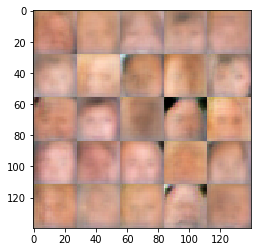

Epoch 1/1 ___  Discriminator Loss: 1.0115 ___ Generator Loss: 0.8670
Epoch 1/1 ___  Discriminator Loss: 1.0774 ___ Generator Loss: 1.6645
Epoch 1/1 ___  Discriminator Loss: 1.1561 ___ Generator Loss: 0.7243
Epoch 1/1 ___  Discriminator Loss: 1.1523 ___ Generator Loss: 0.7175
Epoch 1/1 ___  Discriminator Loss: 0.8776 ___ Generator Loss: 1.5449
Epoch 1/1 ___  Discriminator Loss: 0.7991 ___ Generator Loss: 1.2744
Epoch 1/1 ___  Discriminator Loss: 0.9027 ___ Generator Loss: 1.1475
Epoch 1/1 ___  Discriminator Loss: 1.1318 ___ Generator Loss: 0.8337
Epoch 1/1 ___  Discriminator Loss: 0.9344 ___ Generator Loss: 1.1227
Epoch 1/1 ___  Discriminator Loss: 1.0602 ___ Generator Loss: 0.8096


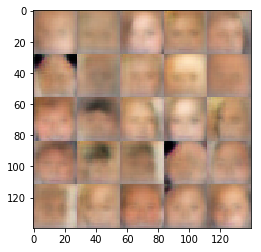

Epoch 1/1 ___  Discriminator Loss: 0.9227 ___ Generator Loss: 1.0011
Epoch 1/1 ___  Discriminator Loss: 1.0717 ___ Generator Loss: 0.8586
Epoch 1/1 ___  Discriminator Loss: 0.9372 ___ Generator Loss: 1.0445
Epoch 1/1 ___  Discriminator Loss: 0.6242 ___ Generator Loss: 1.8429
Epoch 1/1 ___  Discriminator Loss: 0.8902 ___ Generator Loss: 1.0152
Epoch 1/1 ___  Discriminator Loss: 1.0056 ___ Generator Loss: 1.9651
Epoch 1/1 ___  Discriminator Loss: 1.1348 ___ Generator Loss: 0.7479
Epoch 1/1 ___  Discriminator Loss: 1.1620 ___ Generator Loss: 0.7058
Epoch 1/1 ___  Discriminator Loss: 0.8157 ___ Generator Loss: 1.1788
Epoch 1/1 ___  Discriminator Loss: 0.9418 ___ Generator Loss: 1.1442


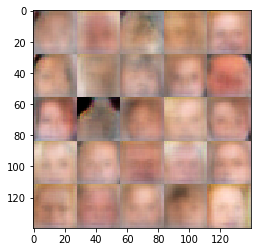

Epoch 1/1 ___  Discriminator Loss: 1.0167 ___ Generator Loss: 0.9752
Epoch 1/1 ___  Discriminator Loss: 1.4165 ___ Generator Loss: 0.5201
Epoch 1/1 ___  Discriminator Loss: 1.1137 ___ Generator Loss: 0.7489
Epoch 1/1 ___  Discriminator Loss: 1.6369 ___ Generator Loss: 2.8686
Epoch 1/1 ___  Discriminator Loss: 1.7504 ___ Generator Loss: 0.4077
Epoch 1/1 ___  Discriminator Loss: 1.6375 ___ Generator Loss: 0.5612
Epoch 1/1 ___  Discriminator Loss: 1.6506 ___ Generator Loss: 0.5545
Epoch 1/1 ___  Discriminator Loss: 1.4861 ___ Generator Loss: 2.0858
Epoch 1/1 ___  Discriminator Loss: 1.1129 ___ Generator Loss: 0.9110
Epoch 1/1 ___  Discriminator Loss: 1.4022 ___ Generator Loss: 0.4799


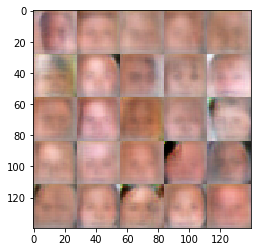

Epoch 1/1 ___  Discriminator Loss: 1.1288 ___ Generator Loss: 0.7790
Epoch 1/1 ___  Discriminator Loss: 1.0133 ___ Generator Loss: 0.9080
Epoch 1/1 ___  Discriminator Loss: 0.6497 ___ Generator Loss: 1.9548
Epoch 1/1 ___  Discriminator Loss: 0.9607 ___ Generator Loss: 1.1317
Epoch 1/1 ___  Discriminator Loss: 1.4398 ___ Generator Loss: 0.4761
Epoch 1/1 ___  Discriminator Loss: 0.7134 ___ Generator Loss: 1.5683
Epoch 1/1 ___  Discriminator Loss: 0.9496 ___ Generator Loss: 1.1904
Epoch 1/1 ___  Discriminator Loss: 0.9030 ___ Generator Loss: 1.2809
Epoch 1/1 ___  Discriminator Loss: 0.8808 ___ Generator Loss: 1.5842
Epoch 1/1 ___  Discriminator Loss: 1.3731 ___ Generator Loss: 0.5263


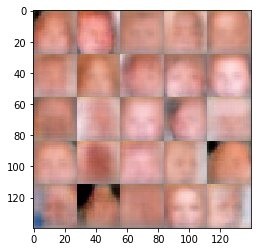

Epoch 1/1 ___  Discriminator Loss: 0.9102 ___ Generator Loss: 1.5350
Epoch 1/1 ___  Discriminator Loss: 0.5449 ___ Generator Loss: 3.0042
Epoch 1/1 ___  Discriminator Loss: 1.0599 ___ Generator Loss: 1.8665
Epoch 1/1 ___  Discriminator Loss: 1.0098 ___ Generator Loss: 0.9087
Epoch 1/1 ___  Discriminator Loss: 0.8842 ___ Generator Loss: 1.2068
Epoch 1/1 ___  Discriminator Loss: 0.8546 ___ Generator Loss: 1.4842
Epoch 1/1 ___  Discriminator Loss: 1.1467 ___ Generator Loss: 0.7421
Epoch 1/1 ___  Discriminator Loss: 0.9068 ___ Generator Loss: 2.1503
Epoch 1/1 ___  Discriminator Loss: 1.2773 ___ Generator Loss: 0.6089
Epoch 1/1 ___  Discriminator Loss: 0.5990 ___ Generator Loss: 2.0844


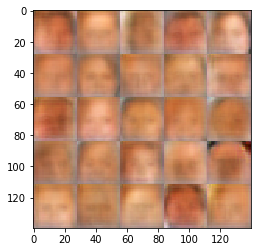

Epoch 1/1 ___  Discriminator Loss: 0.9940 ___ Generator Loss: 0.9067
Epoch 1/1 ___  Discriminator Loss: 0.9002 ___ Generator Loss: 1.0071
Epoch 1/1 ___  Discriminator Loss: 0.9514 ___ Generator Loss: 1.0882
Epoch 1/1 ___  Discriminator Loss: 1.2670 ___ Generator Loss: 0.5999
Epoch 1/1 ___  Discriminator Loss: 0.9986 ___ Generator Loss: 0.8885
Epoch 1/1 ___  Discriminator Loss: 0.9113 ___ Generator Loss: 1.1388
Epoch 1/1 ___  Discriminator Loss: 0.9480 ___ Generator Loss: 1.1697
Epoch 1/1 ___  Discriminator Loss: 1.1319 ___ Generator Loss: 0.7327
Epoch 1/1 ___  Discriminator Loss: 0.9397 ___ Generator Loss: 0.9866
Epoch 1/1 ___  Discriminator Loss: 1.1762 ___ Generator Loss: 0.6654


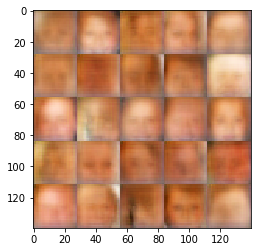

Epoch 1/1 ___  Discriminator Loss: 0.9565 ___ Generator Loss: 0.9403
Epoch 1/1 ___  Discriminator Loss: 0.9367 ___ Generator Loss: 1.1537
Epoch 1/1 ___  Discriminator Loss: 1.0004 ___ Generator Loss: 0.9147
Epoch 1/1 ___  Discriminator Loss: 0.9117 ___ Generator Loss: 1.2981
Epoch 1/1 ___  Discriminator Loss: 1.1786 ___ Generator Loss: 0.7084
Epoch 1/1 ___  Discriminator Loss: 0.9287 ___ Generator Loss: 1.4763
Epoch 1/1 ___  Discriminator Loss: 0.4190 ___ Generator Loss: 3.6599
Epoch 1/1 ___  Discriminator Loss: 0.8124 ___ Generator Loss: 1.4905
Epoch 1/1 ___  Discriminator Loss: 1.8967 ___ Generator Loss: 0.2996
Epoch 1/1 ___  Discriminator Loss: 0.9830 ___ Generator Loss: 1.2222


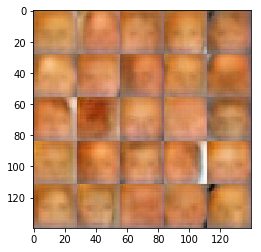

Epoch 1/1 ___  Discriminator Loss: 1.1171 ___ Generator Loss: 1.0781
Epoch 1/1 ___  Discriminator Loss: 1.2938 ___ Generator Loss: 1.4191
Epoch 1/1 ___  Discriminator Loss: 1.3441 ___ Generator Loss: 2.6357
Epoch 1/1 ___  Discriminator Loss: 1.1163 ___ Generator Loss: 0.7546
Epoch 1/1 ___  Discriminator Loss: 0.8640 ___ Generator Loss: 1.1013
Epoch 1/1 ___  Discriminator Loss: 1.0706 ___ Generator Loss: 0.7793
Epoch 1/1 ___  Discriminator Loss: 0.9021 ___ Generator Loss: 1.2622
Epoch 1/1 ___  Discriminator Loss: 0.8565 ___ Generator Loss: 1.2198
Epoch 1/1 ___  Discriminator Loss: 0.5369 ___ Generator Loss: 2.5781
Epoch 1/1 ___  Discriminator Loss: 1.4076 ___ Generator Loss: 0.5208


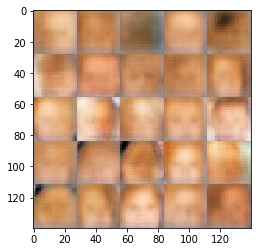

Epoch 1/1 ___  Discriminator Loss: 0.9331 ___ Generator Loss: 1.4573
Epoch 1/1 ___  Discriminator Loss: 0.8248 ___ Generator Loss: 1.7686
Epoch 1/1 ___  Discriminator Loss: 0.9838 ___ Generator Loss: 0.8542
Epoch 1/1 ___  Discriminator Loss: 0.8554 ___ Generator Loss: 1.5622
Epoch 1/1 ___  Discriminator Loss: 0.7119 ___ Generator Loss: 1.3508
Epoch 1/1 ___  Discriminator Loss: 1.3083 ___ Generator Loss: 0.5714
Epoch 1/1 ___  Discriminator Loss: 0.8240 ___ Generator Loss: 1.7180
Epoch 1/1 ___  Discriminator Loss: 0.8939 ___ Generator Loss: 1.1466
Epoch 1/1 ___  Discriminator Loss: 0.6245 ___ Generator Loss: 2.3207
Epoch 1/1 ___  Discriminator Loss: 0.8098 ___ Generator Loss: 1.4600


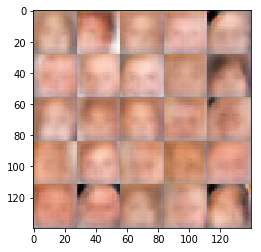

Epoch 1/1 ___  Discriminator Loss: 0.8787 ___ Generator Loss: 1.0829
Epoch 1/1 ___  Discriminator Loss: 0.9261 ___ Generator Loss: 1.2171
Epoch 1/1 ___  Discriminator Loss: 1.1807 ___ Generator Loss: 0.6397
Epoch 1/1 ___  Discriminator Loss: 0.9466 ___ Generator Loss: 1.3712
Epoch 1/1 ___  Discriminator Loss: 0.9555 ___ Generator Loss: 1.0557
Epoch 1/1 ___  Discriminator Loss: 0.9213 ___ Generator Loss: 1.1843
Epoch 1/1 ___  Discriminator Loss: 0.5470 ___ Generator Loss: 2.6632
Epoch 1/1 ___  Discriminator Loss: 0.9466 ___ Generator Loss: 1.1277
Epoch 1/1 ___  Discriminator Loss: 0.9515 ___ Generator Loss: 1.0287
Epoch 1/1 ___  Discriminator Loss: 1.4123 ___ Generator Loss: 0.5076


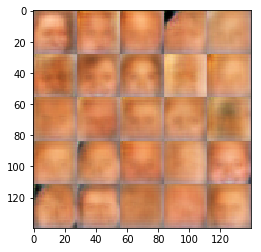

Epoch 1/1 ___  Discriminator Loss: 1.2619 ___ Generator Loss: 1.9203
Epoch 1/1 ___  Discriminator Loss: 0.7030 ___ Generator Loss: 1.7644
Epoch 1/1 ___  Discriminator Loss: 1.0892 ___ Generator Loss: 0.9822
Epoch 1/1 ___  Discriminator Loss: 0.9672 ___ Generator Loss: 0.9775
Epoch 1/1 ___  Discriminator Loss: 0.9412 ___ Generator Loss: 0.9961
Epoch 1/1 ___  Discriminator Loss: 1.2218 ___ Generator Loss: 0.6420
Epoch 1/1 ___  Discriminator Loss: 1.0142 ___ Generator Loss: 0.9683
Epoch 1/1 ___  Discriminator Loss: 1.4396 ___ Generator Loss: 0.4629
Epoch 1/1 ___  Discriminator Loss: 2.1794 ___ Generator Loss: 3.5977
Epoch 1/1 ___  Discriminator Loss: 1.1464 ___ Generator Loss: 2.1701


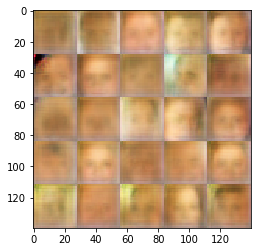

Epoch 1/1 ___  Discriminator Loss: 1.0555 ___ Generator Loss: 0.8249
Epoch 1/1 ___  Discriminator Loss: 1.0384 ___ Generator Loss: 0.9042
Epoch 1/1 ___  Discriminator Loss: 1.0276 ___ Generator Loss: 0.9101
Epoch 1/1 ___  Discriminator Loss: 0.8987 ___ Generator Loss: 1.1439
Epoch 1/1 ___  Discriminator Loss: 1.0039 ___ Generator Loss: 0.9909
Epoch 1/1 ___  Discriminator Loss: 1.0839 ___ Generator Loss: 0.7197
Epoch 1/1 ___  Discriminator Loss: 0.9142 ___ Generator Loss: 1.2597
Epoch 1/1 ___  Discriminator Loss: 1.0200 ___ Generator Loss: 0.8639
Epoch 1/1 ___  Discriminator Loss: 0.9409 ___ Generator Loss: 2.6248
Epoch 1/1 ___  Discriminator Loss: 1.0248 ___ Generator Loss: 0.9123


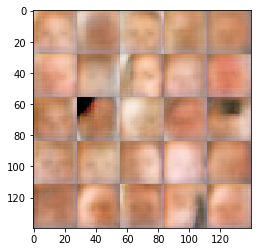

Epoch 1/1 ___  Discriminator Loss: 1.2536 ___ Generator Loss: 0.5986
Epoch 1/1 ___  Discriminator Loss: 1.4844 ___ Generator Loss: 0.4506
Epoch 1/1 ___  Discriminator Loss: 1.0239 ___ Generator Loss: 0.9239
Epoch 1/1 ___  Discriminator Loss: 0.9053 ___ Generator Loss: 1.0864
Epoch 1/1 ___  Discriminator Loss: 1.0733 ___ Generator Loss: 0.8470
Epoch 1/1 ___  Discriminator Loss: 0.9165 ___ Generator Loss: 1.2682
Epoch 1/1 ___  Discriminator Loss: 1.0759 ___ Generator Loss: 0.7371
Epoch 1/1 ___  Discriminator Loss: 1.0859 ___ Generator Loss: 0.8769
Epoch 1/1 ___  Discriminator Loss: 1.1544 ___ Generator Loss: 0.6836
Epoch 1/1 ___  Discriminator Loss: 1.2282 ___ Generator Loss: 0.6656


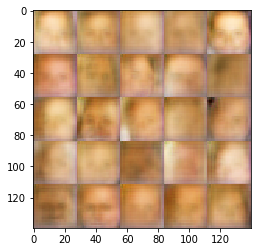

Epoch 1/1 ___  Discriminator Loss: 1.2912 ___ Generator Loss: 0.5739
Epoch 1/1 ___  Discriminator Loss: 1.0889 ___ Generator Loss: 0.7252
Epoch 1/1 ___  Discriminator Loss: 0.8200 ___ Generator Loss: 1.1810


In [89]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.